# Week9: GAN

## 实验要求与基本流程

### 实验要求
1. 结合理论课内容，深入理解GAN(Generative Adversarial Networks,生成对抗网络)的原理与训练过程.了解GAN网络结构的演变过程与几个基本的GAN的原理(如DCGAN,wGAN等.)
2. 阅读实验指导书的实验内容,按照提示运行以及补充实验代码,或者简要回答问题.提交作业时,保留实验结果.


### 实验流程
* GAN的网络结构与训练
* DCGAN
* LSGAN
* WGAN
* WGAN-GP

## GAN(Generative Adversarial Networks)

让我们先来看一个只是用线性层的生成对抗网络(GAN),来简单了解一下GAN的基本网络结构与训练过程.

这个GAN网络结构分为两部分,生成器网络Generator和判别器网络Discriminator.
- 生成器Generator将随机生成的噪声z通过多个线性层生成图片,注意生成器的最后一层是Tanh,所以我们生成的图片的取值范围为\[-1,1\],同理,我们会将真实图片归一化(normalize)到\[-1,1\].
- 而判别器Discriminator是一个二分类器,通过多个线性层得到一个概率值来判别图片是"真实"或者是"生成"的,所以在Discriminator的最后是一个sigmoid,来得到图片是"真实"的概率.

在所有的网络结构中我们都使用了LeakyReLU作为激活函数,除了G与D的最后一层,同时,我们在层与层之间我们还加入了BatchNormalization.

In [1]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
class Generator(nn.Module):
    def __init__(self, image_size=32, latent_dim=100, output_channel=1):
        """
        image_size: image with and height
        latent dim: the dimension of random noise z
        output_channel: the channel of generated image, for example, 1 for gray image, 3 for RGB image
        """
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        self.image_size = image_size
        
        # Linear layer: latent_dim -> 128 -> 256 -> 512 -> 1024 -> output_channel * image_size * image_size -> Tanh
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Linear(1024, output_channel * image_size * image_size),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), self.output_channel, self.image_size, self.image_size)
        return img


class Discriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1):
        """
        image_size: image with and height
        input_channel: the channel of input image, for example, 1 for gray image, 3 for RGB image
        """
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        
        # Linear layer: input_channel * image_size * image_size -> 1024 -> 512 -> 256 -> 1 -> Sigmoid
        self.model = nn.Sequential(
            nn.Linear(input_channel * image_size * image_size, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        out = self.model(img_flat)
        return out

### 数据集
在训练我们的GAN网络之前, 先介绍一下本次实验可训练GAN的数据集,我们提供了两个数据集来供大家进行尝试数据集.
- MNIST手写体3类数据集,这里为了加快我们的训练速度,我们提供了一个简化版本的只包含数字0,2的2类MNIST数据集,每类各1000张.图片为28\*28的单通道灰度图(我们将其resize到32\*32),对于GAN而言,我们不需要测试集.我们本次实验主要使用该数据集作为主要的训练数据集.


- 室内家具数据集.为了加快我们的训练速度,我们将其做了删减处理,仅包含chair等一个类,共500张.图片为32\*32的3通道彩色图片.



下面是两个加载数据集的函数.注意我们将所有图片normalize到了\[-1,1\]之间.


In [3]:
def load_mnist_data():
    """
    load mnist(0,1,2) dataset 
    """
    
    transform = torchvision.transforms.Compose([
        # transform to 1-channel gray image since we reading image in RGB mode
        transforms.Grayscale(1),
        # resize image from 28 * 28 to 32 * 32
        transforms.Resize(32),
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, ), 
                             std=(0.5, ))
        ])
    
    train_dataset = torchvision.datasets.ImageFolder(root='./data/mnist', transform=transform)
    
    return train_dataset

def load_furniture_data():
    """
    load furniture dataset 
    """
    transform = torchvision.transforms.Compose([
        transforms.ToTensor(),
        # normalize with mean=0.5 std=0.5
        transforms.Normalize(mean=(0.5, 0.5, 0.5), 
                             std=(0.5, 0.5, 0.5))
        ])
    train_dataset = torchvision.datasets.ImageFolder(root='./data/household_furniture', transform=transform)
    return train_dataset

(*无需阅读理解*)运行下面2个cell的代码来查看两个数据集中的20张随机真实图片.

In [4]:
def denorm(x):
    # denormalize
    out = (x + 1) / 2
    return out.clamp(0, 1)

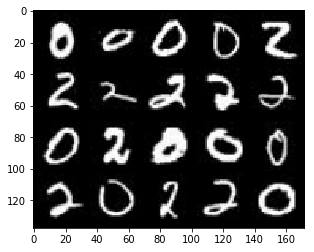

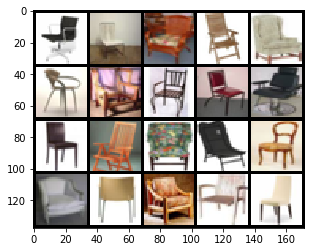

In [5]:
from utils import show
"""
you can pass code in this cell
"""
# show mnist real data
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))
# show furniture real data
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=20, shuffle=True)
show(torchvision.utils.make_grid(denorm(next(iter(trainloader))[0]), nrow=5))

下面代码实现GAN在一个epoch内的训练过程.

大体而言,GAN的训练过程分为两步,首先将随机噪声z喂给G,生成图片,然后将真实图片和G生成的图片喂给D,然后使用对应的loss函数反向传播优化D.然后再次使用G生成图片,并喂给D,并使用对应的loss函数反向传播优化G.

下面的图片是普通的GAN在G和D上的优化目标:
![gan_d](./pictures/gan_d.png)
![gan_g](./pictures/gan_g.png)
值得注意的是,上述图片描述的是G和D的**优化目标**,而在具体实现过程中,我们实现loss函数来达到优化目标.对于上图中D与G的优化目标我们可以使用Binary Cross Entroy损失函数来实现:
$$
BCEloss(p_i,y_i)= -(y_i\log{p_i}+(1−y_i)\log{(1−p_i)})
$$
$p_i$, $y_i$分别是模型的预测值与图片的真实标签(1为真,0为假).因此,对于D,最大化其优化目标可以通过最小化一个BCEloss来实现,其真实图片$x\sim{P_r}$的标签设置为1,而生成图片$z\sim{P(z)}$的标签设置为0.我们可以看到这样的损失函数相当于对D的优化目标加上负号.

而对于G,也通过最小化一个BCEloss来实现,即将生成图片$z\sim{P(z)}$的标签设置为1即可,我们可以看到这样的损失函数与其优化目标是一致的.

In [5]:
def train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, z_dim):
    """
    train a GAN with model G and D in one epoch
    Args:
        trainloader: data loader to train
        G: model Generator
        D: model Discriminator
        G_optimizer: optimizer of G(etc. Adam, SGD)
        D_optimizer: optimizer of D(etc. Adam, SGD)
        loss_func: loss function to train G and D. For example, Binary Cross Entropy(BCE) loss function
        device: cpu or cuda device
        z_dim: the dimension of random noise z
    """
    # set train mode
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        # real label and fake label
        y_real = torch.ones(x.size(0), 1).to(device)
        y_fake = torch.zeros(x.size(0), 1).to(device)
        
        x = x.to(device)
        z = torch.rand(x.size(0), z_dim).to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = loss_func(d_real, y_real)
        
        # D fake loss from fake images generated by G
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = loss_func(d_fake, y_fake)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()

        # update G network
        # G optimizer zero grads
        G_optimizer.zero_grad()
        
        # G loss
        g_z = G(z)
        d_fake = D(g_z)
        g_loss = loss_func(d_fake, y_real)
        
        # G backward and step
        g_loss.backward()
        G_optimizer.step()
        
        D_total_loss += d_loss.item()
        G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss / len(trainloader)

当模型训练后,我们需要查看此时G生成的图片效果,下面的visualize_results代码便实现了这块内容.注意,我们生成的图片都在\[-1,1\],因此,我们需要将图片反向归一化(denorm)到\[0,1\].

In [6]:
def visualize_results(G, device, z_dim, result_size=20):
    G.eval()
    
    z = torch.rand(result_size, z_dim).to(device)
    g_z = G(z)
    
    show(torchvision.utils.make_grid(denorm(g_z.detach().cpu()), nrow=5))

万事具备,接下来让我们来尝试这训练一个基本的GAN网络吧.这里实现run_gan函数来调用train以及visualize_results来训练我们的GAN.

In [7]:
def run_gan(trainloader, G, D, G_optimizer, D_optimizer, loss_func, n_epochs, device, latent_dim):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = train(trainloader, G, D, G_optimizer, D_optimizer, loss_func, device, 
                               z_dim=latent_dim)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

设置好超参数就可以开始训练!让我们尝试用它来训练2类的mnist数据集

In [8]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model
G = Generator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = Discriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 1.1754, G loss: 0.7449


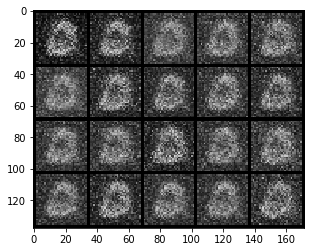

Epoch 1: Train D loss: 1.2277, G loss: 0.9523
Epoch 2: Train D loss: 1.2141, G loss: 0.9915
Epoch 3: Train D loss: 1.1915, G loss: 0.9988
Epoch 4: Train D loss: 1.1348, G loss: 1.0566
Epoch 5: Train D loss: 1.1178, G loss: 1.0923
Epoch 6: Train D loss: 1.0870, G loss: 1.1474
Epoch 7: Train D loss: 1.0809, G loss: 1.2316
Epoch 8: Train D loss: 1.0311, G loss: 1.3112
Epoch 9: Train D loss: 1.0861, G loss: 1.2610


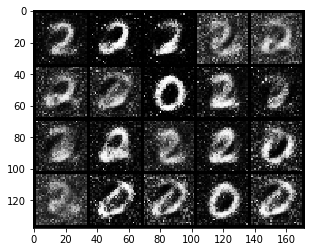

Epoch 10: Train D loss: 1.0938, G loss: 1.2699
Epoch 11: Train D loss: 1.0936, G loss: 1.2273
Epoch 12: Train D loss: 1.0790, G loss: 1.2852
Epoch 13: Train D loss: 1.1092, G loss: 1.2673
Epoch 14: Train D loss: 1.0824, G loss: 1.3008
Epoch 15: Train D loss: 1.0793, G loss: 1.3313
Epoch 16: Train D loss: 1.0986, G loss: 1.2805
Epoch 17: Train D loss: 1.1052, G loss: 1.3129
Epoch 18: Train D loss: 1.0749, G loss: 1.2916
Epoch 19: Train D loss: 1.0802, G loss: 1.3612


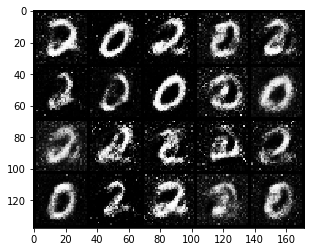

Epoch 20: Train D loss: 1.0759, G loss: 1.3071
Epoch 21: Train D loss: 1.0918, G loss: 1.3265
Epoch 22: Train D loss: 1.0812, G loss: 1.3018
Epoch 23: Train D loss: 1.1310, G loss: 1.2559
Epoch 24: Train D loss: 1.0983, G loss: 1.2537
Epoch 25: Train D loss: 1.1221, G loss: 1.2673
Epoch 26: Train D loss: 1.1116, G loss: 1.2798
Epoch 27: Train D loss: 1.1199, G loss: 1.2678
Epoch 28: Train D loss: 1.1203, G loss: 1.2394
Epoch 29: Train D loss: 1.1276, G loss: 1.2469


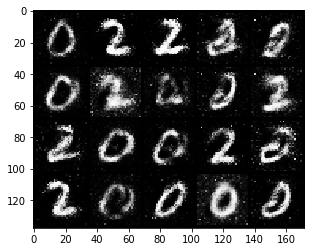

Epoch 30: Train D loss: 1.1247, G loss: 1.2301
Epoch 31: Train D loss: 1.1166, G loss: 1.2479
Epoch 32: Train D loss: 1.1226, G loss: 1.2881
Epoch 33: Train D loss: 1.1286, G loss: 1.2037
Epoch 34: Train D loss: 1.1444, G loss: 1.1890
Epoch 35: Train D loss: 1.1621, G loss: 1.1883
Epoch 36: Train D loss: 1.1531, G loss: 1.1810
Epoch 37: Train D loss: 1.1365, G loss: 1.2055
Epoch 38: Train D loss: 1.1508, G loss: 1.1642
Epoch 39: Train D loss: 1.1616, G loss: 1.1568


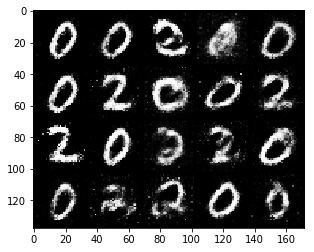

Epoch 40: Train D loss: 1.1578, G loss: 1.1716
Epoch 41: Train D loss: 1.1735, G loss: 1.1730
Epoch 42: Train D loss: 1.1485, G loss: 1.1623
Epoch 43: Train D loss: 1.1658, G loss: 1.1719
Epoch 44: Train D loss: 1.1694, G loss: 1.1666
Epoch 45: Train D loss: 1.1670, G loss: 1.1550
Epoch 46: Train D loss: 1.1504, G loss: 1.1736
Epoch 47: Train D loss: 1.1557, G loss: 1.1826
Epoch 48: Train D loss: 1.1431, G loss: 1.1969
Epoch 49: Train D loss: 1.1472, G loss: 1.2002


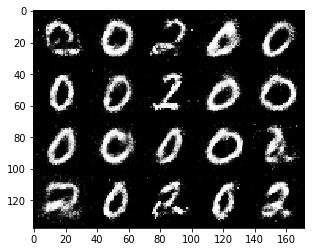

Epoch 50: Train D loss: 1.1479, G loss: 1.1884
Epoch 51: Train D loss: 1.1565, G loss: 1.2030
Epoch 52: Train D loss: 1.1273, G loss: 1.2320
Epoch 53: Train D loss: 1.1381, G loss: 1.2349
Epoch 54: Train D loss: 1.1227, G loss: 1.2634
Epoch 55: Train D loss: 1.1654, G loss: 1.2129
Epoch 56: Train D loss: 1.1430, G loss: 1.2189
Epoch 57: Train D loss: 1.1313, G loss: 1.2234
Epoch 58: Train D loss: 1.1432, G loss: 1.2435
Epoch 59: Train D loss: 1.1048, G loss: 1.2525


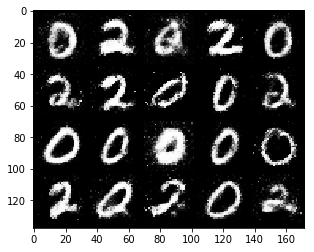

Epoch 60: Train D loss: 1.1468, G loss: 1.2516
Epoch 61: Train D loss: 1.1246, G loss: 1.2696
Epoch 62: Train D loss: 1.1208, G loss: 1.2576
Epoch 63: Train D loss: 1.1309, G loss: 1.2379
Epoch 64: Train D loss: 1.1339, G loss: 1.2329
Epoch 65: Train D loss: 1.1088, G loss: 1.2823
Epoch 66: Train D loss: 1.0978, G loss: 1.2851
Epoch 67: Train D loss: 1.1075, G loss: 1.2472
Epoch 68: Train D loss: 1.1196, G loss: 1.3002
Epoch 69: Train D loss: 1.1194, G loss: 1.2688


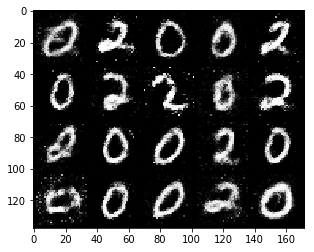

Epoch 70: Train D loss: 1.1236, G loss: 1.2869
Epoch 71: Train D loss: 1.1024, G loss: 1.2983
Epoch 72: Train D loss: 1.0887, G loss: 1.2827
Epoch 73: Train D loss: 1.1085, G loss: 1.2868
Epoch 74: Train D loss: 1.0870, G loss: 1.3247
Epoch 75: Train D loss: 1.1355, G loss: 1.2831
Epoch 76: Train D loss: 1.1046, G loss: 1.2703
Epoch 77: Train D loss: 1.0902, G loss: 1.3214
Epoch 78: Train D loss: 1.0845, G loss: 1.3275
Epoch 79: Train D loss: 1.0748, G loss: 1.3540


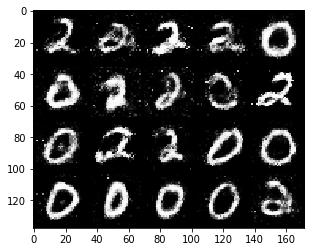

Epoch 80: Train D loss: 1.0793, G loss: 1.3610
Epoch 81: Train D loss: 1.0720, G loss: 1.3626
Epoch 82: Train D loss: 1.0816, G loss: 1.3582
Epoch 83: Train D loss: 1.0778, G loss: 1.3876
Epoch 84: Train D loss: 1.0792, G loss: 1.3685
Epoch 85: Train D loss: 1.0574, G loss: 1.3660
Epoch 86: Train D loss: 1.0596, G loss: 1.3996
Epoch 87: Train D loss: 1.0504, G loss: 1.3879
Epoch 88: Train D loss: 1.0531, G loss: 1.4028
Epoch 89: Train D loss: 1.0570, G loss: 1.4161


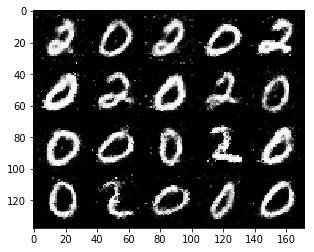

Epoch 90: Train D loss: 1.0157, G loss: 1.4593
Epoch 91: Train D loss: 1.0468, G loss: 1.4437
Epoch 92: Train D loss: 1.0539, G loss: 1.4645
Epoch 93: Train D loss: 1.0230, G loss: 1.4549
Epoch 94: Train D loss: 1.0330, G loss: 1.4927
Epoch 95: Train D loss: 1.0297, G loss: 1.4600
Epoch 96: Train D loss: 1.0317, G loss: 1.4602
Epoch 97: Train D loss: 0.9912, G loss: 1.5234
Epoch 98: Train D loss: 1.0135, G loss: 1.5055
Epoch 99: Train D loss: 1.0295, G loss: 1.4634


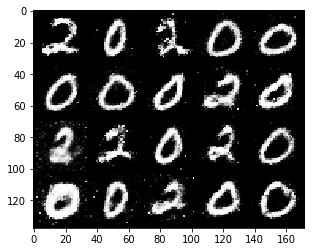

In [10]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)
    

训练完后,让我们来看一下G生成的图片效果,可以看到即使是一个简单的GAN在这种简单的数据集上的生成效果还是不错的,虽然仍然存在不少瑕疵,比如说我们可以看到生成的图片上的数字有很多奇怪的雪花等等.

让我们看一下G和D的loss变化曲线(运行下方语句.)

In [9]:
from utils import loss_plot

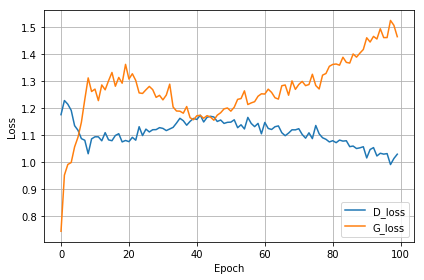

In [12]:
loss_plot(d_loss_hist, g_loss_hist)

#### **作业**:
观察G与D的loss曲线,与之前的训练的CNN的loss曲线相比,有什么不同?试简要回答你觉得可能产生这样的不同的原因.

**答:**
1. 首先在之前的训练的CNN中loss曲线通常都会呈一个下降的趋势，但是在上面的曲线图中，我们可以看到当D_loss下降的时候，G_loss反而上升；D_loss上升的时候，G_loss则会下降。
2. 这是因为，在GAN中，G和D的loss是相互对抗的，G生成器希望自己生成的图像可以欺骗D识别器的分类，所以当G表现得特别强的时候，D则会被欺骗到，从而loss值升高；而D识别器是为了判断出G生成器生成的图片为假，所以当D识别功能很强的时候，G无法欺骗到D，则会导致G的loss值上升。

## DCGAN

在DCGAN(Deep Convolution GAN)中,最大的改变是使用了CNN代替全连接层.在生成器G中,使用stride为2的转置卷积来生成图片同时扩大图片尺寸,而在判别器D中,使用stride为2的卷积来将图片进行卷积并下采样.除此之外,DCGAN加入了在层与层之间BatchNormalization(虽然我们在普通的GAN中就已经添加),在G中使用ReLU作为激活函数,而在D中使用LeakyReLU作为激活函数.

In [10]:
from utils import initialize_weights
class DCGenerator(nn.Module):
    def __init__(self, image_size=32, latent_dim=64, output_channel=1):
        super(DCGenerator, self).__init__()
        self.image_size = image_size
        self.latent_dim = latent_dim
        self.output_channel = output_channel
        
        self.init_size = image_size // 8
        
        # fc: Linear -> BN -> ReLU
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 512 * self.init_size ** 2),
            nn.BatchNorm1d(512 * self.init_size ** 2),
            nn.ReLU(inplace=True)
        )
        
        # deconv: ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> BN -> ReLU -> 
        #         ConvTranspose2d(4, 2, 1) -> Tanh
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, output_channel, 4, stride=2, padding=1),
            nn.Tanh(),
        )
        initialize_weights(self)

    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 512, self.init_size, self.init_size)
        img = self.deconv(out)
        return img


class DCDiscriminator(nn.Module):
    def __init__(self, image_size=32, input_channel=1, sigmoid=True):
        super(DCDiscriminator, self).__init__()
        self.image_size = image_size
        self.input_channel = input_channel
        self.fc_size = image_size // 8
        
        # conv: Conv2d(3,2,1) -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        #       Conv2d(3,2,1) -> BN -> LeakyReLU 
        self.conv = nn.Sequential(
            nn.Conv2d(input_channel, 128, 3, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 3, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 3, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
        )
        
        # fc: Linear -> Sigmoid
        self.fc = nn.Sequential(
            nn.Linear(512 * self.fc_size * self.fc_size, 1),
        )
        if sigmoid:
            self.fc.add_module('sigmoid', nn.Sigmoid())
        initialize_weights(self)
        
        

    def forward(self, img):
        out = self.conv(img)
        out = out.view(out.shape[0], -1)
        out = self.fc(out)

        return out

同样的,我们使用同样的mnist数据集对DCGAN进行训练.

In [11]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use BCELoss as loss function
bceloss = nn.BCELoss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.2800, G loss: 5.2395


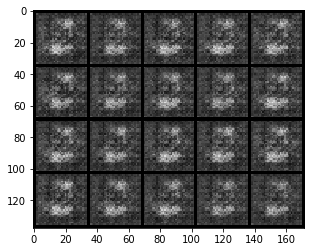

Epoch 1: Train D loss: 0.1942, G loss: 6.0716
Epoch 2: Train D loss: 0.3037, G loss: 6.8410
Epoch 3: Train D loss: 0.1666, G loss: 4.7519
Epoch 4: Train D loss: 0.2797, G loss: 4.6549
Epoch 5: Train D loss: 0.4741, G loss: 3.3431
Epoch 6: Train D loss: 0.4976, G loss: 3.2996
Epoch 7: Train D loss: 0.6186, G loss: 2.6461
Epoch 8: Train D loss: 0.3817, G loss: 2.9151
Epoch 9: Train D loss: 0.5645, G loss: 2.7062


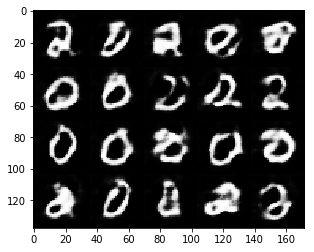

Epoch 10: Train D loss: 0.5813, G loss: 2.8965
Epoch 11: Train D loss: 0.7651, G loss: 1.8284
Epoch 12: Train D loss: 0.4370, G loss: 2.5860
Epoch 13: Train D loss: 0.5192, G loss: 2.6317
Epoch 14: Train D loss: 0.6582, G loss: 2.3353
Epoch 15: Train D loss: 0.4578, G loss: 2.6086
Epoch 16: Train D loss: 0.7193, G loss: 2.4274
Epoch 17: Train D loss: 0.5036, G loss: 2.5319
Epoch 18: Train D loss: 0.5148, G loss: 2.7835
Epoch 19: Train D loss: 0.6424, G loss: 2.4262


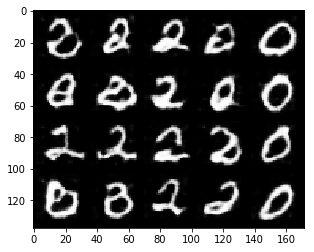

Epoch 20: Train D loss: 0.5414, G loss: 2.4791
Epoch 21: Train D loss: 0.5101, G loss: 2.6746
Epoch 22: Train D loss: 0.3726, G loss: 2.8318
Epoch 23: Train D loss: 0.6366, G loss: 2.7251
Epoch 24: Train D loss: 0.4081, G loss: 2.8503
Epoch 25: Train D loss: 0.3875, G loss: 3.0586
Epoch 26: Train D loss: 0.3545, G loss: 3.1515
Epoch 27: Train D loss: 0.4545, G loss: 3.0017
Epoch 28: Train D loss: 0.2434, G loss: 3.3888
Epoch 29: Train D loss: 0.3884, G loss: 3.3360


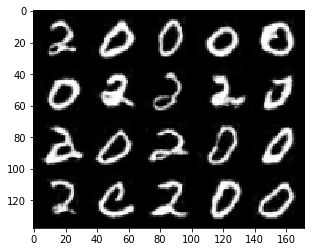

Epoch 30: Train D loss: 0.4251, G loss: 3.3445
Epoch 31: Train D loss: 0.2739, G loss: 3.3051
Epoch 32: Train D loss: 0.5275, G loss: 3.1853
Epoch 33: Train D loss: 0.3727, G loss: 3.2527
Epoch 34: Train D loss: 0.1212, G loss: 3.7827
Epoch 35: Train D loss: 0.5905, G loss: 3.1871
Epoch 36: Train D loss: 0.1690, G loss: 3.6934
Epoch 37: Train D loss: 0.2837, G loss: 4.1159
Epoch 38: Train D loss: 0.0902, G loss: 4.0726
Epoch 39: Train D loss: 0.4733, G loss: 3.9082


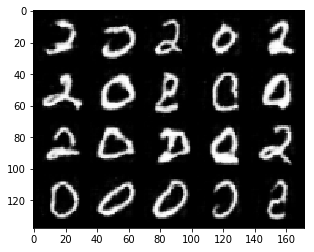

Epoch 40: Train D loss: 0.3419, G loss: 3.1521
Epoch 41: Train D loss: 0.0968, G loss: 4.0581
Epoch 42: Train D loss: 0.0909, G loss: 4.4138
Epoch 43: Train D loss: 0.7185, G loss: 4.3345
Epoch 44: Train D loss: 0.7727, G loss: 2.4910
Epoch 45: Train D loss: 0.1842, G loss: 3.4652
Epoch 46: Train D loss: 0.6806, G loss: 3.0999
Epoch 47: Train D loss: 0.0946, G loss: 3.9095
Epoch 48: Train D loss: 0.0516, G loss: 4.4739
Epoch 49: Train D loss: 0.0503, G loss: 4.6896


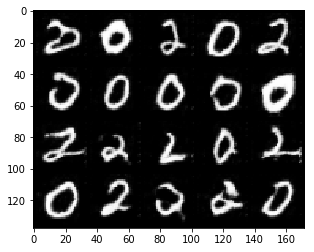

Epoch 50: Train D loss: 0.0388, G loss: 4.8619
Epoch 51: Train D loss: 0.0385, G loss: 4.9505
Epoch 52: Train D loss: 0.4412, G loss: 4.8061
Epoch 53: Train D loss: 0.6380, G loss: 2.5458
Epoch 54: Train D loss: 0.4136, G loss: 3.1544
Epoch 55: Train D loss: 0.0997, G loss: 4.0831
Epoch 56: Train D loss: 0.0532, G loss: 4.5991
Epoch 57: Train D loss: 0.0366, G loss: 4.8802
Epoch 58: Train D loss: 0.0253, G loss: 5.1477
Epoch 59: Train D loss: 0.0281, G loss: 5.2008


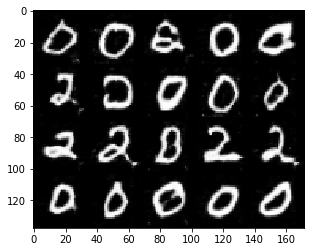

Epoch 60: Train D loss: 0.0244, G loss: 5.3361
Epoch 61: Train D loss: 0.0244, G loss: 5.4509
Epoch 62: Train D loss: 0.0187, G loss: 5.5786
Epoch 63: Train D loss: 0.0192, G loss: 5.6810
Epoch 64: Train D loss: 0.0204, G loss: 5.7164
Epoch 65: Train D loss: 0.7812, G loss: 5.7662
Epoch 66: Train D loss: 0.8062, G loss: 2.0954
Epoch 67: Train D loss: 0.3857, G loss: 3.5387
Epoch 68: Train D loss: 0.0961, G loss: 4.2546
Epoch 69: Train D loss: 0.0466, G loss: 4.7542


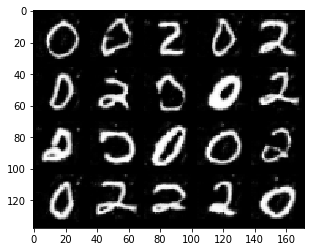

Epoch 70: Train D loss: 0.0347, G loss: 5.0592
Epoch 71: Train D loss: 0.0295, G loss: 5.2633
Epoch 72: Train D loss: 0.0203, G loss: 5.4628
Epoch 73: Train D loss: 0.0197, G loss: 5.6071
Epoch 74: Train D loss: 0.0151, G loss: 5.7455
Epoch 75: Train D loss: 0.7408, G loss: 4.3623
Epoch 76: Train D loss: 0.6438, G loss: 2.5552
Epoch 77: Train D loss: 0.5581, G loss: 3.3657
Epoch 78: Train D loss: 0.1921, G loss: 3.6470
Epoch 79: Train D loss: 0.0562, G loss: 4.6894


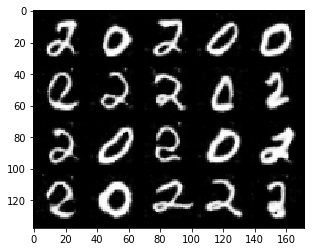

Epoch 80: Train D loss: 0.4420, G loss: 3.9230
Epoch 81: Train D loss: 0.0703, G loss: 4.5231
Epoch 82: Train D loss: 0.0326, G loss: 5.1153
Epoch 83: Train D loss: 0.0201, G loss: 5.4545
Epoch 84: Train D loss: 0.0189, G loss: 5.6485
Epoch 85: Train D loss: 0.0160, G loss: 5.7706
Epoch 86: Train D loss: 0.0128, G loss: 5.9080
Epoch 87: Train D loss: 0.0112, G loss: 6.0209
Epoch 88: Train D loss: 0.0101, G loss: 6.1304
Epoch 89: Train D loss: 0.0105, G loss: 6.1015


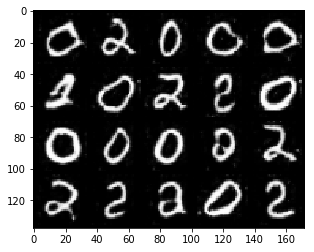

Epoch 90: Train D loss: 0.0102, G loss: 6.1966
Epoch 91: Train D loss: 0.0110, G loss: 6.2414
Epoch 92: Train D loss: 0.0088, G loss: 6.3432
Epoch 93: Train D loss: 0.0083, G loss: 6.4322
Epoch 94: Train D loss: 0.0086, G loss: 6.4624
Epoch 95: Train D loss: 0.0110, G loss: 6.5219
Epoch 96: Train D loss: 0.0074, G loss: 6.6879
Epoch 97: Train D loss: 0.0068, G loss: 6.6951
Epoch 98: Train D loss: 0.0068, G loss: 6.7180
Epoch 99: Train D loss: 0.0065, G loss: 6.7872


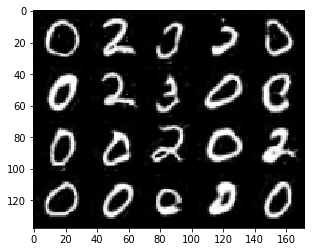

In [15]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

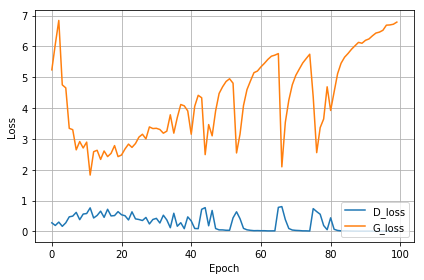

In [16]:
loss_plot(d_loss_hist, g_loss_hist)

可以看到,DCGAN的生成图片质量比起只有线性层的GAN要好不少.接下来,让我们尝试使用家具数据集来训练DCGAN.

Epoch 0: Train D loss: 0.8920, G loss: 3.6839


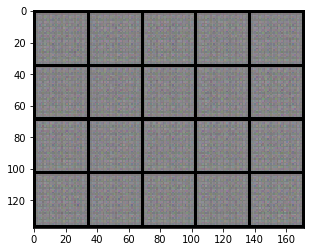

Epoch 1: Train D loss: 0.3599, G loss: 5.8891
Epoch 2: Train D loss: 0.2231, G loss: 6.2561
Epoch 3: Train D loss: 0.1888, G loss: 6.3690
Epoch 4: Train D loss: 0.3330, G loss: 6.9658
Epoch 5: Train D loss: 0.2046, G loss: 6.2946
Epoch 6: Train D loss: 0.0776, G loss: 5.3053
Epoch 7: Train D loss: 0.0734, G loss: 6.2035
Epoch 8: Train D loss: 0.0680, G loss: 6.0806
Epoch 9: Train D loss: 0.0642, G loss: 6.1292


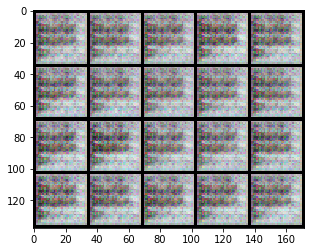

Epoch 10: Train D loss: 0.0597, G loss: 5.8826
Epoch 11: Train D loss: 0.4050, G loss: 7.4907
Epoch 12: Train D loss: 0.2538, G loss: 5.3438
Epoch 13: Train D loss: 0.7018, G loss: 4.7209
Epoch 14: Train D loss: 0.3464, G loss: 3.6195
Epoch 15: Train D loss: 0.2579, G loss: 4.7390
Epoch 16: Train D loss: 0.1941, G loss: 5.0060
Epoch 17: Train D loss: 0.3210, G loss: 6.5701
Epoch 18: Train D loss: 0.4964, G loss: 4.9093
Epoch 19: Train D loss: 0.1724, G loss: 4.9860


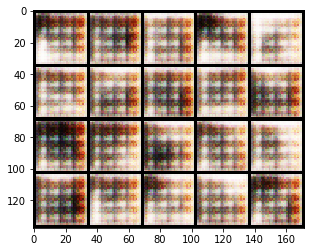

Epoch 20: Train D loss: 0.3989, G loss: 5.7797
Epoch 21: Train D loss: 0.2736, G loss: 5.0703
Epoch 22: Train D loss: 0.4489, G loss: 5.2567
Epoch 23: Train D loss: 0.3218, G loss: 4.6001
Epoch 24: Train D loss: 0.2235, G loss: 4.5699
Epoch 25: Train D loss: 0.4641, G loss: 5.5171
Epoch 26: Train D loss: 0.2820, G loss: 4.4391
Epoch 27: Train D loss: 0.2801, G loss: 5.1488
Epoch 28: Train D loss: 0.2512, G loss: 4.8101
Epoch 29: Train D loss: 0.2610, G loss: 5.0623


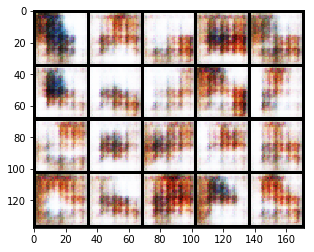

Epoch 30: Train D loss: 0.2288, G loss: 4.4400
Epoch 31: Train D loss: 0.2490, G loss: 5.4984
Epoch 32: Train D loss: 0.2544, G loss: 5.0754
Epoch 33: Train D loss: 0.6655, G loss: 5.7162
Epoch 34: Train D loss: 0.3094, G loss: 5.1188
Epoch 35: Train D loss: 0.2722, G loss: 4.8261
Epoch 36: Train D loss: 0.2320, G loss: 4.8274
Epoch 37: Train D loss: 0.2129, G loss: 4.6379
Epoch 38: Train D loss: 0.4905, G loss: 5.4663
Epoch 39: Train D loss: 0.2884, G loss: 4.6952


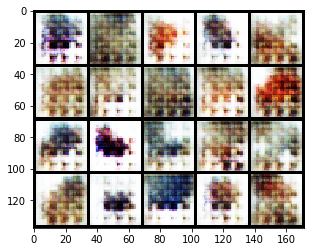

Epoch 40: Train D loss: 0.3282, G loss: 4.9103
Epoch 41: Train D loss: 0.3743, G loss: 4.4945
Epoch 42: Train D loss: 0.3251, G loss: 4.5032
Epoch 43: Train D loss: 0.2587, G loss: 4.1111
Epoch 44: Train D loss: 0.5447, G loss: 5.0612
Epoch 45: Train D loss: 0.2226, G loss: 4.0875
Epoch 46: Train D loss: 0.3086, G loss: 4.4836
Epoch 47: Train D loss: 0.3866, G loss: 4.8824
Epoch 48: Train D loss: 0.2690, G loss: 4.4437
Epoch 49: Train D loss: 0.3290, G loss: 4.5608


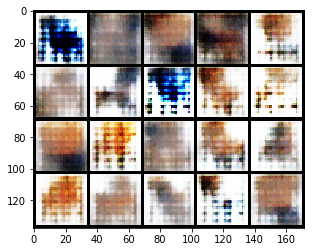

Epoch 50: Train D loss: 0.3405, G loss: 4.8081
Epoch 51: Train D loss: 0.3804, G loss: 5.6172
Epoch 52: Train D loss: 0.3660, G loss: 4.3490
Epoch 53: Train D loss: 0.3711, G loss: 4.5115
Epoch 54: Train D loss: 0.2878, G loss: 3.9804
Epoch 55: Train D loss: 0.2599, G loss: 3.9401
Epoch 56: Train D loss: 0.3877, G loss: 4.2738
Epoch 57: Train D loss: 0.3163, G loss: 3.7994
Epoch 58: Train D loss: 0.4137, G loss: 4.2453
Epoch 59: Train D loss: 0.5262, G loss: 4.5514


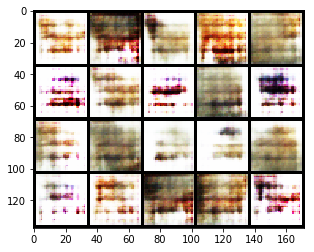

Epoch 60: Train D loss: 0.3415, G loss: 4.2003
Epoch 61: Train D loss: 0.3524, G loss: 4.2689
Epoch 62: Train D loss: 0.4123, G loss: 4.3223
Epoch 63: Train D loss: 0.3448, G loss: 3.7238
Epoch 64: Train D loss: 0.3149, G loss: 3.7435
Epoch 65: Train D loss: 0.3024, G loss: 4.0762
Epoch 66: Train D loss: 0.5775, G loss: 4.4966
Epoch 67: Train D loss: 0.4539, G loss: 4.0503
Epoch 68: Train D loss: 0.4283, G loss: 4.1254
Epoch 69: Train D loss: 0.2938, G loss: 3.9489


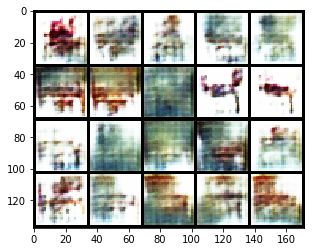

Epoch 70: Train D loss: 0.3458, G loss: 3.4586
Epoch 71: Train D loss: 0.4676, G loss: 3.8071
Epoch 72: Train D loss: 0.3794, G loss: 3.6613
Epoch 73: Train D loss: 0.3409, G loss: 3.6233
Epoch 74: Train D loss: 0.4912, G loss: 4.0056
Epoch 75: Train D loss: 0.4928, G loss: 3.6797
Epoch 76: Train D loss: 0.3943, G loss: 3.4481
Epoch 77: Train D loss: 0.3433, G loss: 3.5179
Epoch 78: Train D loss: 0.3012, G loss: 3.4366
Epoch 79: Train D loss: 0.3810, G loss: 3.7751


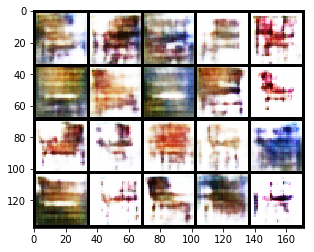

Epoch 80: Train D loss: 0.4597, G loss: 3.4226
Epoch 81: Train D loss: 0.4186, G loss: 3.4710
Epoch 82: Train D loss: 0.4020, G loss: 3.5709
Epoch 83: Train D loss: 0.3438, G loss: 3.6178
Epoch 84: Train D loss: 0.3186, G loss: 3.4781
Epoch 85: Train D loss: 0.5712, G loss: 3.9099
Epoch 86: Train D loss: 0.3976, G loss: 3.3524
Epoch 87: Train D loss: 0.4924, G loss: 3.6902
Epoch 88: Train D loss: 0.4071, G loss: 3.3450
Epoch 89: Train D loss: 0.2686, G loss: 3.1400


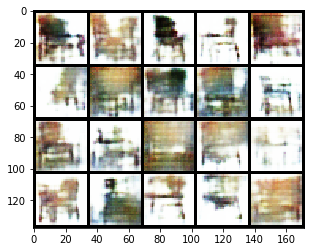

Epoch 90: Train D loss: 0.4034, G loss: 3.6447
Epoch 91: Train D loss: 0.3952, G loss: 3.3702
Epoch 92: Train D loss: 0.3631, G loss: 3.5377
Epoch 93: Train D loss: 0.3241, G loss: 3.2907
Epoch 94: Train D loss: 0.3362, G loss: 3.2682
Epoch 95: Train D loss: 0.4280, G loss: 3.2993
Epoch 96: Train D loss: 0.2841, G loss: 3.0729
Epoch 97: Train D loss: 0.7092, G loss: 3.5881
Epoch 98: Train D loss: 0.5677, G loss: 3.3656
Epoch 99: Train D loss: 0.4165, G loss: 3.0849


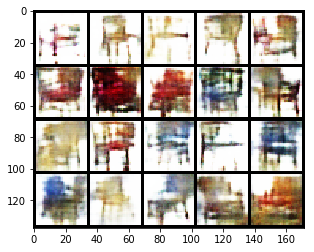

Epoch 100: Train D loss: 0.3263, G loss: 3.1338
Epoch 101: Train D loss: 0.2965, G loss: 3.2099
Epoch 102: Train D loss: 0.3202, G loss: 3.2129
Epoch 103: Train D loss: 0.3805, G loss: 3.2468
Epoch 104: Train D loss: 0.3353, G loss: 3.1517
Epoch 105: Train D loss: 0.3671, G loss: 3.1968
Epoch 106: Train D loss: 0.4061, G loss: 3.1084
Epoch 107: Train D loss: 0.4070, G loss: 3.2740
Epoch 108: Train D loss: 0.5302, G loss: 3.5367
Epoch 109: Train D loss: 0.3832, G loss: 3.2305


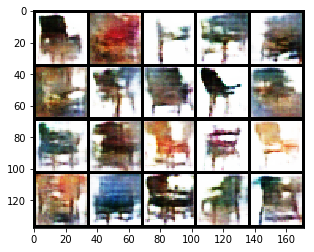

Epoch 110: Train D loss: 0.2997, G loss: 3.0855
Epoch 111: Train D loss: 0.3214, G loss: 3.1340
Epoch 112: Train D loss: 0.4541, G loss: 3.2834
Epoch 113: Train D loss: 0.5383, G loss: 3.3927
Epoch 114: Train D loss: 0.3296, G loss: 3.1117
Epoch 115: Train D loss: 0.3385, G loss: 3.1342
Epoch 116: Train D loss: 0.3462, G loss: 3.1213
Epoch 117: Train D loss: 0.3735, G loss: 3.1756
Epoch 118: Train D loss: 0.2882, G loss: 3.0574
Epoch 119: Train D loss: 0.3457, G loss: 3.1556


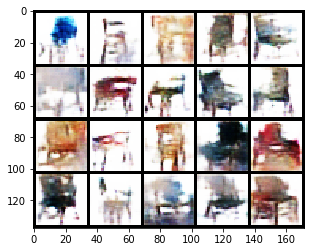

Epoch 120: Train D loss: 0.6117, G loss: 3.3134
Epoch 121: Train D loss: 0.4611, G loss: 3.3140
Epoch 122: Train D loss: 0.3306, G loss: 3.2257
Epoch 123: Train D loss: 0.4285, G loss: 3.2994
Epoch 124: Train D loss: 0.2908, G loss: 3.1093
Epoch 125: Train D loss: 0.3434, G loss: 3.3024
Epoch 126: Train D loss: 0.3190, G loss: 3.2159
Epoch 127: Train D loss: 0.3826, G loss: 3.2713
Epoch 128: Train D loss: 0.2640, G loss: 3.1064
Epoch 129: Train D loss: 0.2568, G loss: 3.3162


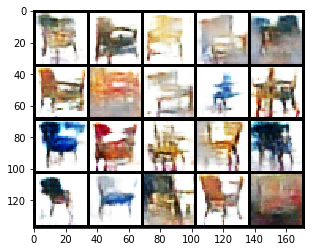

Epoch 130: Train D loss: 0.3819, G loss: 3.2550
Epoch 131: Train D loss: 0.5683, G loss: 3.7185
Epoch 132: Train D loss: 0.6067, G loss: 3.3784
Epoch 133: Train D loss: 0.3681, G loss: 3.3369
Epoch 134: Train D loss: 0.3411, G loss: 3.2706
Epoch 135: Train D loss: 0.2812, G loss: 3.2456
Epoch 136: Train D loss: 0.2489, G loss: 3.1654
Epoch 137: Train D loss: 0.2518, G loss: 3.2694
Epoch 138: Train D loss: 0.4143, G loss: 3.4509
Epoch 139: Train D loss: 0.3648, G loss: 3.3009


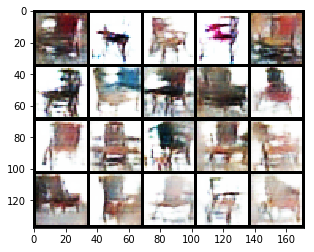

Epoch 140: Train D loss: 0.3726, G loss: 3.5880
Epoch 141: Train D loss: 0.3099, G loss: 3.4075
Epoch 142: Train D loss: 0.2621, G loss: 3.3879
Epoch 143: Train D loss: 0.3375, G loss: 3.4357
Epoch 144: Train D loss: 0.4729, G loss: 3.4850
Epoch 145: Train D loss: 0.3777, G loss: 3.2654
Epoch 146: Train D loss: 0.2837, G loss: 3.3508
Epoch 147: Train D loss: 0.2362, G loss: 3.4142
Epoch 148: Train D loss: 0.2149, G loss: 3.3389
Epoch 149: Train D loss: 0.2003, G loss: 3.3397


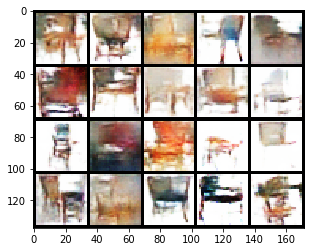

Epoch 150: Train D loss: 0.2434, G loss: 3.4624
Epoch 151: Train D loss: 0.4391, G loss: 3.6967
Epoch 152: Train D loss: 0.3707, G loss: 3.4706
Epoch 153: Train D loss: 0.3355, G loss: 3.4380
Epoch 154: Train D loss: 0.2088, G loss: 3.3586
Epoch 155: Train D loss: 0.2108, G loss: 3.4031
Epoch 156: Train D loss: 0.2119, G loss: 3.4339
Epoch 157: Train D loss: 0.1841, G loss: 3.5236
Epoch 158: Train D loss: 0.1665, G loss: 3.5084
Epoch 159: Train D loss: 0.1614, G loss: 3.4828


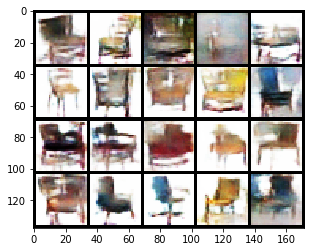

Epoch 160: Train D loss: 0.3008, G loss: 3.5631
Epoch 161: Train D loss: 0.2557, G loss: 3.5728
Epoch 162: Train D loss: 0.3267, G loss: 4.0351
Epoch 163: Train D loss: 0.4221, G loss: 3.6646
Epoch 164: Train D loss: 0.3375, G loss: 3.7828
Epoch 165: Train D loss: 0.2876, G loss: 3.7462
Epoch 166: Train D loss: 0.1731, G loss: 3.5155
Epoch 167: Train D loss: 0.1634, G loss: 3.5647
Epoch 168: Train D loss: 0.1570, G loss: 3.5513
Epoch 169: Train D loss: 0.1668, G loss: 3.7205


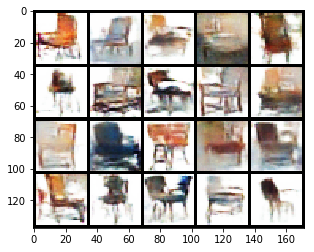

Epoch 170: Train D loss: 0.1442, G loss: 3.6732
Epoch 171: Train D loss: 0.2822, G loss: 3.9744
Epoch 172: Train D loss: 0.5047, G loss: 3.9268
Epoch 173: Train D loss: 0.6429, G loss: 4.0179
Epoch 174: Train D loss: 0.2430, G loss: 3.5524
Epoch 175: Train D loss: 0.1941, G loss: 3.5889
Epoch 176: Train D loss: 0.1508, G loss: 3.4569
Epoch 177: Train D loss: 0.1431, G loss: 3.6381
Epoch 178: Train D loss: 0.1296, G loss: 3.6783
Epoch 179: Train D loss: 0.1405, G loss: 3.7800


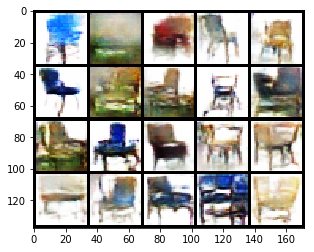

Epoch 180: Train D loss: 0.1551, G loss: 3.7521
Epoch 181: Train D loss: 0.1325, G loss: 3.8447
Epoch 182: Train D loss: 0.1581, G loss: 3.6433
Epoch 183: Train D loss: 0.1453, G loss: 3.7412
Epoch 184: Train D loss: 0.1317, G loss: 3.6739
Epoch 185: Train D loss: 0.1468, G loss: 3.7943
Epoch 186: Train D loss: 0.1316, G loss: 3.7335
Epoch 187: Train D loss: 1.0580, G loss: 4.4262
Epoch 188: Train D loss: 0.7412, G loss: 3.8050
Epoch 189: Train D loss: 0.3529, G loss: 3.7398


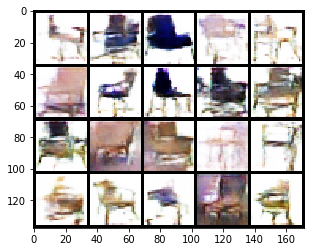

Epoch 190: Train D loss: 0.2212, G loss: 3.9578
Epoch 191: Train D loss: 0.1562, G loss: 3.7317
Epoch 192: Train D loss: 0.1501, G loss: 3.6551
Epoch 193: Train D loss: 0.1437, G loss: 3.8102
Epoch 194: Train D loss: 0.1385, G loss: 3.8330
Epoch 195: Train D loss: 0.1209, G loss: 3.7317
Epoch 196: Train D loss: 0.1168, G loss: 3.7395
Epoch 197: Train D loss: 0.1159, G loss: 3.7598
Epoch 198: Train D loss: 0.1150, G loss: 3.7922
Epoch 199: Train D loss: 0.1010, G loss: 3.8797


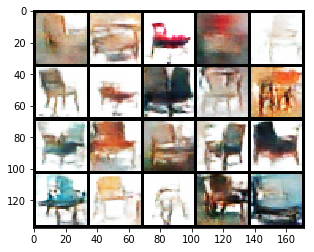

Epoch 200: Train D loss: 0.1171, G loss: 3.9600
Epoch 201: Train D loss: 0.1031, G loss: 4.0028
Epoch 202: Train D loss: 0.1023, G loss: 3.9549
Epoch 203: Train D loss: 0.1109, G loss: 3.8760
Epoch 204: Train D loss: 0.6923, G loss: 4.7311
Epoch 205: Train D loss: 0.6997, G loss: 4.5118
Epoch 206: Train D loss: 0.3088, G loss: 3.8888
Epoch 207: Train D loss: 0.1730, G loss: 3.9668
Epoch 208: Train D loss: 0.1531, G loss: 3.7041
Epoch 209: Train D loss: 0.1354, G loss: 3.8797


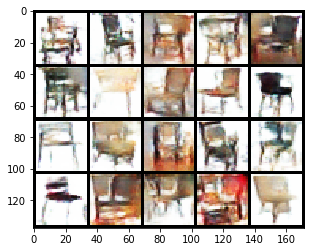

Epoch 210: Train D loss: 0.1026, G loss: 3.8402
Epoch 211: Train D loss: 0.1132, G loss: 3.8955
Epoch 212: Train D loss: 0.1118, G loss: 3.9281
Epoch 213: Train D loss: 0.0905, G loss: 3.9617
Epoch 214: Train D loss: 0.0884, G loss: 4.0201
Epoch 215: Train D loss: 0.0918, G loss: 4.0548
Epoch 216: Train D loss: 0.0822, G loss: 4.0067
Epoch 217: Train D loss: 0.0803, G loss: 4.1293
Epoch 218: Train D loss: 0.1037, G loss: 4.3298
Epoch 219: Train D loss: 0.6717, G loss: 4.7276


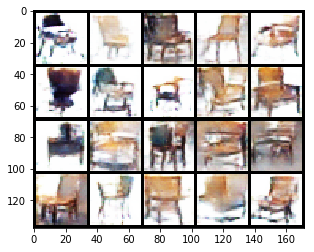

Epoch 220: Train D loss: 0.2535, G loss: 4.0757
Epoch 221: Train D loss: 0.1712, G loss: 3.9874
Epoch 222: Train D loss: 0.1060, G loss: 3.9650
Epoch 223: Train D loss: 0.0958, G loss: 4.0325
Epoch 224: Train D loss: 0.0767, G loss: 4.1005
Epoch 225: Train D loss: 0.0782, G loss: 4.1881
Epoch 226: Train D loss: 0.0782, G loss: 4.1401
Epoch 227: Train D loss: 0.0695, G loss: 4.3970
Epoch 228: Train D loss: 0.0756, G loss: 4.1430
Epoch 229: Train D loss: 0.0740, G loss: 4.2159


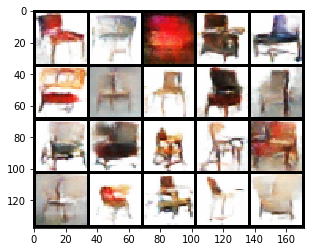

Epoch 230: Train D loss: 0.0709, G loss: 4.2907
Epoch 231: Train D loss: 0.0684, G loss: 4.3069
Epoch 232: Train D loss: 0.0765, G loss: 4.3569
Epoch 233: Train D loss: 0.0713, G loss: 4.2164
Epoch 234: Train D loss: 0.0765, G loss: 4.4458
Epoch 235: Train D loss: 0.0739, G loss: 4.2483
Epoch 236: Train D loss: 0.0677, G loss: 4.4267
Epoch 237: Train D loss: 0.0712, G loss: 4.3168
Epoch 238: Train D loss: 0.0835, G loss: 4.4638
Epoch 239: Train D loss: 0.0748, G loss: 4.4376


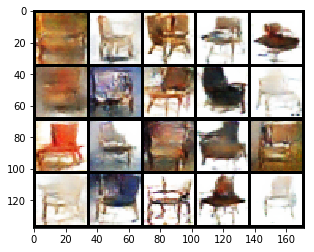

Epoch 240: Train D loss: 0.0659, G loss: 4.4422
Epoch 241: Train D loss: 0.0605, G loss: 4.4482
Epoch 242: Train D loss: 0.0618, G loss: 4.4354
Epoch 243: Train D loss: 0.0610, G loss: 4.5770
Epoch 244: Train D loss: 0.0703, G loss: 4.4463
Epoch 245: Train D loss: 2.6153, G loss: 4.7469
Epoch 246: Train D loss: 1.3523, G loss: 3.1461
Epoch 247: Train D loss: 0.6641, G loss: 4.0291
Epoch 248: Train D loss: 0.4309, G loss: 3.7772
Epoch 249: Train D loss: 0.2213, G loss: 3.6921


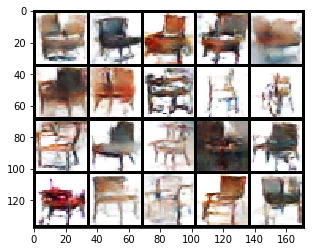

Epoch 250: Train D loss: 0.1654, G loss: 3.7190
Epoch 251: Train D loss: 0.1238, G loss: 3.7230
Epoch 252: Train D loss: 0.1078, G loss: 3.7653
Epoch 253: Train D loss: 0.1007, G loss: 3.9225
Epoch 254: Train D loss: 0.1036, G loss: 3.9271
Epoch 255: Train D loss: 0.1003, G loss: 4.0790
Epoch 256: Train D loss: 0.0960, G loss: 3.9774
Epoch 257: Train D loss: 0.0786, G loss: 4.0544
Epoch 258: Train D loss: 0.0735, G loss: 4.0873
Epoch 259: Train D loss: 0.0761, G loss: 4.0982


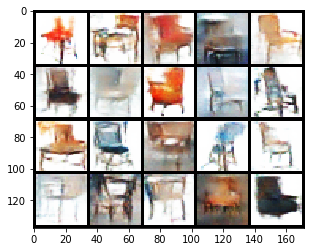

Epoch 260: Train D loss: 0.0656, G loss: 4.2050
Epoch 261: Train D loss: 0.0593, G loss: 4.2461
Epoch 262: Train D loss: 0.0618, G loss: 4.2601
Epoch 263: Train D loss: 0.0564, G loss: 4.2857
Epoch 264: Train D loss: 0.0600, G loss: 4.2445
Epoch 265: Train D loss: 0.0580, G loss: 4.3884
Epoch 266: Train D loss: 0.0588, G loss: 4.4214
Epoch 267: Train D loss: 0.0563, G loss: 4.4049
Epoch 268: Train D loss: 0.0607, G loss: 4.4754
Epoch 269: Train D loss: 0.0676, G loss: 4.3548


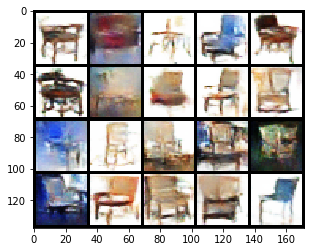

Epoch 270: Train D loss: 0.0548, G loss: 4.4098
Epoch 271: Train D loss: 0.0495, G loss: 4.5400
Epoch 272: Train D loss: 0.0512, G loss: 4.5659
Epoch 273: Train D loss: 0.0523, G loss: 4.5521
Epoch 274: Train D loss: 0.1073, G loss: 4.8774
Epoch 275: Train D loss: 0.0747, G loss: 4.3968
Epoch 276: Train D loss: 0.0547, G loss: 4.4889
Epoch 277: Train D loss: 0.0489, G loss: 4.4875
Epoch 278: Train D loss: 0.0480, G loss: 4.6343
Epoch 279: Train D loss: 0.0462, G loss: 4.5509


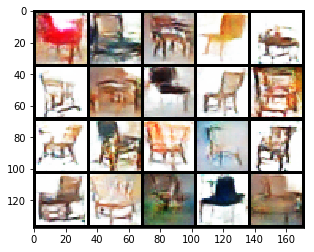

Epoch 280: Train D loss: 0.0565, G loss: 4.7424
Epoch 281: Train D loss: 0.0465, G loss: 4.6689
Epoch 282: Train D loss: 0.0450, G loss: 4.6274
Epoch 283: Train D loss: 0.0411, G loss: 4.7028
Epoch 284: Train D loss: 0.0421, G loss: 4.7099
Epoch 285: Train D loss: 0.0454, G loss: 4.7867
Epoch 286: Train D loss: 0.0449, G loss: 4.8332
Epoch 287: Train D loss: 0.0472, G loss: 4.7491
Epoch 288: Train D loss: 0.0426, G loss: 4.9235
Epoch 289: Train D loss: 1.8823, G loss: 5.4636


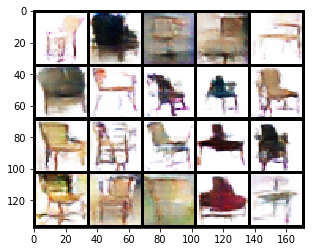

Epoch 290: Train D loss: 1.5562, G loss: 3.6050
Epoch 291: Train D loss: 0.6062, G loss: 3.9501
Epoch 292: Train D loss: 0.3249, G loss: 3.7336
Epoch 293: Train D loss: 0.2107, G loss: 3.8796
Epoch 294: Train D loss: 0.1320, G loss: 3.8335
Epoch 295: Train D loss: 0.1116, G loss: 3.8541
Epoch 296: Train D loss: 0.1072, G loss: 4.1752
Epoch 297: Train D loss: 0.0895, G loss: 4.0826
Epoch 298: Train D loss: 0.0845, G loss: 4.1236
Epoch 299: Train D loss: 0.0715, G loss: 4.2142


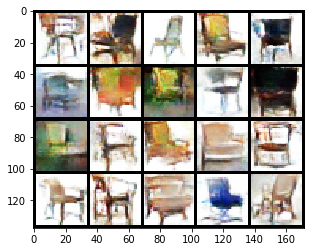

In [17]:
# RGB image channel = 3
image_channel=3

# epochs
n_epochs = 300

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, bceloss, 
                                   n_epochs, device, latent_dim)

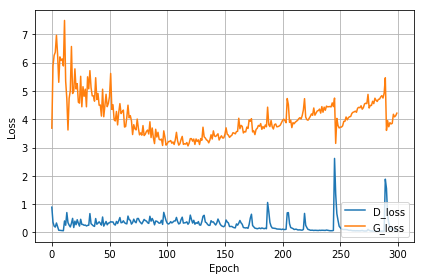

In [18]:
loss_plot(d_loss_hist, g_loss_hist)

## LSGAN

LSGAN(Least Squares GAN)将loss函数改为了 L2损失.G和D的优化目标如下图所示,
![lsgan](pictures/lsgan.png)
#### **作业**: 
在这里,请在下方补充L2Loss的代码来实现L2损失来优化上面的目标.并使用这个loss函数在mnist数据集上训练LSGAN,并显示训练的效果图片及loss变化曲线.

提示:忽略上图的1/2.L2损失即MSEloss(均方误差),传入两个参数input_是指判别器D预测为"真实"的概率值(size为batch_size\*1),target为标签1或0(size为batch_size\*1).只允许使用pytorch和python的运算实现(不能直接调用MSEloss)

In [96]:
class L2Loss(nn.Module):
    def __init__(self):
        super(L2Loss, self).__init__()
    
    def forward(self, input_, target):
        """
        input_: (batch_size*1) 
        target: (batch_size*1) labels, 1 or 0
        """
        """
        To Do
        """
        return torch.mean((input_ - target) ** 2)

完成上方代码后,使用所写的L2Loss在mnist数据集上训练DCGAN.

In [99]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=1

# Adam lr and betas
learning_rate = 0.00003
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 100
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_mnist_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# use L2Loss as loss function
l2loss = L2Loss().to(device)

# G and D model, use DCGAN
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

Epoch 0: Train D loss: 0.1872, G loss: 0.5528


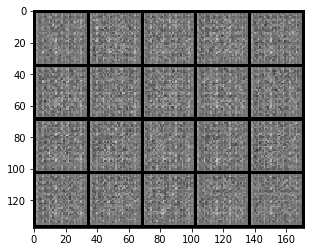

Epoch 1: Train D loss: 0.0315, G loss: 0.8058
Epoch 2: Train D loss: 0.0207, G loss: 0.8524
Epoch 3: Train D loss: 0.0116, G loss: 0.8858
Epoch 4: Train D loss: 0.0057, G loss: 0.9159
Epoch 5: Train D loss: 0.0028, G loss: 0.9390
Epoch 6: Train D loss: 0.0020, G loss: 0.9467
Epoch 7: Train D loss: 0.0022, G loss: 0.9438
Epoch 8: Train D loss: 0.0017, G loss: 0.9498
Epoch 9: Train D loss: 0.0011, G loss: 0.9581


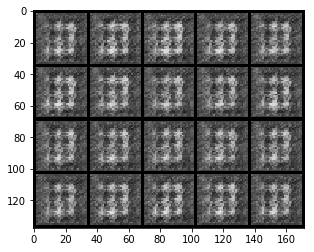

Epoch 10: Train D loss: 0.0008, G loss: 0.9636
Epoch 11: Train D loss: 0.0011, G loss: 0.9599
Epoch 12: Train D loss: 0.0010, G loss: 0.9614
Epoch 13: Train D loss: 0.0011, G loss: 0.9609
Epoch 14: Train D loss: 0.0011, G loss: 0.9618
Epoch 15: Train D loss: 0.0011, G loss: 0.9613
Epoch 16: Train D loss: 0.0010, G loss: 0.9639
Epoch 17: Train D loss: 0.0014, G loss: 0.9628
Epoch 18: Train D loss: 0.0014, G loss: 0.9606
Epoch 19: Train D loss: 0.0011, G loss: 0.9649


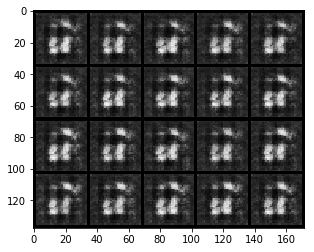

Epoch 20: Train D loss: 0.0009, G loss: 0.9674
Epoch 21: Train D loss: 0.0298, G loss: 0.9532
Epoch 22: Train D loss: 0.0002, G loss: 0.9978
Epoch 23: Train D loss: 0.0029, G loss: 0.9693
Epoch 24: Train D loss: 0.0028, G loss: 0.9588
Epoch 25: Train D loss: 0.0022, G loss: 0.9563
Epoch 26: Train D loss: 0.0035, G loss: 0.9522
Epoch 27: Train D loss: 0.0017, G loss: 0.9621
Epoch 28: Train D loss: 0.0024, G loss: 0.9557
Epoch 29: Train D loss: 0.0034, G loss: 0.9486


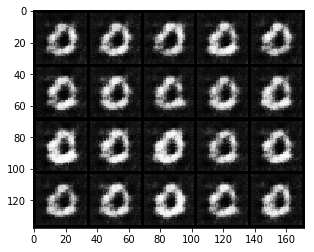

Epoch 30: Train D loss: 0.9892, G loss: 1.0000
Epoch 31: Train D loss: 1.0000, G loss: 1.0000
Epoch 32: Train D loss: 1.0000, G loss: 1.0000
Epoch 33: Train D loss: 1.0000, G loss: 1.0000
Epoch 34: Train D loss: 1.0000, G loss: 1.0000
Epoch 35: Train D loss: 1.0000, G loss: 1.0000
Epoch 36: Train D loss: 1.0000, G loss: 1.0000
Epoch 37: Train D loss: 1.0000, G loss: 1.0000
Epoch 38: Train D loss: 1.0000, G loss: 1.0000
Epoch 39: Train D loss: 1.0000, G loss: 1.0000


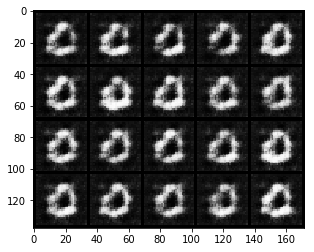

Epoch 40: Train D loss: 1.0000, G loss: 1.0000
Epoch 41: Train D loss: 1.0000, G loss: 1.0000
Epoch 42: Train D loss: 0.9999, G loss: 1.0000
Epoch 43: Train D loss: 0.9999, G loss: 1.0000
Epoch 44: Train D loss: 0.9998, G loss: 1.0000
Epoch 45: Train D loss: 0.6563, G loss: 0.9873
Epoch 46: Train D loss: 0.0105, G loss: 0.9530
Epoch 47: Train D loss: 0.0039, G loss: 0.9577
Epoch 48: Train D loss: 0.0504, G loss: 0.9363
Epoch 49: Train D loss: 0.0166, G loss: 0.9237


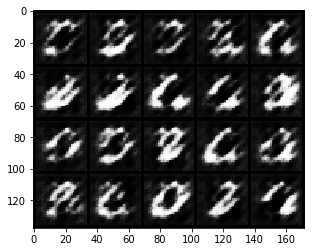

Epoch 50: Train D loss: 0.0112, G loss: 0.9324
Epoch 51: Train D loss: 0.0224, G loss: 0.9136
Epoch 52: Train D loss: 0.0357, G loss: 0.8757
Epoch 53: Train D loss: 0.0507, G loss: 0.8585
Epoch 54: Train D loss: 0.0573, G loss: 0.8505
Epoch 55: Train D loss: 0.0479, G loss: 0.8348
Epoch 56: Train D loss: 0.0607, G loss: 0.8109
Epoch 57: Train D loss: 0.0579, G loss: 0.8133
Epoch 58: Train D loss: 0.0344, G loss: 0.8355
Epoch 59: Train D loss: 0.0311, G loss: 0.8394


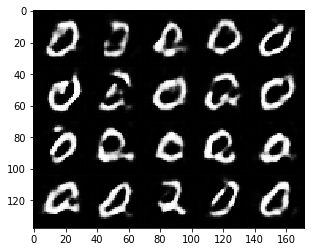

Epoch 60: Train D loss: 0.0322, G loss: 0.8448
Epoch 61: Train D loss: 0.0351, G loss: 0.8504
Epoch 62: Train D loss: 0.0256, G loss: 0.8542
Epoch 63: Train D loss: 0.0309, G loss: 0.8478
Epoch 64: Train D loss: 0.0223, G loss: 0.8651
Epoch 65: Train D loss: 0.0323, G loss: 0.8514
Epoch 66: Train D loss: 0.0396, G loss: 0.8490
Epoch 67: Train D loss: 0.0189, G loss: 0.8666
Epoch 68: Train D loss: 0.0284, G loss: 0.8566
Epoch 69: Train D loss: 0.0406, G loss: 0.8484


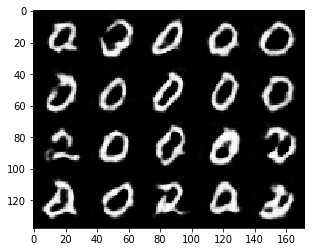

Epoch 70: Train D loss: 0.0281, G loss: 0.8600
Epoch 71: Train D loss: 0.0254, G loss: 0.8565
Epoch 72: Train D loss: 0.0235, G loss: 0.8617
Epoch 73: Train D loss: 0.0488, G loss: 0.8399
Epoch 74: Train D loss: 0.0420, G loss: 0.8483
Epoch 75: Train D loss: 0.0311, G loss: 0.8615
Epoch 76: Train D loss: 0.0228, G loss: 0.8708
Epoch 77: Train D loss: 0.0256, G loss: 0.8610
Epoch 78: Train D loss: 0.0355, G loss: 0.8690
Epoch 79: Train D loss: 0.0163, G loss: 0.8741


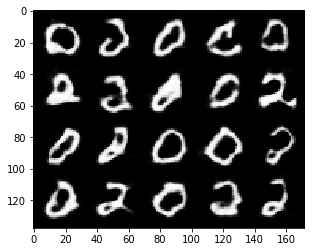

Epoch 80: Train D loss: 0.0305, G loss: 0.8460
Epoch 81: Train D loss: 0.0434, G loss: 0.8482
Epoch 82: Train D loss: 0.0232, G loss: 0.8701
Epoch 83: Train D loss: 0.0182, G loss: 0.8701
Epoch 84: Train D loss: 0.0286, G loss: 0.8607
Epoch 85: Train D loss: 0.0171, G loss: 0.8789
Epoch 86: Train D loss: 0.0251, G loss: 0.8749
Epoch 87: Train D loss: 0.0404, G loss: 0.8487
Epoch 88: Train D loss: 0.0195, G loss: 0.8747
Epoch 89: Train D loss: 0.0556, G loss: 0.8459


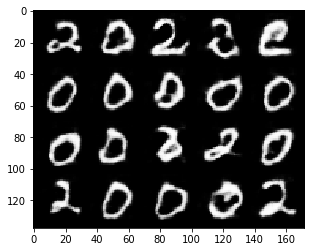

Epoch 90: Train D loss: 0.0308, G loss: 0.8577
Epoch 91: Train D loss: 0.0252, G loss: 0.8707
Epoch 92: Train D loss: 0.0480, G loss: 0.8390
Epoch 93: Train D loss: 0.0227, G loss: 0.8682
Epoch 94: Train D loss: 0.0230, G loss: 0.8650
Epoch 95: Train D loss: 0.0327, G loss: 0.8635
Epoch 96: Train D loss: 0.0351, G loss: 0.8528
Epoch 97: Train D loss: 0.0266, G loss: 0.8616
Epoch 98: Train D loss: 0.0504, G loss: 0.8415
Epoch 99: Train D loss: 0.0488, G loss: 0.8492


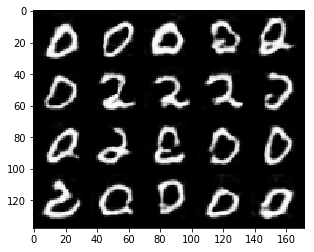

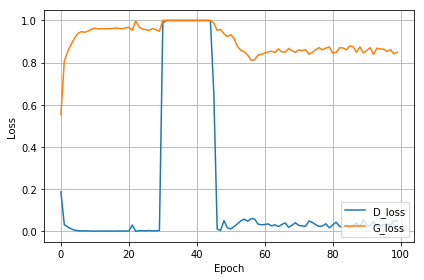

In [100]:
d_loss_hist, g_loss_hist = run_gan(trainloader, G, D, G_optimizer, D_optimizer, l2loss, n_epochs, device, 
                                   latent_dim)
loss_plot(d_loss_hist, g_loss_hist)

## WGAN

GAN依然存在着训练不稳定,模式崩溃(collapse mode,可以理解为生成的图片多样性极低)的问题(我们的数据集不一定能体现出来).WGAN(Wasserstein GAN)将传统GAN中拟合的JS散度改为Wasserstein距离.WGAN一定程度上解决了GAN训练不稳定以及模式奔溃的问题.

WGAN的判别器的优化目标变为,在满足Lipschitz连续的条件(我们可以限制w不超过某个范围来满足)下,最大化
![1](pictures/wgan1.png)
而它会近似于真实分布与生成分布之间的Wasserstein距离.所以我们D和G的loss函数变为:
![1](pictures/wgan3.png) ![1](pictures/wgan2.png)


具体到在实现上,WGAN主要有3点改变:
- 判别器D最后一层去掉sigmoid
- 生成器G和判别器的loss不使用log
- 每次更新判别器D后,将参数的绝对值截断到某一个固定常数c

所以我们主要重写了WGAN的训练函数,在这里,网络结构使用*去除Sigmoid的DCGAN*(注意初始化D时将sigmoid设置为False来去掉最后一层sigmoid).

下面是WGAN的代码实现.加入了两个参数,n_d表示每训练一次G训练D的次数,weight_clip表示截断的常数.


In [68]:
def wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, n_d=2, weight_clip=0.01):
    
    """
    n_d: the number of iterations of D update per G update iteration
    weight_clip: the clipping parameters
    """
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    for i, (x, _) in enumerate(trainloader):
        
        x = x.to(device)
        
        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        D_optimizer.step()
        
        # D weight clip
        for params in D.parameters():
            params.data.clamp_(-weight_clip, weight_clip)
            
        D_total_loss += d_loss.item()

        # update G network
        if (i + 1) % n_d == 0:
            # G optimizer zero grads
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

In [69]:
def run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, latent_dim, n_d, weight_clip):
    d_loss_hist = []
    g_loss_hist = []

    for epoch in range(n_epochs):
        d_loss, g_loss = wgan_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                               z_dim=latent_dim, n_d=n_d, weight_clip=weight_clip)
        print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))

        d_loss_hist.append(d_loss)
        g_loss_hist.append(g_loss)

        if epoch == 0 or (epoch + 1) % 10 == 0:
            visualize_results(G, device, latent_dim) 
    
    return d_loss_hist, g_loss_hist

接下来让我们使用写好的run_wgan来跑我们的家具(椅子)数据集,看看效果如何.

Epoch 0: Train D loss: -0.0077, G loss: 0.0000


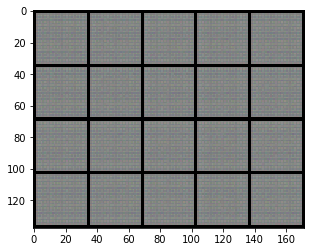

Epoch 1: Train D loss: -0.0516, G loss: 0.0173
Epoch 2: Train D loss: -0.1147, G loss: 0.0796
Epoch 3: Train D loss: -0.2396, G loss: 0.1860
Epoch 4: Train D loss: -0.3891, G loss: 0.2775
Epoch 5: Train D loss: -0.5967, G loss: 0.3664
Epoch 6: Train D loss: -0.6908, G loss: 0.4230
Epoch 7: Train D loss: -0.7306, G loss: 0.4582
Epoch 8: Train D loss: -0.6046, G loss: 0.4490
Epoch 9: Train D loss: -0.6180, G loss: 0.4404


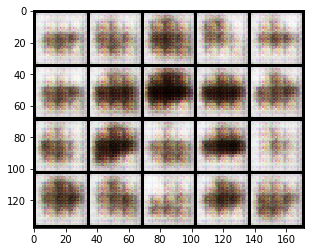

Epoch 10: Train D loss: -0.7540, G loss: 0.4554
Epoch 11: Train D loss: -0.4924, G loss: 0.4010
Epoch 12: Train D loss: -0.6367, G loss: 0.4188
Epoch 13: Train D loss: -0.6551, G loss: 0.4536
Epoch 14: Train D loss: -0.5944, G loss: 0.4505
Epoch 15: Train D loss: -0.6560, G loss: 0.4742
Epoch 16: Train D loss: -0.5732, G loss: 0.4633
Epoch 17: Train D loss: -0.6657, G loss: 0.4739
Epoch 18: Train D loss: -0.6739, G loss: 0.4665
Epoch 19: Train D loss: -0.6202, G loss: 0.4650


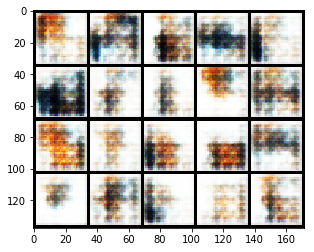

Epoch 20: Train D loss: -0.6426, G loss: 0.4355
Epoch 21: Train D loss: -0.6202, G loss: 0.4421
Epoch 22: Train D loss: -0.5954, G loss: 0.4497
Epoch 23: Train D loss: -0.6173, G loss: 0.4520
Epoch 24: Train D loss: -0.5643, G loss: 0.4187
Epoch 25: Train D loss: -0.5949, G loss: 0.4135
Epoch 26: Train D loss: -0.6757, G loss: 0.4624
Epoch 27: Train D loss: -0.6219, G loss: 0.4137
Epoch 28: Train D loss: -0.6678, G loss: 0.4349
Epoch 29: Train D loss: -0.6033, G loss: 0.4135


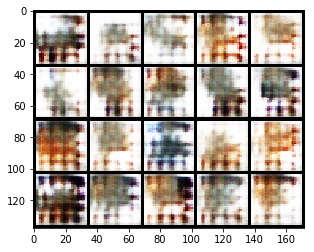

Epoch 30: Train D loss: -0.6223, G loss: 0.4112
Epoch 31: Train D loss: -0.6296, G loss: 0.4237
Epoch 32: Train D loss: -0.6085, G loss: 0.4206
Epoch 33: Train D loss: -0.6375, G loss: 0.4195
Epoch 34: Train D loss: -0.5790, G loss: 0.4006
Epoch 35: Train D loss: -0.6085, G loss: 0.4182
Epoch 36: Train D loss: -0.6048, G loss: 0.3825
Epoch 37: Train D loss: -0.5819, G loss: 0.3851
Epoch 38: Train D loss: -0.6483, G loss: 0.3779
Epoch 39: Train D loss: -0.5743, G loss: 0.3728


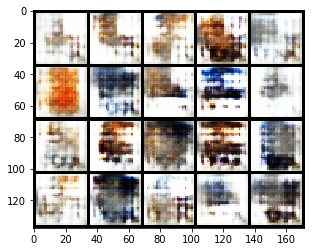

Epoch 40: Train D loss: -0.6307, G loss: 0.3897
Epoch 41: Train D loss: -0.6021, G loss: 0.3758
Epoch 42: Train D loss: -0.5665, G loss: 0.3910
Epoch 43: Train D loss: -0.5590, G loss: 0.3491
Epoch 44: Train D loss: -0.5535, G loss: 0.3597
Epoch 45: Train D loss: -0.4875, G loss: 0.3723
Epoch 46: Train D loss: -0.5475, G loss: 0.3422
Epoch 47: Train D loss: -0.5290, G loss: 0.3277
Epoch 48: Train D loss: -0.5642, G loss: 0.3527
Epoch 49: Train D loss: -0.5364, G loss: 0.3139


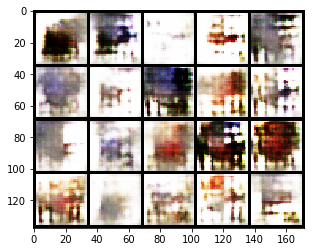

Epoch 50: Train D loss: -0.4983, G loss: 0.3428
Epoch 51: Train D loss: -0.5666, G loss: 0.3522
Epoch 52: Train D loss: -0.5028, G loss: 0.3150
Epoch 53: Train D loss: -0.5334, G loss: 0.3272
Epoch 54: Train D loss: -0.5664, G loss: 0.3878
Epoch 55: Train D loss: -0.5495, G loss: 0.2927
Epoch 56: Train D loss: -0.4630, G loss: 0.3039
Epoch 57: Train D loss: -0.5451, G loss: 0.3447
Epoch 58: Train D loss: -0.5356, G loss: 0.3186
Epoch 59: Train D loss: -0.4890, G loss: 0.3000


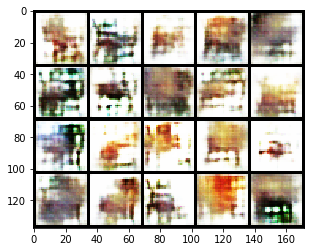

Epoch 60: Train D loss: -0.5298, G loss: 0.3402
Epoch 61: Train D loss: -0.5725, G loss: 0.3721
Epoch 62: Train D loss: -0.4780, G loss: 0.2956
Epoch 63: Train D loss: -0.5427, G loss: 0.3027
Epoch 64: Train D loss: -0.5492, G loss: 0.3335
Epoch 65: Train D loss: -0.5342, G loss: 0.3252
Epoch 66: Train D loss: -0.5304, G loss: 0.3021
Epoch 67: Train D loss: -0.5125, G loss: 0.2915
Epoch 68: Train D loss: -0.5309, G loss: 0.3038
Epoch 69: Train D loss: -0.4988, G loss: 0.2977


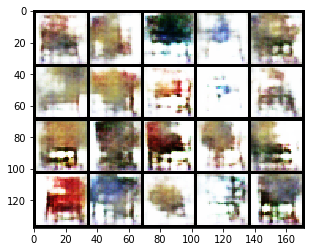

Epoch 70: Train D loss: -0.5339, G loss: 0.3291
Epoch 71: Train D loss: -0.4989, G loss: 0.2936
Epoch 72: Train D loss: -0.5586, G loss: 0.3497
Epoch 73: Train D loss: -0.5048, G loss: 0.3119
Epoch 74: Train D loss: -0.5295, G loss: 0.3108
Epoch 75: Train D loss: -0.4924, G loss: 0.3024
Epoch 76: Train D loss: -0.5083, G loss: 0.2895
Epoch 77: Train D loss: -0.5291, G loss: 0.3052
Epoch 78: Train D loss: -0.4797, G loss: 0.2768
Epoch 79: Train D loss: -0.5267, G loss: 0.3085


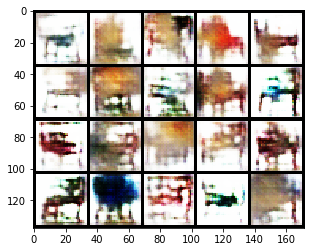

Epoch 80: Train D loss: -0.4931, G loss: 0.3174
Epoch 81: Train D loss: -0.5062, G loss: 0.2787
Epoch 82: Train D loss: -0.4833, G loss: 0.2788
Epoch 83: Train D loss: -0.4944, G loss: 0.3070
Epoch 84: Train D loss: -0.5050, G loss: 0.2862
Epoch 85: Train D loss: -0.4561, G loss: 0.3058
Epoch 86: Train D loss: -0.4824, G loss: 0.2704
Epoch 87: Train D loss: -0.4860, G loss: 0.2888
Epoch 88: Train D loss: -0.4804, G loss: 0.2777
Epoch 89: Train D loss: -0.4855, G loss: 0.3279


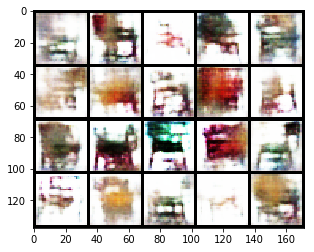

Epoch 90: Train D loss: -0.4929, G loss: 0.2848
Epoch 91: Train D loss: -0.4584, G loss: 0.2637
Epoch 92: Train D loss: -0.5042, G loss: 0.2910
Epoch 93: Train D loss: -0.4775, G loss: 0.3288
Epoch 94: Train D loss: -0.4698, G loss: 0.2385
Epoch 95: Train D loss: -0.4727, G loss: 0.2858
Epoch 96: Train D loss: -0.4623, G loss: 0.2529
Epoch 97: Train D loss: -0.4834, G loss: 0.3118
Epoch 98: Train D loss: -0.4159, G loss: 0.2756
Epoch 99: Train D loss: -0.4951, G loss: 0.2966


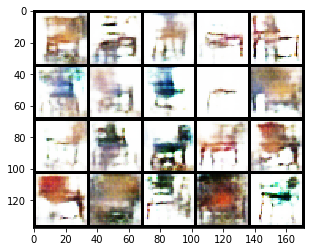

Epoch 100: Train D loss: -0.4673, G loss: 0.2442
Epoch 101: Train D loss: -0.4732, G loss: 0.2981
Epoch 102: Train D loss: -0.4670, G loss: 0.2543
Epoch 103: Train D loss: -0.4611, G loss: 0.2914
Epoch 104: Train D loss: -0.4487, G loss: 0.2774
Epoch 105: Train D loss: -0.4849, G loss: 0.2864
Epoch 106: Train D loss: -0.4892, G loss: 0.2971
Epoch 107: Train D loss: -0.4546, G loss: 0.3145
Epoch 108: Train D loss: -0.5011, G loss: 0.2848
Epoch 109: Train D loss: -0.4701, G loss: 0.3021


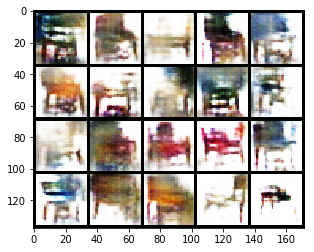

Epoch 110: Train D loss: -0.4868, G loss: 0.2793
Epoch 111: Train D loss: -0.4438, G loss: 0.2764
Epoch 112: Train D loss: -0.5196, G loss: 0.3809
Epoch 113: Train D loss: -0.4665, G loss: 0.3421
Epoch 114: Train D loss: -0.4785, G loss: 0.3343
Epoch 115: Train D loss: -0.4596, G loss: 0.2974
Epoch 116: Train D loss: -0.4167, G loss: 0.2824
Epoch 117: Train D loss: -0.4647, G loss: 0.2818
Epoch 118: Train D loss: -0.4303, G loss: 0.2827
Epoch 119: Train D loss: -0.4281, G loss: 0.3020


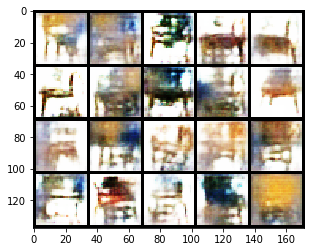

Epoch 120: Train D loss: -0.4590, G loss: 0.2815
Epoch 121: Train D loss: -0.4323, G loss: 0.2704
Epoch 122: Train D loss: -0.4566, G loss: 0.2844
Epoch 123: Train D loss: -0.4031, G loss: 0.2553
Epoch 124: Train D loss: -0.5079, G loss: 0.3596
Epoch 125: Train D loss: -0.4303, G loss: 0.3142
Epoch 126: Train D loss: -0.4453, G loss: 0.2826
Epoch 127: Train D loss: -0.4682, G loss: 0.3670
Epoch 128: Train D loss: -0.4204, G loss: 0.2534
Epoch 129: Train D loss: -0.4688, G loss: 0.3209


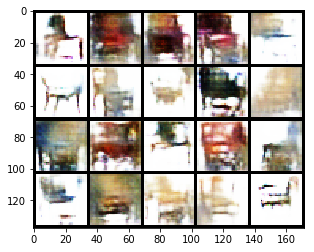

Epoch 130: Train D loss: -0.4614, G loss: 0.3673
Epoch 131: Train D loss: -0.4119, G loss: 0.2341
Epoch 132: Train D loss: -0.4586, G loss: 0.2898
Epoch 133: Train D loss: -0.4188, G loss: 0.2520
Epoch 134: Train D loss: -0.4363, G loss: 0.2345
Epoch 135: Train D loss: -0.4441, G loss: 0.3234
Epoch 136: Train D loss: -0.4532, G loss: 0.3037
Epoch 137: Train D loss: -0.4400, G loss: 0.3170
Epoch 138: Train D loss: -0.4188, G loss: 0.2485
Epoch 139: Train D loss: -0.4583, G loss: 0.2779


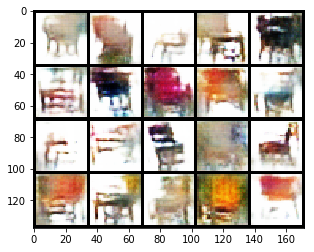

Epoch 140: Train D loss: -0.4333, G loss: 0.2560
Epoch 141: Train D loss: -0.4312, G loss: 0.2611
Epoch 142: Train D loss: -0.4611, G loss: 0.3364
Epoch 143: Train D loss: -0.3985, G loss: 0.2432
Epoch 144: Train D loss: -0.4377, G loss: 0.2600
Epoch 145: Train D loss: -0.3978, G loss: 0.3145
Epoch 146: Train D loss: -0.4462, G loss: 0.2545
Epoch 147: Train D loss: -0.4257, G loss: 0.2805
Epoch 148: Train D loss: -0.4133, G loss: 0.2326
Epoch 149: Train D loss: -0.4488, G loss: 0.2561


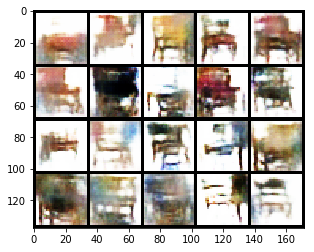

Epoch 150: Train D loss: -0.4068, G loss: 0.2793
Epoch 151: Train D loss: -0.4320, G loss: 0.2538
Epoch 152: Train D loss: -0.3959, G loss: 0.2482
Epoch 153: Train D loss: -0.4212, G loss: 0.2883
Epoch 154: Train D loss: -0.4310, G loss: 0.2888
Epoch 155: Train D loss: -0.4100, G loss: 0.2364
Epoch 156: Train D loss: -0.4160, G loss: 0.2570
Epoch 157: Train D loss: -0.4233, G loss: 0.2692
Epoch 158: Train D loss: -0.4077, G loss: 0.2946
Epoch 159: Train D loss: -0.4185, G loss: 0.2754


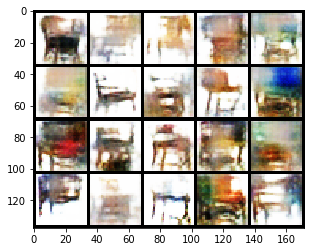

Epoch 160: Train D loss: -0.4448, G loss: 0.3046
Epoch 161: Train D loss: -0.3910, G loss: 0.2485
Epoch 162: Train D loss: -0.4064, G loss: 0.2978
Epoch 163: Train D loss: -0.4091, G loss: 0.2595
Epoch 164: Train D loss: -0.4239, G loss: 0.2935
Epoch 165: Train D loss: -0.4413, G loss: 0.2828
Epoch 166: Train D loss: -0.4302, G loss: 0.3081
Epoch 167: Train D loss: -0.3903, G loss: 0.2951
Epoch 168: Train D loss: -0.4192, G loss: 0.2761
Epoch 169: Train D loss: -0.4317, G loss: 0.2700


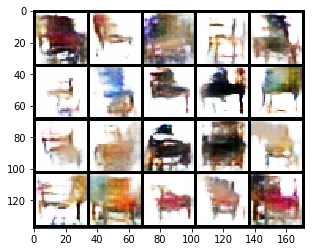

Epoch 170: Train D loss: -0.4304, G loss: 0.2810
Epoch 171: Train D loss: -0.4205, G loss: 0.3123
Epoch 172: Train D loss: -0.4021, G loss: 0.3038
Epoch 173: Train D loss: -0.4194, G loss: 0.2975
Epoch 174: Train D loss: -0.3994, G loss: 0.2832
Epoch 175: Train D loss: -0.3968, G loss: 0.2902
Epoch 176: Train D loss: -0.4091, G loss: 0.2530
Epoch 177: Train D loss: -0.4113, G loss: 0.2373
Epoch 178: Train D loss: -0.3904, G loss: 0.3048
Epoch 179: Train D loss: -0.4048, G loss: 0.2506


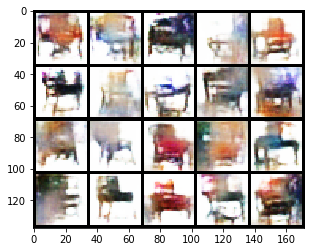

Epoch 180: Train D loss: -0.4119, G loss: 0.2596
Epoch 181: Train D loss: -0.4027, G loss: 0.2772
Epoch 182: Train D loss: -0.3975, G loss: 0.2143
Epoch 183: Train D loss: -0.4225, G loss: 0.2285
Epoch 184: Train D loss: -0.3921, G loss: 0.2673
Epoch 185: Train D loss: -0.4324, G loss: 0.3214
Epoch 186: Train D loss: -0.3883, G loss: 0.2910
Epoch 187: Train D loss: -0.3760, G loss: 0.2520
Epoch 188: Train D loss: -0.4213, G loss: 0.2619
Epoch 189: Train D loss: -0.3892, G loss: 0.2693


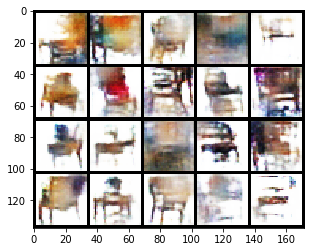

Epoch 190: Train D loss: -0.4179, G loss: 0.3052
Epoch 191: Train D loss: -0.3635, G loss: 0.2225
Epoch 192: Train D loss: -0.3834, G loss: 0.2603
Epoch 193: Train D loss: -0.3881, G loss: 0.2422
Epoch 194: Train D loss: -0.3974, G loss: 0.2362
Epoch 195: Train D loss: -0.4171, G loss: 0.2754
Epoch 196: Train D loss: -0.3697, G loss: 0.2783
Epoch 197: Train D loss: -0.3968, G loss: 0.2723
Epoch 198: Train D loss: -0.3822, G loss: 0.2494
Epoch 199: Train D loss: -0.3829, G loss: 0.2601


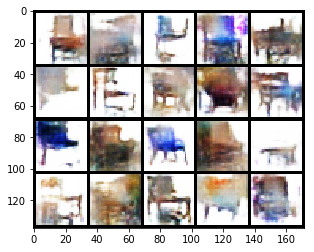

Epoch 200: Train D loss: -0.3987, G loss: 0.2992
Epoch 201: Train D loss: -0.4089, G loss: 0.2992
Epoch 202: Train D loss: -0.3666, G loss: 0.3001
Epoch 203: Train D loss: -0.3688, G loss: 0.1868
Epoch 204: Train D loss: -0.3982, G loss: 0.2553
Epoch 205: Train D loss: -0.3681, G loss: 0.2438
Epoch 206: Train D loss: -0.3886, G loss: 0.2596
Epoch 207: Train D loss: -0.3770, G loss: 0.2594
Epoch 208: Train D loss: -0.3975, G loss: 0.2306
Epoch 209: Train D loss: -0.3584, G loss: 0.2153


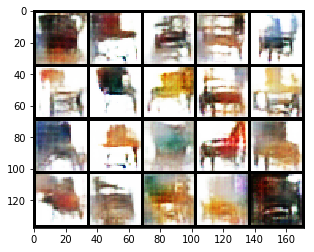

Epoch 210: Train D loss: -0.3729, G loss: 0.2342
Epoch 211: Train D loss: -0.4012, G loss: 0.2677
Epoch 212: Train D loss: -0.3820, G loss: 0.2605
Epoch 213: Train D loss: -0.3810, G loss: 0.2693
Epoch 214: Train D loss: -0.3643, G loss: 0.2183
Epoch 215: Train D loss: -0.3970, G loss: 0.2919
Epoch 216: Train D loss: -0.3443, G loss: 0.1874
Epoch 217: Train D loss: -0.3869, G loss: 0.2494
Epoch 218: Train D loss: -0.3563, G loss: 0.2299
Epoch 219: Train D loss: -0.3898, G loss: 0.2833


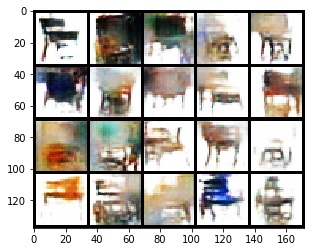

Epoch 220: Train D loss: -0.3594, G loss: 0.2027
Epoch 221: Train D loss: -0.3788, G loss: 0.2796
Epoch 222: Train D loss: -0.3654, G loss: 0.2016
Epoch 223: Train D loss: -0.3563, G loss: 0.2642
Epoch 224: Train D loss: -0.3658, G loss: 0.1900
Epoch 225: Train D loss: -0.3846, G loss: 0.2832
Epoch 226: Train D loss: -0.3681, G loss: 0.2392
Epoch 227: Train D loss: -0.3642, G loss: 0.2633
Epoch 228: Train D loss: -0.3732, G loss: 0.2568
Epoch 229: Train D loss: -0.3828, G loss: 0.2493


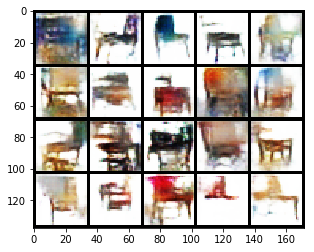

Epoch 230: Train D loss: -0.3786, G loss: 0.2647
Epoch 231: Train D loss: -0.3528, G loss: 0.2124
Epoch 232: Train D loss: -0.3895, G loss: 0.3031
Epoch 233: Train D loss: -0.3345, G loss: 0.2237
Epoch 234: Train D loss: -0.3722, G loss: 0.2027
Epoch 235: Train D loss: -0.3780, G loss: 0.2697
Epoch 236: Train D loss: -0.3645, G loss: 0.2138
Epoch 237: Train D loss: -0.3707, G loss: 0.2967
Epoch 238: Train D loss: -0.3397, G loss: 0.2410
Epoch 239: Train D loss: -0.3581, G loss: 0.2411


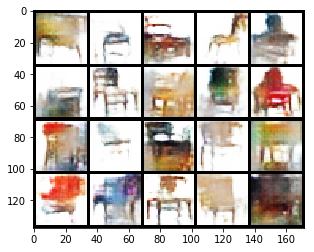

Epoch 240: Train D loss: -0.3652, G loss: 0.2343
Epoch 241: Train D loss: -0.3672, G loss: 0.3123
Epoch 242: Train D loss: -0.3528, G loss: 0.2446
Epoch 243: Train D loss: -0.3801, G loss: 0.3139
Epoch 244: Train D loss: -0.3541, G loss: 0.2463
Epoch 245: Train D loss: -0.3513, G loss: 0.2316
Epoch 246: Train D loss: -0.3529, G loss: 0.2441
Epoch 247: Train D loss: -0.3570, G loss: 0.2582
Epoch 248: Train D loss: -0.3616, G loss: 0.1970
Epoch 249: Train D loss: -0.3608, G loss: 0.2764


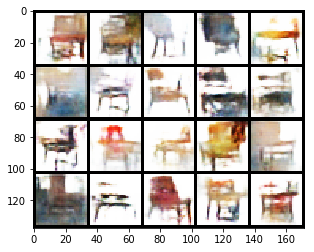

Epoch 250: Train D loss: -0.3397, G loss: 0.2635
Epoch 251: Train D loss: -0.3622, G loss: 0.2378
Epoch 252: Train D loss: -0.3485, G loss: 0.2081
Epoch 253: Train D loss: -0.3608, G loss: 0.2191
Epoch 254: Train D loss: -0.3472, G loss: 0.2714
Epoch 255: Train D loss: -0.3389, G loss: 0.2260
Epoch 256: Train D loss: -0.3296, G loss: 0.2807
Epoch 257: Train D loss: -0.4022, G loss: 0.3004
Epoch 258: Train D loss: -0.3408, G loss: 0.2426
Epoch 259: Train D loss: -0.3534, G loss: 0.2265


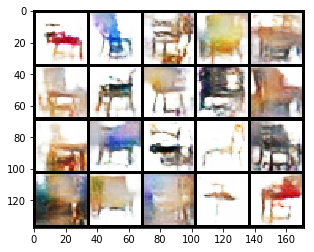

Epoch 260: Train D loss: -0.3591, G loss: 0.2527
Epoch 261: Train D loss: -0.3461, G loss: 0.2228
Epoch 262: Train D loss: -0.3457, G loss: 0.2054
Epoch 263: Train D loss: -0.3481, G loss: 0.2489
Epoch 264: Train D loss: -0.3431, G loss: 0.2470
Epoch 265: Train D loss: -0.3673, G loss: 0.2266
Epoch 266: Train D loss: -0.3511, G loss: 0.3265
Epoch 267: Train D loss: -0.3536, G loss: 0.2108
Epoch 268: Train D loss: -0.3682, G loss: 0.2443
Epoch 269: Train D loss: -0.3467, G loss: 0.1718


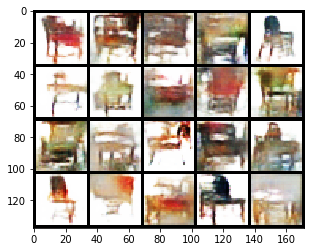

Epoch 270: Train D loss: -0.3291, G loss: 0.2915
Epoch 271: Train D loss: -0.3404, G loss: 0.2394
Epoch 272: Train D loss: -0.3481, G loss: 0.2525
Epoch 273: Train D loss: -0.3358, G loss: 0.2138
Epoch 274: Train D loss: -0.3419, G loss: 0.2150
Epoch 275: Train D loss: -0.3263, G loss: 0.2260
Epoch 276: Train D loss: -0.3504, G loss: 0.2096
Epoch 277: Train D loss: -0.3443, G loss: 0.2114
Epoch 278: Train D loss: -0.3462, G loss: 0.2581
Epoch 279: Train D loss: -0.3691, G loss: 0.2588


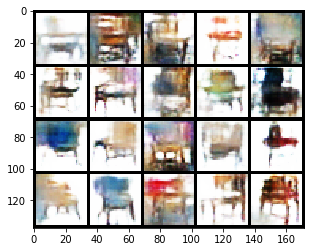

Epoch 280: Train D loss: -0.3485, G loss: 0.2365
Epoch 281: Train D loss: -0.3478, G loss: 0.2006
Epoch 282: Train D loss: -0.3378, G loss: 0.2414
Epoch 283: Train D loss: -0.3376, G loss: 0.1897
Epoch 284: Train D loss: -0.3424, G loss: 0.2030
Epoch 285: Train D loss: -0.3274, G loss: 0.2118
Epoch 286: Train D loss: -0.3321, G loss: 0.2374
Epoch 287: Train D loss: -0.3479, G loss: 0.2606
Epoch 288: Train D loss: -0.3326, G loss: 0.2124
Epoch 289: Train D loss: -0.3312, G loss: 0.2432


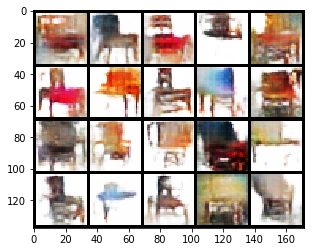

Epoch 290: Train D loss: -0.3306, G loss: 0.2475
Epoch 291: Train D loss: -0.3402, G loss: 0.2194
Epoch 292: Train D loss: -0.3298, G loss: 0.2145
Epoch 293: Train D loss: -0.3051, G loss: 0.1702
Epoch 294: Train D loss: -0.3333, G loss: 0.2192
Epoch 295: Train D loss: -0.3573, G loss: 0.2516
Epoch 296: Train D loss: -0.3268, G loss: 0.2201
Epoch 297: Train D loss: -0.3379, G loss: 0.1814
Epoch 298: Train D loss: -0.3337, G loss: 0.2022
Epoch 299: Train D loss: -0.3259, G loss: 0.2382


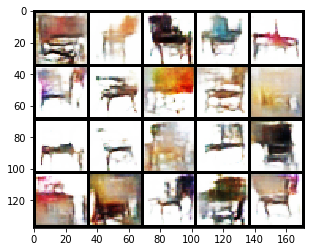

In [70]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# n_d: the number of iterations of D update per G update iteration
n_d = 2
weight_clip=0.01

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

由**WGAN**的原理我们知道,D_loss的*相反数*可以表示生成数据分布与真实分布的Wasserstein距离,其数值越小,表明两个分布越相似,GAN训练得越好.它的值给我们训练GAN提供了一个指标.

运行下方代码观察wgan的loss曲线,可以看到,总体上,D_loss的*相反数*随着epoch数增加逐渐下降,同时生成的数据也越来越逼近真实数据,这与wgan的原理是相符合的.

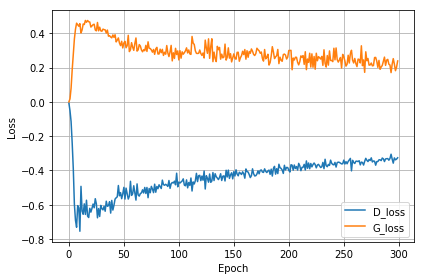

In [71]:
loss_plot(d_loss_hist, g_loss_hist)

接下来运行下面两个cell的代码,集中展示wgan的参数分布.

In [72]:
from utils import show_weights_hist
def show_d_params(D):
    plist = []
    for params in D.parameters():
        plist.extend(params.cpu().data.view(-1).numpy())
    show_weights_hist(plist)

/home/inplus/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


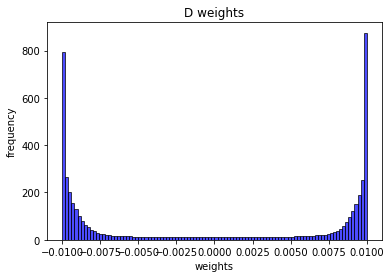

In [73]:
show_d_params(D)

可以看到,参数都被截断在\[-c, c\]之间,大部分参数集中在-c和c附近.

#### **作业**: 
尝试使用n_d设置为5, 3, 1等,再次训练wGAN,n_d为多少时的结果最好?

在n_d为5的时候表现得最好，因为当n_d为5时，每更新5次D识别器，更新一次G生成器，所以G的更新迭代建立在一个较好的D识别器会更加准确，更懂得怎么欺骗D识别器，同时整个模型的迭代速度会下降。（以为不用每一次都要训练G）

In [88]:
# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# n_d: the number of iterations of D update per G update iteration
n_d = 2
weight_clip=0.01

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')
# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

Epoch 0: Train D loss: 0.0158, G loss: -0.0088


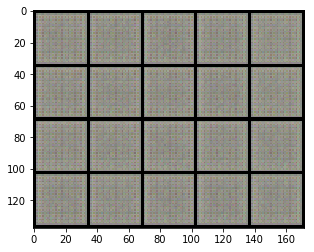

Epoch 1: Train D loss: -0.0213, G loss: -0.0046
Epoch 2: Train D loss: -0.0473, G loss: 0.0251
Epoch 3: Train D loss: -0.0881, G loss: 0.0800
Epoch 4: Train D loss: -0.1666, G loss: 0.1409
Epoch 5: Train D loss: -0.1820, G loss: 0.1626
Epoch 6: Train D loss: -0.0810, G loss: 0.1418
Epoch 7: Train D loss: -0.0680, G loss: 0.1020
Epoch 8: Train D loss: -0.1345, G loss: 0.1371
Epoch 9: Train D loss: -0.1864, G loss: 0.1957


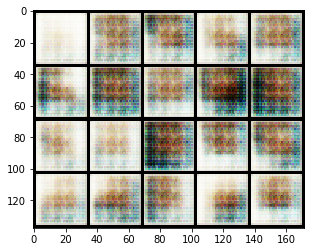

Epoch 10: Train D loss: -0.1773, G loss: 0.2098
Epoch 11: Train D loss: -0.2138, G loss: 0.2181
Epoch 12: Train D loss: -0.2396, G loss: 0.2488
Epoch 13: Train D loss: -0.2108, G loss: 0.2462
Epoch 14: Train D loss: -0.2278, G loss: 0.1843
Epoch 15: Train D loss: -0.2643, G loss: 0.2643
Epoch 16: Train D loss: -0.3287, G loss: 0.3056
Epoch 17: Train D loss: -0.3012, G loss: 0.2966
Epoch 18: Train D loss: -0.3888, G loss: 0.3288
Epoch 19: Train D loss: -0.2792, G loss: 0.3117


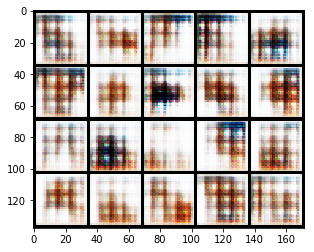

Epoch 20: Train D loss: -0.2062, G loss: 0.2295
Epoch 21: Train D loss: -0.3855, G loss: 0.2848
Epoch 22: Train D loss: -0.3410, G loss: 0.3028
Epoch 23: Train D loss: -0.3317, G loss: 0.3231
Epoch 24: Train D loss: -0.3158, G loss: 0.3395
Epoch 25: Train D loss: -0.3148, G loss: 0.2897
Epoch 26: Train D loss: -0.3707, G loss: 0.3163
Epoch 27: Train D loss: -0.3527, G loss: 0.3250
Epoch 28: Train D loss: -0.3745, G loss: 0.3357
Epoch 29: Train D loss: -0.3229, G loss: 0.3072


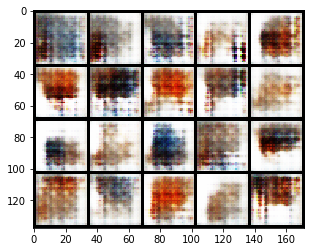

Epoch 30: Train D loss: -0.3014, G loss: 0.2824
Epoch 31: Train D loss: -0.2897, G loss: 0.2779
Epoch 32: Train D loss: -0.3437, G loss: 0.3074
Epoch 33: Train D loss: -0.3233, G loss: 0.3269
Epoch 34: Train D loss: -0.3767, G loss: 0.3126
Epoch 35: Train D loss: -0.3773, G loss: 0.2917
Epoch 36: Train D loss: -0.3506, G loss: 0.2825
Epoch 37: Train D loss: -0.3942, G loss: 0.3293
Epoch 38: Train D loss: -0.3088, G loss: 0.2685
Epoch 39: Train D loss: -0.3293, G loss: 0.2915


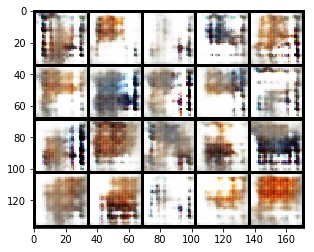

Epoch 40: Train D loss: -0.3004, G loss: 0.2801
Epoch 41: Train D loss: -0.3487, G loss: 0.2987
Epoch 42: Train D loss: -0.3576, G loss: 0.2849
Epoch 43: Train D loss: -0.3183, G loss: 0.2760
Epoch 44: Train D loss: -0.3092, G loss: 0.2517
Epoch 45: Train D loss: -0.3309, G loss: 0.2900
Epoch 46: Train D loss: -0.3177, G loss: 0.2729
Epoch 47: Train D loss: -0.3651, G loss: 0.2772
Epoch 48: Train D loss: -0.3213, G loss: 0.2950
Epoch 49: Train D loss: -0.3123, G loss: 0.2582


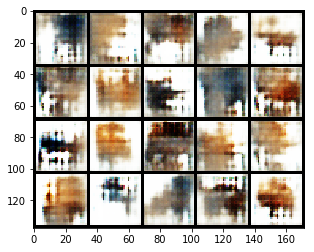

Epoch 50: Train D loss: -0.3040, G loss: 0.2594
Epoch 51: Train D loss: -0.3785, G loss: 0.2829
Epoch 52: Train D loss: -0.3153, G loss: 0.2491
Epoch 53: Train D loss: -0.3741, G loss: 0.2895
Epoch 54: Train D loss: -0.3122, G loss: 0.2731
Epoch 55: Train D loss: -0.3511, G loss: 0.2496
Epoch 56: Train D loss: -0.3837, G loss: 0.2815
Epoch 57: Train D loss: -0.3411, G loss: 0.2763
Epoch 58: Train D loss: -0.3347, G loss: 0.2625
Epoch 59: Train D loss: -0.3255, G loss: 0.2629


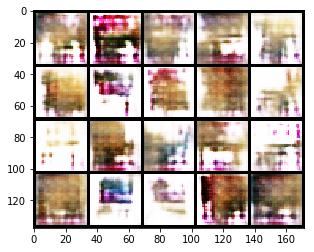

Epoch 60: Train D loss: -0.3170, G loss: 0.2389
Epoch 61: Train D loss: -0.3389, G loss: 0.2732
Epoch 62: Train D loss: -0.3538, G loss: 0.2712
Epoch 63: Train D loss: -0.3676, G loss: 0.3010
Epoch 64: Train D loss: -0.3274, G loss: 0.2645
Epoch 65: Train D loss: -0.3808, G loss: 0.2892
Epoch 66: Train D loss: -0.3067, G loss: 0.2570
Epoch 67: Train D loss: -0.3498, G loss: 0.2716
Epoch 68: Train D loss: -0.3196, G loss: 0.2662
Epoch 69: Train D loss: -0.3734, G loss: 0.2825


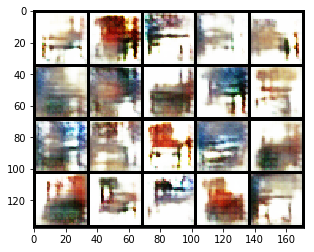

Epoch 70: Train D loss: -0.3433, G loss: 0.2696
Epoch 71: Train D loss: -0.3302, G loss: 0.2458
Epoch 72: Train D loss: -0.3446, G loss: 0.2648
Epoch 73: Train D loss: -0.3005, G loss: 0.2639
Epoch 74: Train D loss: -0.3197, G loss: 0.2583
Epoch 75: Train D loss: -0.2698, G loss: 0.2354
Epoch 76: Train D loss: -0.3164, G loss: 0.2662
Epoch 77: Train D loss: -0.3082, G loss: 0.2392
Epoch 78: Train D loss: -0.2804, G loss: 0.2585
Epoch 79: Train D loss: -0.2790, G loss: 0.2254


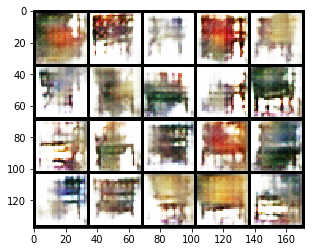

Epoch 80: Train D loss: -0.2708, G loss: 0.2371
Epoch 81: Train D loss: -0.3146, G loss: 0.2552
Epoch 82: Train D loss: -0.2436, G loss: 0.2222
Epoch 83: Train D loss: -0.2934, G loss: 0.2580
Epoch 84: Train D loss: -0.2606, G loss: 0.2236
Epoch 85: Train D loss: -0.2761, G loss: 0.2532
Epoch 86: Train D loss: -0.2985, G loss: 0.2529
Epoch 87: Train D loss: -0.2672, G loss: 0.2412
Epoch 88: Train D loss: -0.2792, G loss: 0.2445
Epoch 89: Train D loss: -0.2978, G loss: 0.2266


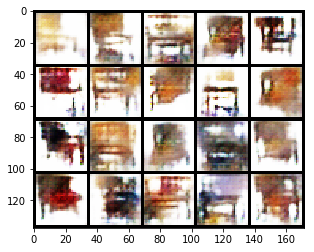

Epoch 90: Train D loss: -0.2891, G loss: 0.2358
Epoch 91: Train D loss: -0.2582, G loss: 0.2265
Epoch 92: Train D loss: -0.2582, G loss: 0.2241
Epoch 93: Train D loss: -0.2943, G loss: 0.2320
Epoch 94: Train D loss: -0.2527, G loss: 0.2280
Epoch 95: Train D loss: -0.2888, G loss: 0.2385
Epoch 96: Train D loss: -0.2985, G loss: 0.2307
Epoch 97: Train D loss: -0.2422, G loss: 0.2238
Epoch 98: Train D loss: -0.3003, G loss: 0.2398
Epoch 99: Train D loss: -0.2369, G loss: 0.1988


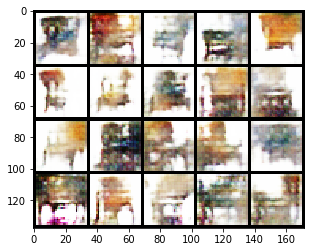

Epoch 100: Train D loss: -0.2908, G loss: 0.2370
Epoch 101: Train D loss: -0.2619, G loss: 0.2064
Epoch 102: Train D loss: -0.2903, G loss: 0.2354
Epoch 103: Train D loss: -0.2940, G loss: 0.2449
Epoch 104: Train D loss: -0.2698, G loss: 0.2121
Epoch 105: Train D loss: -0.2948, G loss: 0.2398
Epoch 106: Train D loss: -0.3012, G loss: 0.2311
Epoch 107: Train D loss: -0.2683, G loss: 0.2562
Epoch 108: Train D loss: -0.3042, G loss: 0.2648
Epoch 109: Train D loss: -0.2360, G loss: 0.1888


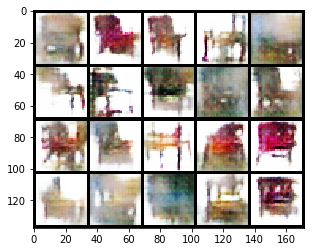

Epoch 110: Train D loss: -0.2663, G loss: 0.2127
Epoch 111: Train D loss: -0.3015, G loss: 0.2494
Epoch 112: Train D loss: -0.2529, G loss: 0.2130
Epoch 113: Train D loss: -0.2685, G loss: 0.2161
Epoch 114: Train D loss: -0.2828, G loss: 0.2442
Epoch 115: Train D loss: -0.2600, G loss: 0.2093
Epoch 116: Train D loss: -0.2701, G loss: 0.2239
Epoch 117: Train D loss: -0.2576, G loss: 0.2207
Epoch 118: Train D loss: -0.2352, G loss: 0.2291
Epoch 119: Train D loss: -0.3015, G loss: 0.2653


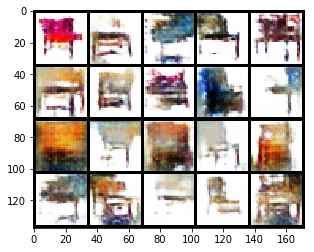

Epoch 120: Train D loss: -0.2575, G loss: 0.1760
Epoch 121: Train D loss: -0.2691, G loss: 0.2302
Epoch 122: Train D loss: -0.2464, G loss: 0.2193
Epoch 123: Train D loss: -0.2933, G loss: 0.2279
Epoch 124: Train D loss: -0.2628, G loss: 0.2210
Epoch 125: Train D loss: -0.2687, G loss: 0.2242
Epoch 126: Train D loss: -0.2652, G loss: 0.2296
Epoch 127: Train D loss: -0.2770, G loss: 0.2337
Epoch 128: Train D loss: -0.2539, G loss: 0.2039
Epoch 129: Train D loss: -0.2874, G loss: 0.1817


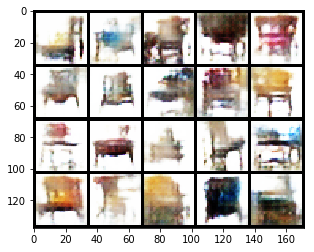

Epoch 130: Train D loss: -0.2525, G loss: 0.2237
Epoch 131: Train D loss: -0.2548, G loss: 0.1975
Epoch 132: Train D loss: -0.2967, G loss: 0.2409
Epoch 133: Train D loss: -0.2711, G loss: 0.1866
Epoch 134: Train D loss: -0.2497, G loss: 0.2061
Epoch 135: Train D loss: -0.2931, G loss: 0.2341
Epoch 136: Train D loss: -0.2722, G loss: 0.2236
Epoch 137: Train D loss: -0.2280, G loss: 0.2205
Epoch 138: Train D loss: -0.2620, G loss: 0.2041
Epoch 139: Train D loss: -0.2923, G loss: 0.2159


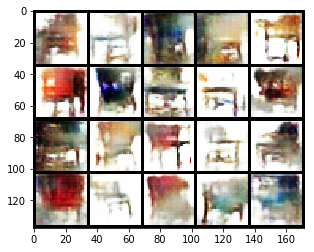

Epoch 140: Train D loss: -0.2156, G loss: 0.1816
Epoch 141: Train D loss: -0.3053, G loss: 0.2394
Epoch 142: Train D loss: -0.2367, G loss: 0.2180
Epoch 143: Train D loss: -0.2696, G loss: 0.2138
Epoch 144: Train D loss: -0.2834, G loss: 0.1921
Epoch 145: Train D loss: -0.2696, G loss: 0.2212
Epoch 146: Train D loss: -0.2531, G loss: 0.1903
Epoch 147: Train D loss: -0.2673, G loss: 0.2126
Epoch 148: Train D loss: -0.2602, G loss: 0.2085
Epoch 149: Train D loss: -0.2682, G loss: 0.2205


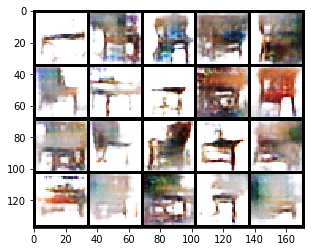

Epoch 150: Train D loss: -0.2530, G loss: 0.2166
Epoch 151: Train D loss: -0.2744, G loss: 0.2202
Epoch 152: Train D loss: -0.2584, G loss: 0.2110
Epoch 153: Train D loss: -0.2499, G loss: 0.1666
Epoch 154: Train D loss: -0.2615, G loss: 0.2219
Epoch 155: Train D loss: -0.2377, G loss: 0.2185
Epoch 156: Train D loss: -0.2491, G loss: 0.2166
Epoch 157: Train D loss: -0.2410, G loss: 0.1795
Epoch 158: Train D loss: -0.2688, G loss: 0.2147
Epoch 159: Train D loss: -0.2529, G loss: 0.1985


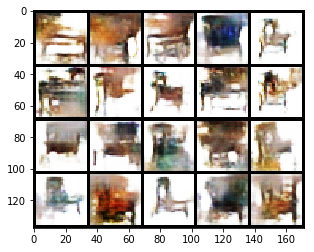

Epoch 160: Train D loss: -0.2286, G loss: 0.1873
Epoch 161: Train D loss: -0.2365, G loss: 0.1983
Epoch 162: Train D loss: -0.2611, G loss: 0.2110
Epoch 163: Train D loss: -0.2552, G loss: 0.2008
Epoch 164: Train D loss: -0.2384, G loss: 0.2156
Epoch 165: Train D loss: -0.2411, G loss: 0.1905
Epoch 166: Train D loss: -0.2787, G loss: 0.2141
Epoch 167: Train D loss: -0.2599, G loss: 0.2338
Epoch 168: Train D loss: -0.2259, G loss: 0.1935
Epoch 169: Train D loss: -0.2566, G loss: 0.2012


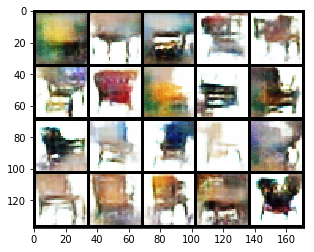

Epoch 170: Train D loss: -0.2460, G loss: 0.2045
Epoch 171: Train D loss: -0.2606, G loss: 0.2157
Epoch 172: Train D loss: -0.2496, G loss: 0.2069
Epoch 173: Train D loss: -0.2246, G loss: 0.1838
Epoch 174: Train D loss: -0.2448, G loss: 0.1998
Epoch 175: Train D loss: -0.2289, G loss: 0.2031
Epoch 176: Train D loss: -0.2435, G loss: 0.2003
Epoch 177: Train D loss: -0.2744, G loss: 0.2061
Epoch 178: Train D loss: -0.2301, G loss: 0.1726
Epoch 179: Train D loss: -0.2415, G loss: 0.1835


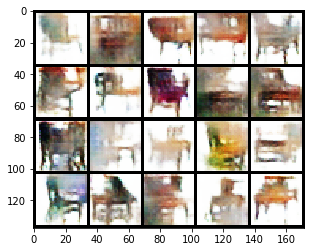

Epoch 180: Train D loss: -0.2321, G loss: 0.1946
Epoch 181: Train D loss: -0.2359, G loss: 0.1909
Epoch 182: Train D loss: -0.2333, G loss: 0.1909
Epoch 183: Train D loss: -0.2354, G loss: 0.1805
Epoch 184: Train D loss: -0.2534, G loss: 0.2131
Epoch 185: Train D loss: -0.2413, G loss: 0.1545
Epoch 186: Train D loss: -0.2543, G loss: 0.2045
Epoch 187: Train D loss: -0.2249, G loss: 0.2120
Epoch 188: Train D loss: -0.2350, G loss: 0.2026
Epoch 189: Train D loss: -0.2322, G loss: 0.1914


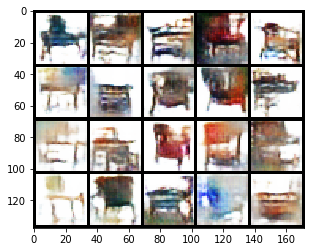

Epoch 190: Train D loss: -0.2082, G loss: 0.1865
Epoch 191: Train D loss: -0.2430, G loss: 0.1995
Epoch 192: Train D loss: -0.2271, G loss: 0.1976
Epoch 193: Train D loss: -0.2186, G loss: 0.1824
Epoch 194: Train D loss: -0.2336, G loss: 0.2059
Epoch 195: Train D loss: -0.2435, G loss: 0.2132
Epoch 196: Train D loss: -0.2201, G loss: 0.1755
Epoch 197: Train D loss: -0.2514, G loss: 0.1949
Epoch 198: Train D loss: -0.2349, G loss: 0.1819
Epoch 199: Train D loss: -0.2242, G loss: 0.1692


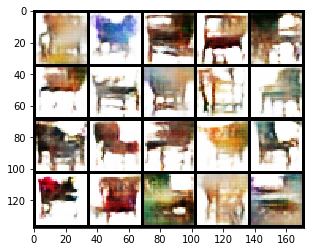

Epoch 200: Train D loss: -0.2078, G loss: 0.1832
Epoch 201: Train D loss: -0.2172, G loss: 0.1713
Epoch 202: Train D loss: -0.2332, G loss: 0.1800
Epoch 203: Train D loss: -0.2198, G loss: 0.1892
Epoch 204: Train D loss: -0.2329, G loss: 0.1910
Epoch 205: Train D loss: -0.2389, G loss: 0.1739
Epoch 206: Train D loss: -0.2261, G loss: 0.2056
Epoch 207: Train D loss: -0.2062, G loss: 0.1850
Epoch 208: Train D loss: -0.2242, G loss: 0.1947
Epoch 209: Train D loss: -0.2173, G loss: 0.1810


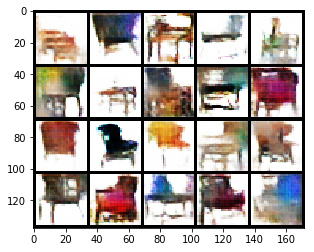

Epoch 210: Train D loss: -0.2111, G loss: 0.1984
Epoch 211: Train D loss: -0.2062, G loss: 0.1728
Epoch 212: Train D loss: -0.2360, G loss: 0.1904
Epoch 213: Train D loss: -0.2162, G loss: 0.1640
Epoch 214: Train D loss: -0.2112, G loss: 0.1930
Epoch 215: Train D loss: -0.2219, G loss: 0.1762
Epoch 216: Train D loss: -0.2248, G loss: 0.1849
Epoch 217: Train D loss: -0.2369, G loss: 0.1950
Epoch 218: Train D loss: -0.2318, G loss: 0.2046
Epoch 219: Train D loss: -0.2250, G loss: 0.1741


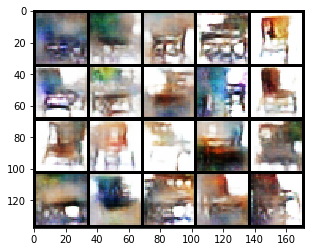

Epoch 220: Train D loss: -0.1960, G loss: 0.1648
Epoch 221: Train D loss: -0.2256, G loss: 0.1945
Epoch 222: Train D loss: -0.2361, G loss: 0.1855
Epoch 223: Train D loss: -0.2300, G loss: 0.1920
Epoch 224: Train D loss: -0.2122, G loss: 0.1851
Epoch 225: Train D loss: -0.2367, G loss: 0.2012
Epoch 226: Train D loss: -0.2215, G loss: 0.1890
Epoch 227: Train D loss: -0.2212, G loss: 0.1735
Epoch 228: Train D loss: -0.2278, G loss: 0.1992
Epoch 229: Train D loss: -0.2124, G loss: 0.1784


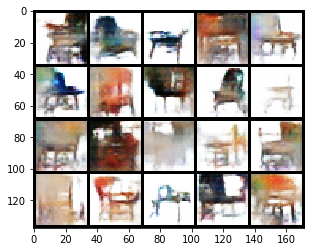

Epoch 230: Train D loss: -0.2237, G loss: 0.1866
Epoch 231: Train D loss: -0.2182, G loss: 0.1892
Epoch 232: Train D loss: -0.2049, G loss: 0.1757
Epoch 233: Train D loss: -0.2228, G loss: 0.1885
Epoch 234: Train D loss: -0.2229, G loss: 0.1759
Epoch 235: Train D loss: -0.2135, G loss: 0.1708
Epoch 236: Train D loss: -0.2289, G loss: 0.1848
Epoch 237: Train D loss: -0.2304, G loss: 0.2142
Epoch 238: Train D loss: -0.2175, G loss: 0.1915
Epoch 239: Train D loss: -0.2160, G loss: 0.1604


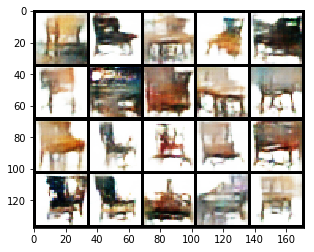

Epoch 240: Train D loss: -0.2096, G loss: 0.1818
Epoch 241: Train D loss: -0.2124, G loss: 0.1843
Epoch 242: Train D loss: -0.2227, G loss: 0.1809
Epoch 243: Train D loss: -0.2081, G loss: 0.1750
Epoch 244: Train D loss: -0.1946, G loss: 0.1732
Epoch 245: Train D loss: -0.2186, G loss: 0.2083
Epoch 246: Train D loss: -0.1975, G loss: 0.1708
Epoch 247: Train D loss: -0.2000, G loss: 0.1805
Epoch 248: Train D loss: -0.1878, G loss: 0.1765
Epoch 249: Train D loss: -0.2292, G loss: 0.1868


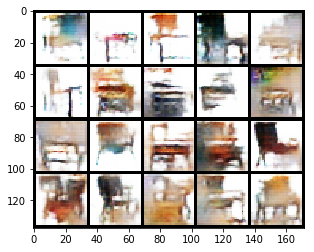

Epoch 250: Train D loss: -0.2034, G loss: 0.1967
Epoch 251: Train D loss: -0.1988, G loss: 0.1756
Epoch 252: Train D loss: -0.2046, G loss: 0.1772
Epoch 253: Train D loss: -0.2015, G loss: 0.1969
Epoch 254: Train D loss: -0.2136, G loss: 0.1748
Epoch 255: Train D loss: -0.2009, G loss: 0.1951
Epoch 256: Train D loss: -0.2255, G loss: 0.1859
Epoch 257: Train D loss: -0.2071, G loss: 0.1738
Epoch 258: Train D loss: -0.2054, G loss: 0.1656
Epoch 259: Train D loss: -0.2155, G loss: 0.1689


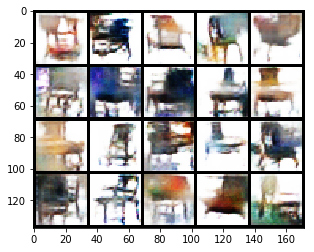

Epoch 260: Train D loss: -0.1851, G loss: 0.1612
Epoch 261: Train D loss: -0.1989, G loss: 0.1837
Epoch 262: Train D loss: -0.2284, G loss: 0.1749
Epoch 263: Train D loss: -0.2070, G loss: 0.1798
Epoch 264: Train D loss: -0.2078, G loss: 0.1919
Epoch 265: Train D loss: -0.2015, G loss: 0.1970
Epoch 266: Train D loss: -0.1825, G loss: 0.1563
Epoch 267: Train D loss: -0.2029, G loss: 0.1721
Epoch 268: Train D loss: -0.1894, G loss: 0.1530
Epoch 269: Train D loss: -0.1992, G loss: 0.1745


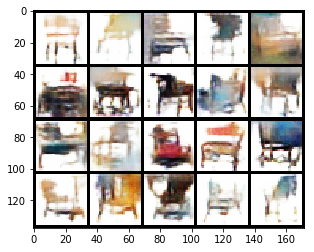

Epoch 270: Train D loss: -0.2037, G loss: 0.1717
Epoch 271: Train D loss: -0.1976, G loss: 0.1626
Epoch 272: Train D loss: -0.2048, G loss: 0.1653
Epoch 273: Train D loss: -0.2100, G loss: 0.1961
Epoch 274: Train D loss: -0.2042, G loss: 0.1663
Epoch 275: Train D loss: -0.2120, G loss: 0.1856
Epoch 276: Train D loss: -0.1984, G loss: 0.1593
Epoch 277: Train D loss: -0.1953, G loss: 0.1869
Epoch 278: Train D loss: -0.1716, G loss: 0.1591
Epoch 279: Train D loss: -0.2112, G loss: 0.1699


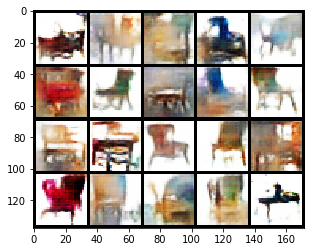

Epoch 280: Train D loss: -0.2087, G loss: 0.1814
Epoch 281: Train D loss: -0.1934, G loss: 0.1909
Epoch 282: Train D loss: -0.2064, G loss: 0.1652
Epoch 283: Train D loss: -0.2068, G loss: 0.1848
Epoch 284: Train D loss: -0.2138, G loss: 0.1703
Epoch 285: Train D loss: -0.1970, G loss: 0.1810
Epoch 286: Train D loss: -0.1889, G loss: 0.1778
Epoch 287: Train D loss: -0.1764, G loss: 0.1659
Epoch 288: Train D loss: -0.2141, G loss: 0.1699
Epoch 289: Train D loss: -0.2100, G loss: 0.1893


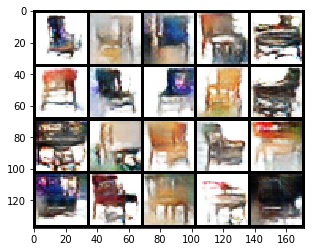

Epoch 290: Train D loss: -0.1965, G loss: 0.1726
Epoch 291: Train D loss: -0.1934, G loss: 0.1915
Epoch 292: Train D loss: -0.1888, G loss: 0.1724
Epoch 293: Train D loss: -0.1657, G loss: 0.1601
Epoch 294: Train D loss: -0.2047, G loss: 0.1807
Epoch 295: Train D loss: -0.2014, G loss: 0.1722
Epoch 296: Train D loss: -0.1934, G loss: 0.1929
Epoch 297: Train D loss: -0.1844, G loss: 0.1481
Epoch 298: Train D loss: -0.2058, G loss: 0.1801
Epoch 299: Train D loss: -0.1912, G loss: 0.1720


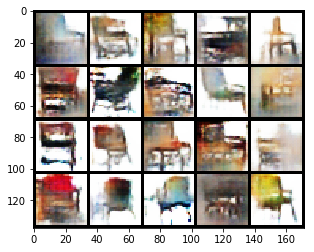

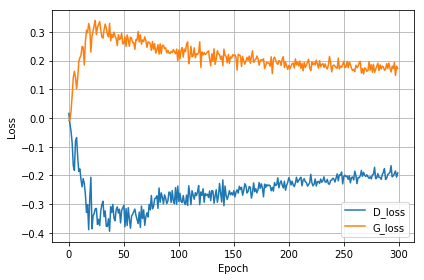

In [89]:
n_d = 1

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: 0.0032, G loss: -0.0000


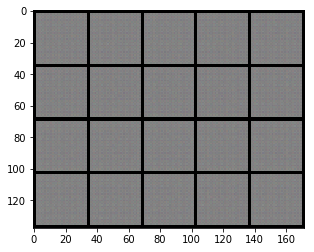

Epoch 1: Train D loss: -0.0762, G loss: 0.0190
Epoch 2: Train D loss: -0.1958, G loss: 0.1081
Epoch 3: Train D loss: -0.3545, G loss: 0.2083
Epoch 4: Train D loss: -0.5070, G loss: 0.2917
Epoch 5: Train D loss: -0.6100, G loss: 0.3444
Epoch 6: Train D loss: -0.7317, G loss: 0.3963
Epoch 7: Train D loss: -0.8837, G loss: 0.4547
Epoch 8: Train D loss: -0.9972, G loss: 0.5002
Epoch 9: Train D loss: -1.0521, G loss: 0.5270


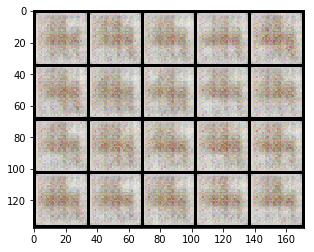

Epoch 10: Train D loss: -1.0865, G loss: 0.5487
Epoch 11: Train D loss: -0.9875, G loss: 0.5350
Epoch 12: Train D loss: -0.7861, G loss: 0.4469
Epoch 13: Train D loss: -0.7908, G loss: 0.4197
Epoch 14: Train D loss: -0.9039, G loss: 0.5071
Epoch 15: Train D loss: -1.0806, G loss: 0.5670
Epoch 16: Train D loss: -1.0180, G loss: 0.5497
Epoch 17: Train D loss: -1.0018, G loss: 0.5343
Epoch 18: Train D loss: -0.7895, G loss: 0.4273
Epoch 19: Train D loss: -0.7984, G loss: 0.3768


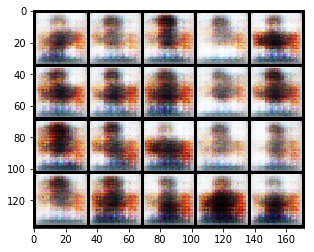

Epoch 20: Train D loss: -0.8966, G loss: 0.4648
Epoch 21: Train D loss: -0.8840, G loss: 0.4464
Epoch 22: Train D loss: -0.9379, G loss: 0.4847
Epoch 23: Train D loss: -0.8729, G loss: 0.4513
Epoch 24: Train D loss: -0.8745, G loss: 0.4842
Epoch 25: Train D loss: -0.9090, G loss: 0.4777
Epoch 26: Train D loss: -0.9460, G loss: 0.4840
Epoch 27: Train D loss: -0.8278, G loss: 0.4307
Epoch 28: Train D loss: -0.8501, G loss: 0.4626
Epoch 29: Train D loss: -0.8341, G loss: 0.4486


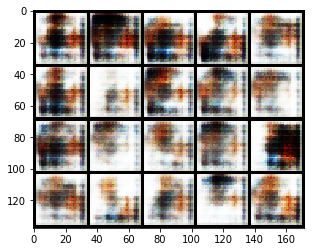

Epoch 30: Train D loss: -0.7656, G loss: 0.4136
Epoch 31: Train D loss: -0.8820, G loss: 0.4842
Epoch 32: Train D loss: -0.8805, G loss: 0.5005
Epoch 33: Train D loss: -0.8693, G loss: 0.5185
Epoch 34: Train D loss: -0.8611, G loss: 0.5048
Epoch 35: Train D loss: -0.8994, G loss: 0.4884
Epoch 36: Train D loss: -0.8513, G loss: 0.4578
Epoch 37: Train D loss: -0.6890, G loss: 0.3998
Epoch 38: Train D loss: -0.8529, G loss: 0.4841
Epoch 39: Train D loss: -0.7765, G loss: 0.4392


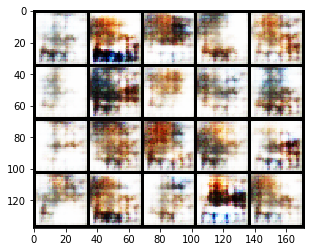

Epoch 40: Train D loss: -0.7957, G loss: 0.4411
Epoch 41: Train D loss: -0.8191, G loss: 0.5035
Epoch 42: Train D loss: -0.7507, G loss: 0.4077
Epoch 43: Train D loss: -0.8708, G loss: 0.4942
Epoch 44: Train D loss: -0.7710, G loss: 0.4154
Epoch 45: Train D loss: -0.7162, G loss: 0.3725
Epoch 46: Train D loss: -0.7861, G loss: 0.4299
Epoch 47: Train D loss: -0.8173, G loss: 0.4616
Epoch 48: Train D loss: -0.7440, G loss: 0.4404
Epoch 49: Train D loss: -0.8124, G loss: 0.4589


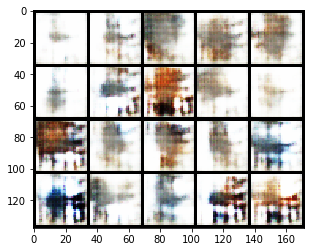

Epoch 50: Train D loss: -0.7687, G loss: 0.4348
Epoch 51: Train D loss: -0.7594, G loss: 0.4432
Epoch 52: Train D loss: -0.6980, G loss: 0.3963
Epoch 53: Train D loss: -0.8060, G loss: 0.4770
Epoch 54: Train D loss: -0.7259, G loss: 0.4113
Epoch 55: Train D loss: -0.7441, G loss: 0.4441
Epoch 56: Train D loss: -0.8095, G loss: 0.4542
Epoch 57: Train D loss: -0.7526, G loss: 0.4345
Epoch 58: Train D loss: -0.7049, G loss: 0.3800
Epoch 59: Train D loss: -0.6348, G loss: 0.2814


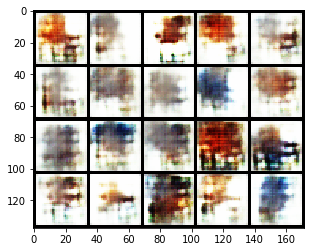

Epoch 60: Train D loss: -0.7540, G loss: 0.4228
Epoch 61: Train D loss: -0.7871, G loss: 0.4643
Epoch 62: Train D loss: -0.7569, G loss: 0.4393
Epoch 63: Train D loss: -0.7183, G loss: 0.3928
Epoch 64: Train D loss: -0.7171, G loss: 0.4254
Epoch 65: Train D loss: -0.7214, G loss: 0.4184
Epoch 66: Train D loss: -0.7449, G loss: 0.4399
Epoch 67: Train D loss: -0.7303, G loss: 0.4421
Epoch 68: Train D loss: -0.6625, G loss: 0.3917
Epoch 69: Train D loss: -0.7836, G loss: 0.4590


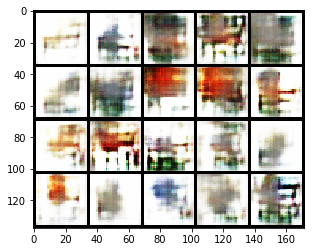

Epoch 70: Train D loss: -0.6937, G loss: 0.4043
Epoch 71: Train D loss: -0.7345, G loss: 0.4310
Epoch 72: Train D loss: -0.6932, G loss: 0.3892
Epoch 73: Train D loss: -0.7019, G loss: 0.4247
Epoch 74: Train D loss: -0.6659, G loss: 0.3739
Epoch 75: Train D loss: -0.6725, G loss: 0.3966
Epoch 76: Train D loss: -0.7219, G loss: 0.4232
Epoch 77: Train D loss: -0.6588, G loss: 0.3590
Epoch 78: Train D loss: -0.6944, G loss: 0.3434
Epoch 79: Train D loss: -0.6529, G loss: 0.3987


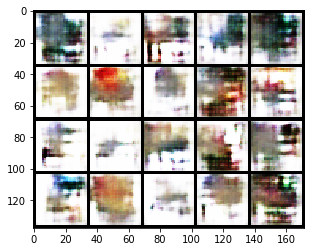

Epoch 80: Train D loss: -0.7108, G loss: 0.4213
Epoch 81: Train D loss: -0.6524, G loss: 0.3992
Epoch 82: Train D loss: -0.6695, G loss: 0.4107
Epoch 83: Train D loss: -0.6702, G loss: 0.4086
Epoch 84: Train D loss: -0.6414, G loss: 0.3369
Epoch 85: Train D loss: -0.6873, G loss: 0.4123
Epoch 86: Train D loss: -0.6760, G loss: 0.4159
Epoch 87: Train D loss: -0.6843, G loss: 0.4374
Epoch 88: Train D loss: -0.6490, G loss: 0.3883
Epoch 89: Train D loss: -0.6914, G loss: 0.3757


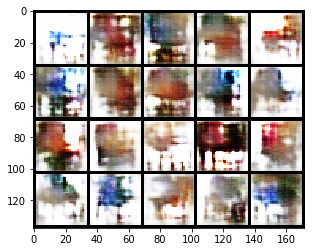

Epoch 90: Train D loss: -0.6642, G loss: 0.3795
Epoch 91: Train D loss: -0.6357, G loss: 0.3850
Epoch 92: Train D loss: -0.6507, G loss: 0.3814
Epoch 93: Train D loss: -0.6890, G loss: 0.4016
Epoch 94: Train D loss: -0.6498, G loss: 0.3629
Epoch 95: Train D loss: -0.6360, G loss: 0.3897
Epoch 96: Train D loss: -0.6896, G loss: 0.3893
Epoch 97: Train D loss: -0.6191, G loss: 0.3919
Epoch 98: Train D loss: -0.6475, G loss: 0.3834
Epoch 99: Train D loss: -0.6311, G loss: 0.3742


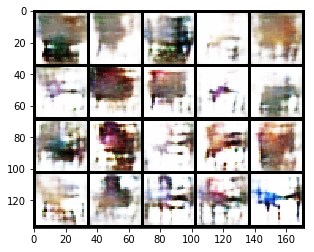

Epoch 100: Train D loss: -0.6227, G loss: 0.3306
Epoch 101: Train D loss: -0.6364, G loss: 0.3563
Epoch 102: Train D loss: -0.6143, G loss: 0.3190
Epoch 103: Train D loss: -0.6772, G loss: 0.4029
Epoch 104: Train D loss: -0.6422, G loss: 0.3842
Epoch 105: Train D loss: -0.6058, G loss: 0.3798
Epoch 106: Train D loss: -0.6593, G loss: 0.3930
Epoch 107: Train D loss: -0.6197, G loss: 0.3398
Epoch 108: Train D loss: -0.6005, G loss: 0.3257
Epoch 109: Train D loss: -0.6579, G loss: 0.3733


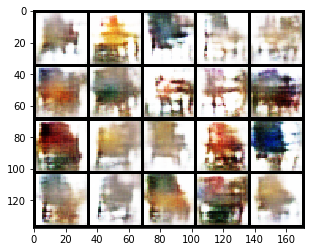

Epoch 110: Train D loss: -0.6221, G loss: 0.3779
Epoch 111: Train D loss: -0.5937, G loss: 0.2317
Epoch 112: Train D loss: -0.6307, G loss: 0.3652
Epoch 113: Train D loss: -0.6280, G loss: 0.3400
Epoch 114: Train D loss: -0.6341, G loss: 0.3623
Epoch 115: Train D loss: -0.6343, G loss: 0.3560
Epoch 116: Train D loss: -0.5709, G loss: 0.3501
Epoch 117: Train D loss: -0.6136, G loss: 0.3641
Epoch 118: Train D loss: -0.6321, G loss: 0.3405
Epoch 119: Train D loss: -0.5431, G loss: 0.2396


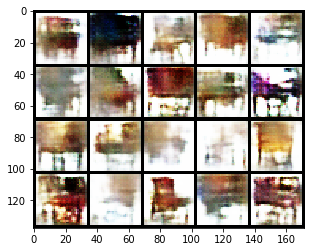

Epoch 120: Train D loss: -0.6321, G loss: 0.3795
Epoch 121: Train D loss: -0.6082, G loss: 0.3780
Epoch 122: Train D loss: -0.5818, G loss: 0.3775
Epoch 123: Train D loss: -0.6221, G loss: 0.3646
Epoch 124: Train D loss: -0.5902, G loss: 0.3850
Epoch 125: Train D loss: -0.5627, G loss: 0.2956
Epoch 126: Train D loss: -0.6048, G loss: 0.3335
Epoch 127: Train D loss: -0.6027, G loss: 0.3403
Epoch 128: Train D loss: -0.6012, G loss: 0.3914
Epoch 129: Train D loss: -0.5716, G loss: 0.3063


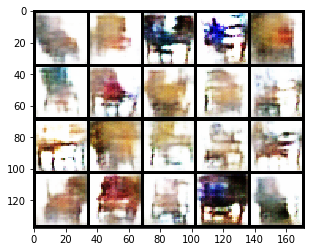

Epoch 130: Train D loss: -0.5838, G loss: 0.3862
Epoch 131: Train D loss: -0.5523, G loss: 0.3128
Epoch 132: Train D loss: -0.6116, G loss: 0.3149
Epoch 133: Train D loss: -0.5733, G loss: 0.3935
Epoch 134: Train D loss: -0.5739, G loss: 0.3754
Epoch 135: Train D loss: -0.5941, G loss: 0.3313
Epoch 136: Train D loss: -0.5467, G loss: 0.2653
Epoch 137: Train D loss: -0.5598, G loss: 0.3272
Epoch 138: Train D loss: -0.5870, G loss: 0.3482
Epoch 139: Train D loss: -0.5935, G loss: 0.3770


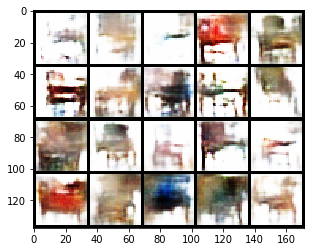

Epoch 140: Train D loss: -0.5273, G loss: 0.3238
Epoch 141: Train D loss: -0.6207, G loss: 0.3733
Epoch 142: Train D loss: -0.5617, G loss: 0.4061
Epoch 143: Train D loss: -0.5719, G loss: 0.3841
Epoch 144: Train D loss: -0.5568, G loss: 0.3012
Epoch 145: Train D loss: -0.5462, G loss: 0.3040
Epoch 146: Train D loss: -0.5496, G loss: 0.2390
Epoch 147: Train D loss: -0.5754, G loss: 0.4001
Epoch 148: Train D loss: -0.5699, G loss: 0.3319
Epoch 149: Train D loss: -0.5802, G loss: 0.3145


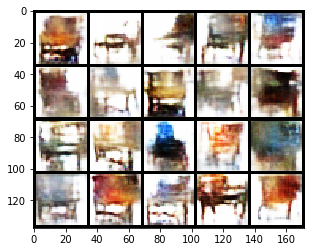

Epoch 150: Train D loss: -0.5039, G loss: 0.2206
Epoch 151: Train D loss: -0.5940, G loss: 0.3631
Epoch 152: Train D loss: -0.5674, G loss: 0.3382
Epoch 153: Train D loss: -0.5711, G loss: 0.3681
Epoch 154: Train D loss: -0.5610, G loss: 0.3710
Epoch 155: Train D loss: -0.5583, G loss: 0.3411
Epoch 156: Train D loss: -0.5788, G loss: 0.3457
Epoch 157: Train D loss: -0.4969, G loss: 0.2327
Epoch 158: Train D loss: -0.5247, G loss: 0.2106
Epoch 159: Train D loss: -0.5291, G loss: 0.3415


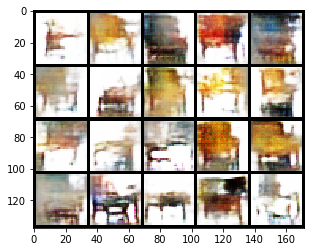

Epoch 160: Train D loss: -0.5365, G loss: 0.2614
Epoch 161: Train D loss: -0.5419, G loss: 0.3467
Epoch 162: Train D loss: -0.5498, G loss: 0.3820
Epoch 163: Train D loss: -0.4972, G loss: 0.2070
Epoch 164: Train D loss: -0.4909, G loss: 0.2238
Epoch 165: Train D loss: -0.5747, G loss: 0.3217
Epoch 166: Train D loss: -0.5532, G loss: 0.3598
Epoch 167: Train D loss: -0.5135, G loss: 0.3448
Epoch 168: Train D loss: -0.5399, G loss: 0.2780
Epoch 169: Train D loss: -0.5205, G loss: 0.3307


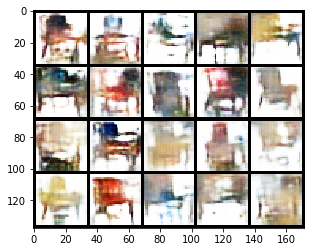

Epoch 170: Train D loss: -0.5239, G loss: 0.2833
Epoch 171: Train D loss: -0.5284, G loss: 0.3141
Epoch 172: Train D loss: -0.5278, G loss: 0.3009
Epoch 173: Train D loss: -0.5163, G loss: 0.2261
Epoch 174: Train D loss: -0.4930, G loss: 0.2533
Epoch 175: Train D loss: -0.5355, G loss: 0.3663
Epoch 176: Train D loss: -0.5471, G loss: 0.3368
Epoch 177: Train D loss: -0.5188, G loss: 0.3399
Epoch 178: Train D loss: -0.5264, G loss: 0.3376
Epoch 179: Train D loss: -0.5403, G loss: 0.3757


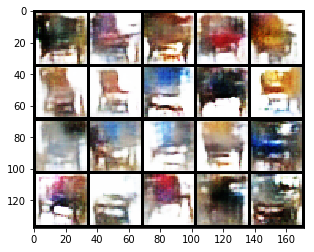

Epoch 180: Train D loss: -0.5085, G loss: 0.3228
Epoch 181: Train D loss: -0.5113, G loss: 0.2708
Epoch 182: Train D loss: -0.5209, G loss: 0.3482
Epoch 183: Train D loss: -0.5141, G loss: 0.3079
Epoch 184: Train D loss: -0.4938, G loss: 0.3375
Epoch 185: Train D loss: -0.5403, G loss: 0.3626
Epoch 186: Train D loss: -0.4795, G loss: 0.3300
Epoch 187: Train D loss: -0.4906, G loss: 0.2154
Epoch 188: Train D loss: -0.5204, G loss: 0.2850
Epoch 189: Train D loss: -0.5638, G loss: 0.4094


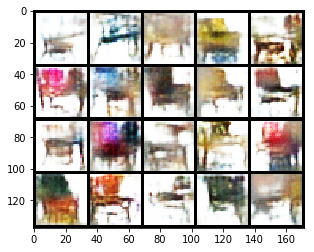

Epoch 190: Train D loss: -0.5170, G loss: 0.3681
Epoch 191: Train D loss: -0.5039, G loss: 0.3423
Epoch 192: Train D loss: -0.4677, G loss: 0.1728
Epoch 193: Train D loss: -0.5633, G loss: 0.3121
Epoch 194: Train D loss: -0.4741, G loss: 0.2327
Epoch 195: Train D loss: -0.5548, G loss: 0.3839
Epoch 196: Train D loss: -0.4975, G loss: 0.2933
Epoch 197: Train D loss: -0.4898, G loss: 0.2210
Epoch 198: Train D loss: -0.5311, G loss: 0.2404
Epoch 199: Train D loss: -0.5265, G loss: 0.3678


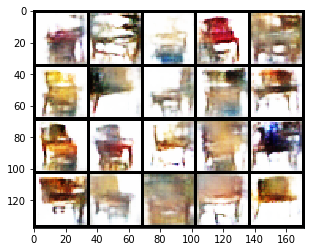

Epoch 200: Train D loss: -0.4934, G loss: 0.3067
Epoch 201: Train D loss: -0.4937, G loss: 0.2795
Epoch 202: Train D loss: -0.5142, G loss: 0.3106
Epoch 203: Train D loss: -0.4978, G loss: 0.2952
Epoch 204: Train D loss: -0.4841, G loss: 0.2185
Epoch 205: Train D loss: -0.5233, G loss: 0.2937
Epoch 206: Train D loss: -0.4590, G loss: 0.2361
Epoch 207: Train D loss: -0.5680, G loss: 0.3372
Epoch 208: Train D loss: -0.4921, G loss: 0.3352
Epoch 209: Train D loss: -0.4918, G loss: 0.2814


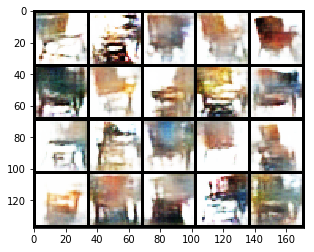

Epoch 210: Train D loss: -0.4667, G loss: 0.3072
Epoch 211: Train D loss: -0.4943, G loss: 0.2532
Epoch 212: Train D loss: -0.4659, G loss: 0.2630
Epoch 213: Train D loss: -0.4939, G loss: 0.3026
Epoch 214: Train D loss: -0.4541, G loss: 0.1939
Epoch 215: Train D loss: -0.5185, G loss: 0.2947
Epoch 216: Train D loss: -0.4722, G loss: 0.2938
Epoch 217: Train D loss: -0.5092, G loss: 0.3316
Epoch 218: Train D loss: -0.5022, G loss: 0.2823
Epoch 219: Train D loss: -0.4469, G loss: 0.1999


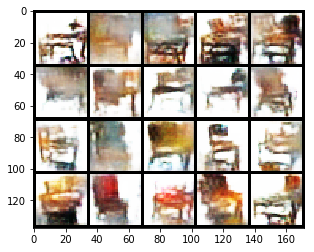

Epoch 220: Train D loss: -0.5092, G loss: 0.2623
Epoch 221: Train D loss: -0.4426, G loss: 0.1863
Epoch 222: Train D loss: -0.5044, G loss: 0.3222
Epoch 223: Train D loss: -0.4506, G loss: 0.2715
Epoch 224: Train D loss: -0.4969, G loss: 0.2821
Epoch 225: Train D loss: -0.4781, G loss: 0.2896
Epoch 226: Train D loss: -0.4945, G loss: 0.2294
Epoch 227: Train D loss: -0.4641, G loss: 0.2352
Epoch 228: Train D loss: -0.4862, G loss: 0.3217
Epoch 229: Train D loss: -0.4905, G loss: 0.3271


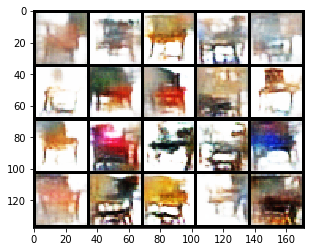

Epoch 230: Train D loss: -0.4466, G loss: 0.2329
Epoch 231: Train D loss: -0.5077, G loss: 0.3337
Epoch 232: Train D loss: -0.4473, G loss: 0.2556
Epoch 233: Train D loss: -0.4894, G loss: 0.3003
Epoch 234: Train D loss: -0.4399, G loss: 0.1738
Epoch 235: Train D loss: -0.4854, G loss: 0.3087
Epoch 236: Train D loss: -0.4806, G loss: 0.2922
Epoch 237: Train D loss: -0.4798, G loss: 0.3837
Epoch 238: Train D loss: -0.4649, G loss: 0.3041
Epoch 239: Train D loss: -0.4867, G loss: 0.3317


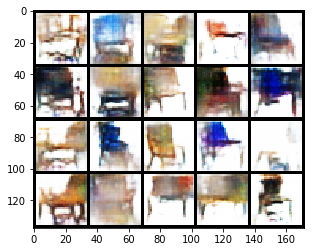

Epoch 240: Train D loss: -0.4584, G loss: 0.3147
Epoch 241: Train D loss: -0.4304, G loss: 0.1943
Epoch 242: Train D loss: -0.4816, G loss: 0.3012
Epoch 243: Train D loss: -0.4471, G loss: 0.3031
Epoch 244: Train D loss: -0.4653, G loss: 0.2559
Epoch 245: Train D loss: -0.4683, G loss: 0.3012
Epoch 246: Train D loss: -0.4592, G loss: 0.2909
Epoch 247: Train D loss: -0.4603, G loss: 0.2915
Epoch 248: Train D loss: -0.4563, G loss: 0.2889
Epoch 249: Train D loss: -0.4684, G loss: 0.3505


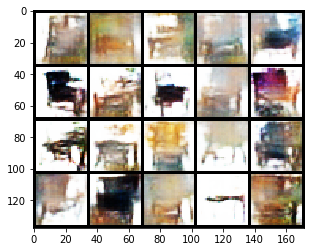

Epoch 250: Train D loss: -0.4608, G loss: 0.2811
Epoch 251: Train D loss: -0.4283, G loss: 0.2685
Epoch 252: Train D loss: -0.4802, G loss: 0.2657
Epoch 253: Train D loss: -0.4541, G loss: 0.2260
Epoch 254: Train D loss: -0.4358, G loss: 0.2035
Epoch 255: Train D loss: -0.4490, G loss: 0.1951
Epoch 256: Train D loss: -0.4539, G loss: 0.2794
Epoch 257: Train D loss: -0.4773, G loss: 0.2943
Epoch 258: Train D loss: -0.4472, G loss: 0.2309
Epoch 259: Train D loss: -0.4480, G loss: 0.2397


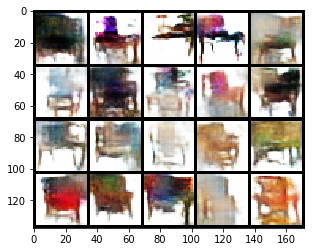

Epoch 260: Train D loss: -0.4196, G loss: 0.2494
Epoch 261: Train D loss: -0.4858, G loss: 0.2600
Epoch 262: Train D loss: -0.4096, G loss: 0.2109
Epoch 263: Train D loss: -0.5053, G loss: 0.3467
Epoch 264: Train D loss: -0.3980, G loss: 0.2351
Epoch 265: Train D loss: -0.4721, G loss: 0.1679
Epoch 266: Train D loss: -0.4397, G loss: 0.3228
Epoch 267: Train D loss: -0.4751, G loss: 0.3266
Epoch 268: Train D loss: -0.3902, G loss: 0.1963
Epoch 269: Train D loss: -0.4971, G loss: 0.2540


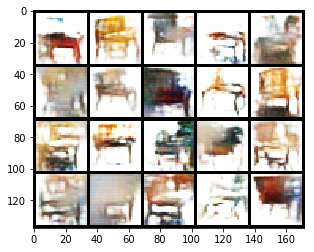

Epoch 270: Train D loss: -0.4001, G loss: 0.1492
Epoch 271: Train D loss: -0.4860, G loss: 0.2383
Epoch 272: Train D loss: -0.4160, G loss: 0.2204
Epoch 273: Train D loss: -0.4720, G loss: 0.2990
Epoch 274: Train D loss: -0.4660, G loss: 0.2891
Epoch 275: Train D loss: -0.4172, G loss: 0.2373
Epoch 276: Train D loss: -0.4581, G loss: 0.2208
Epoch 277: Train D loss: -0.4563, G loss: 0.1903
Epoch 278: Train D loss: -0.3940, G loss: 0.1344
Epoch 279: Train D loss: -0.4436, G loss: 0.1794


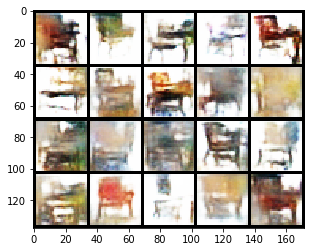

Epoch 280: Train D loss: -0.4775, G loss: 0.2670
Epoch 281: Train D loss: -0.3979, G loss: 0.1769
Epoch 282: Train D loss: -0.4680, G loss: 0.2692
Epoch 283: Train D loss: -0.4102, G loss: 0.2548
Epoch 284: Train D loss: -0.4635, G loss: 0.2490
Epoch 285: Train D loss: -0.4669, G loss: 0.2973
Epoch 286: Train D loss: -0.4261, G loss: 0.2153
Epoch 287: Train D loss: -0.4485, G loss: 0.2633
Epoch 288: Train D loss: -0.4690, G loss: 0.2551
Epoch 289: Train D loss: -0.4116, G loss: 0.2063


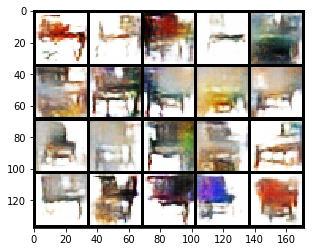

Epoch 290: Train D loss: -0.4332, G loss: 0.2716
Epoch 291: Train D loss: -0.4418, G loss: 0.3322
Epoch 292: Train D loss: -0.4391, G loss: 0.3035
Epoch 293: Train D loss: -0.4378, G loss: 0.2666
Epoch 294: Train D loss: -0.4053, G loss: 0.1562
Epoch 295: Train D loss: -0.4418, G loss: 0.2322
Epoch 296: Train D loss: -0.4265, G loss: 0.2556
Epoch 297: Train D loss: -0.4657, G loss: 0.3634
Epoch 298: Train D loss: -0.4100, G loss: 0.2473
Epoch 299: Train D loss: -0.4681, G loss: 0.3204


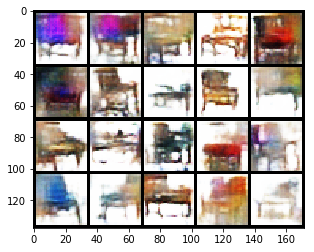

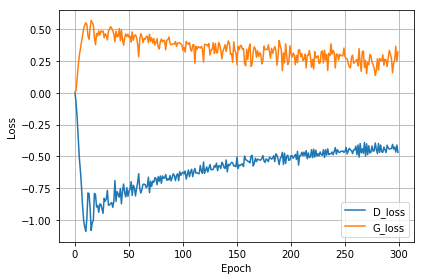

In [90]:
n_d = 3

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

Epoch 0: Train D loss: -0.0314, G loss: 0.0072


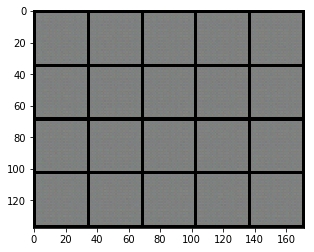

Epoch 1: Train D loss: -0.1113, G loss: 0.0486
Epoch 2: Train D loss: -0.2831, G loss: 0.1616
Epoch 3: Train D loss: -0.4929, G loss: 0.2686
Epoch 4: Train D loss: -0.6705, G loss: 0.3511
Epoch 5: Train D loss: -0.8044, G loss: 0.4165
Epoch 6: Train D loss: -0.9200, G loss: 0.4679
Epoch 7: Train D loss: -0.9895, G loss: 0.5045
Epoch 8: Train D loss: -1.0420, G loss: 0.5313
Epoch 9: Train D loss: -1.0821, G loss: 0.5506


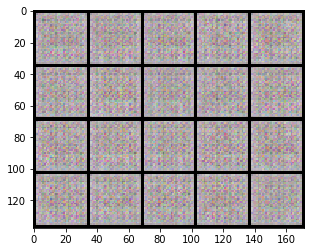

Epoch 10: Train D loss: -1.1379, G loss: 0.5705
Epoch 11: Train D loss: -1.1655, G loss: 0.5889
Epoch 12: Train D loss: -1.2236, G loss: 0.6025
Epoch 13: Train D loss: -1.2385, G loss: 0.6136
Epoch 14: Train D loss: -1.2590, G loss: 0.6189
Epoch 15: Train D loss: -1.2719, G loss: 0.6282
Epoch 16: Train D loss: -1.2770, G loss: 0.6336
Epoch 17: Train D loss: -1.2834, G loss: 0.6419
Epoch 18: Train D loss: -1.2936, G loss: 0.6416
Epoch 19: Train D loss: -1.3033, G loss: 0.6487


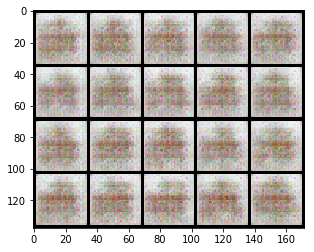

Epoch 20: Train D loss: -1.2372, G loss: 0.6303
Epoch 21: Train D loss: -1.2237, G loss: 0.6344
Epoch 22: Train D loss: -0.9006, G loss: 0.5518
Epoch 23: Train D loss: -1.1648, G loss: 0.6359
Epoch 24: Train D loss: -1.1418, G loss: 0.6197
Epoch 25: Train D loss: -1.2666, G loss: 0.6362
Epoch 26: Train D loss: -1.2292, G loss: 0.6303
Epoch 27: Train D loss: -1.0349, G loss: 0.5947
Epoch 28: Train D loss: -1.0371, G loss: 0.5990
Epoch 29: Train D loss: -1.1203, G loss: 0.6105


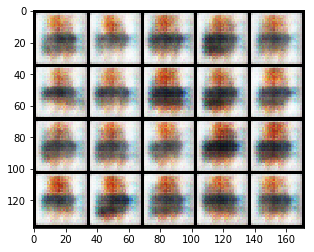

Epoch 30: Train D loss: -1.1613, G loss: 0.6072
Epoch 31: Train D loss: -1.0922, G loss: 0.6048
Epoch 32: Train D loss: -1.1919, G loss: 0.6251
Epoch 33: Train D loss: -1.1158, G loss: 0.6099
Epoch 34: Train D loss: -1.1081, G loss: 0.6015
Epoch 35: Train D loss: -1.0483, G loss: 0.5825
Epoch 36: Train D loss: -1.0986, G loss: 0.6107
Epoch 37: Train D loss: -1.0911, G loss: 0.5936
Epoch 38: Train D loss: -1.0603, G loss: 0.5713
Epoch 39: Train D loss: -0.9953, G loss: 0.5802


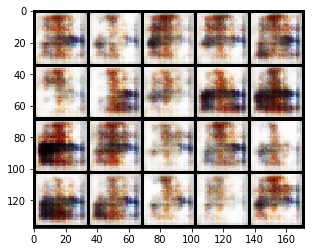

Epoch 40: Train D loss: -0.9443, G loss: 0.5662
Epoch 41: Train D loss: -0.9795, G loss: 0.5549
Epoch 42: Train D loss: -0.9605, G loss: 0.5626
Epoch 43: Train D loss: -0.8566, G loss: 0.5486
Epoch 44: Train D loss: -0.9281, G loss: 0.5343
Epoch 45: Train D loss: -0.8220, G loss: 0.5070
Epoch 46: Train D loss: -0.8942, G loss: 0.4964
Epoch 47: Train D loss: -0.8309, G loss: 0.4801
Epoch 48: Train D loss: -0.8558, G loss: 0.5125
Epoch 49: Train D loss: -0.8429, G loss: 0.4521


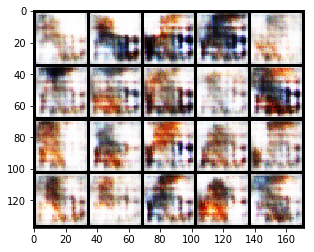

Epoch 50: Train D loss: -0.9185, G loss: 0.5069
Epoch 51: Train D loss: -0.8950, G loss: 0.5059
Epoch 52: Train D loss: -0.7895, G loss: 0.4805
Epoch 53: Train D loss: -0.8266, G loss: 0.4303
Epoch 54: Train D loss: -0.8812, G loss: 0.4897
Epoch 55: Train D loss: -0.8393, G loss: 0.4964
Epoch 56: Train D loss: -0.8577, G loss: 0.5028
Epoch 57: Train D loss: -0.9246, G loss: 0.5061
Epoch 58: Train D loss: -0.8445, G loss: 0.4954
Epoch 59: Train D loss: -0.8647, G loss: 0.4996


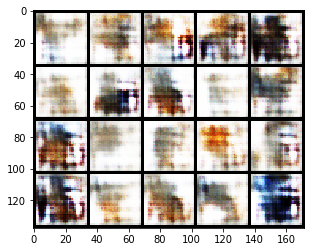

Epoch 60: Train D loss: -0.8558, G loss: 0.4692
Epoch 61: Train D loss: -0.8628, G loss: 0.5023
Epoch 62: Train D loss: -0.9235, G loss: 0.5157
Epoch 63: Train D loss: -0.8548, G loss: 0.4545
Epoch 64: Train D loss: -0.8670, G loss: 0.4963
Epoch 65: Train D loss: -0.9456, G loss: 0.5248
Epoch 66: Train D loss: -0.8822, G loss: 0.5048
Epoch 67: Train D loss: -0.8424, G loss: 0.4624
Epoch 68: Train D loss: -0.8709, G loss: 0.5057
Epoch 69: Train D loss: -0.8529, G loss: 0.4642


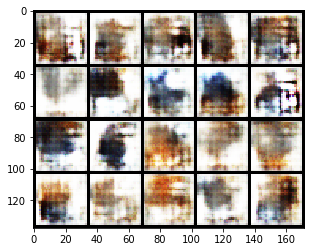

Epoch 70: Train D loss: -0.8687, G loss: 0.4865
Epoch 71: Train D loss: -0.8626, G loss: 0.4652
Epoch 72: Train D loss: -0.7626, G loss: 0.4161
Epoch 73: Train D loss: -0.8700, G loss: 0.5119
Epoch 74: Train D loss: -0.8945, G loss: 0.5002
Epoch 75: Train D loss: -0.9152, G loss: 0.4769
Epoch 76: Train D loss: -0.9077, G loss: 0.5184
Epoch 77: Train D loss: -0.8228, G loss: 0.4698
Epoch 78: Train D loss: -0.8897, G loss: 0.4880
Epoch 79: Train D loss: -0.8560, G loss: 0.5284


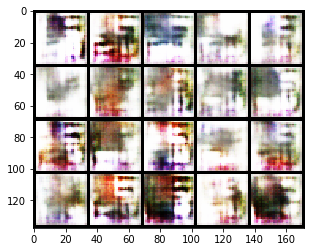

Epoch 80: Train D loss: -0.8865, G loss: 0.4806
Epoch 81: Train D loss: -0.8357, G loss: 0.5019
Epoch 82: Train D loss: -0.8334, G loss: 0.4636
Epoch 83: Train D loss: -0.8393, G loss: 0.4846
Epoch 84: Train D loss: -0.8513, G loss: 0.4646
Epoch 85: Train D loss: -0.8305, G loss: 0.4832
Epoch 86: Train D loss: -0.8553, G loss: 0.4639
Epoch 87: Train D loss: -0.8062, G loss: 0.4833
Epoch 88: Train D loss: -0.7790, G loss: 0.4099
Epoch 89: Train D loss: -0.8691, G loss: 0.4607


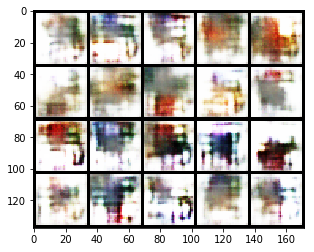

Epoch 90: Train D loss: -0.7908, G loss: 0.4588
Epoch 91: Train D loss: -0.8357, G loss: 0.4995
Epoch 92: Train D loss: -0.8439, G loss: 0.5000
Epoch 93: Train D loss: -0.7917, G loss: 0.4211
Epoch 94: Train D loss: -0.8021, G loss: 0.5011
Epoch 95: Train D loss: -0.8367, G loss: 0.4530
Epoch 96: Train D loss: -0.8306, G loss: 0.4877
Epoch 97: Train D loss: -0.8349, G loss: 0.4909
Epoch 98: Train D loss: -0.8177, G loss: 0.4829
Epoch 99: Train D loss: -0.8399, G loss: 0.4824


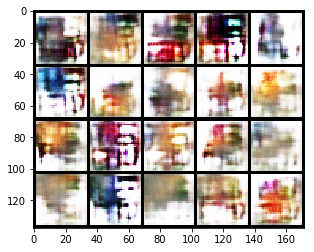

Epoch 100: Train D loss: -0.7682, G loss: 0.4496
Epoch 101: Train D loss: -0.8190, G loss: 0.5080
Epoch 102: Train D loss: -0.8177, G loss: 0.4347
Epoch 103: Train D loss: -0.7542, G loss: 0.4045
Epoch 104: Train D loss: -0.7934, G loss: 0.4229
Epoch 105: Train D loss: -0.8022, G loss: 0.4481
Epoch 106: Train D loss: -0.8010, G loss: 0.4654
Epoch 107: Train D loss: -0.7680, G loss: 0.4622
Epoch 108: Train D loss: -0.8165, G loss: 0.4402
Epoch 109: Train D loss: -0.7714, G loss: 0.4527


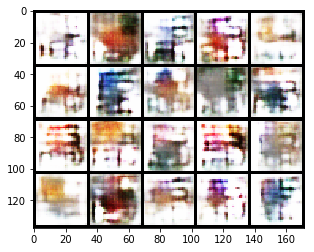

Epoch 110: Train D loss: -0.7802, G loss: 0.3858
Epoch 111: Train D loss: -0.8121, G loss: 0.4457
Epoch 112: Train D loss: -0.7698, G loss: 0.4766
Epoch 113: Train D loss: -0.8219, G loss: 0.4645
Epoch 114: Train D loss: -0.7652, G loss: 0.4493
Epoch 115: Train D loss: -0.7881, G loss: 0.4342
Epoch 116: Train D loss: -0.7343, G loss: 0.4506
Epoch 117: Train D loss: -0.7742, G loss: 0.4348
Epoch 118: Train D loss: -0.7862, G loss: 0.4344
Epoch 119: Train D loss: -0.7231, G loss: 0.3541


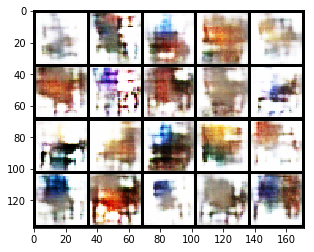

Epoch 120: Train D loss: -0.8119, G loss: 0.4897
Epoch 121: Train D loss: -0.8018, G loss: 0.4141
Epoch 122: Train D loss: -0.7393, G loss: 0.4320
Epoch 123: Train D loss: -0.7728, G loss: 0.4681
Epoch 124: Train D loss: -0.7676, G loss: 0.4070
Epoch 125: Train D loss: -0.7524, G loss: 0.4814
Epoch 126: Train D loss: -0.7431, G loss: 0.4376
Epoch 127: Train D loss: -0.7744, G loss: 0.4833
Epoch 128: Train D loss: -0.7766, G loss: 0.4344
Epoch 129: Train D loss: -0.7321, G loss: 0.3779


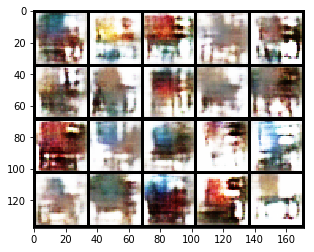

Epoch 130: Train D loss: -0.7809, G loss: 0.4463
Epoch 131: Train D loss: -0.7241, G loss: 0.4252
Epoch 132: Train D loss: -0.7055, G loss: 0.3801
Epoch 133: Train D loss: -0.7179, G loss: 0.3065
Epoch 134: Train D loss: -0.7927, G loss: 0.4674
Epoch 135: Train D loss: -0.7449, G loss: 0.4473
Epoch 136: Train D loss: -0.7171, G loss: 0.4918
Epoch 137: Train D loss: -0.7644, G loss: 0.4496
Epoch 138: Train D loss: -0.7288, G loss: 0.3739
Epoch 139: Train D loss: -0.7178, G loss: 0.4158


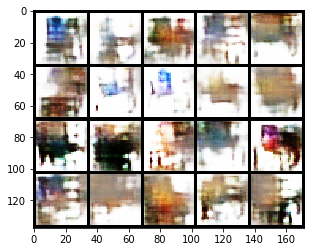

Epoch 140: Train D loss: -0.7561, G loss: 0.4353
Epoch 141: Train D loss: -0.7795, G loss: 0.4514
Epoch 142: Train D loss: -0.6957, G loss: 0.2896
Epoch 143: Train D loss: -0.7086, G loss: 0.3948
Epoch 144: Train D loss: -0.8052, G loss: 0.4657
Epoch 145: Train D loss: -0.7106, G loss: 0.3730
Epoch 146: Train D loss: -0.7129, G loss: 0.3361
Epoch 147: Train D loss: -0.7055, G loss: 0.4597
Epoch 148: Train D loss: -0.7591, G loss: 0.4870
Epoch 149: Train D loss: -0.7022, G loss: 0.3864


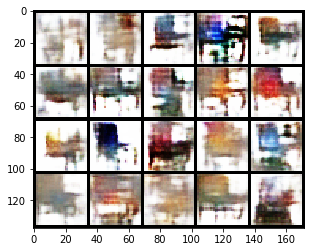

Epoch 150: Train D loss: -0.7291, G loss: 0.4334
Epoch 151: Train D loss: -0.7468, G loss: 0.4709
Epoch 152: Train D loss: -0.7471, G loss: 0.4718
Epoch 153: Train D loss: -0.6507, G loss: 0.3831
Epoch 154: Train D loss: -0.7457, G loss: 0.3702
Epoch 155: Train D loss: -0.7976, G loss: 0.4863
Epoch 156: Train D loss: -0.7198, G loss: 0.4656
Epoch 157: Train D loss: -0.7179, G loss: 0.4623
Epoch 158: Train D loss: -0.7156, G loss: 0.3780
Epoch 159: Train D loss: -0.7044, G loss: 0.3813


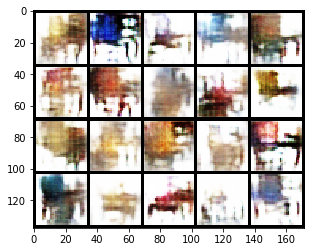

Epoch 160: Train D loss: -0.7694, G loss: 0.4445
Epoch 161: Train D loss: -0.7405, G loss: 0.4333
Epoch 162: Train D loss: -0.6878, G loss: 0.3893
Epoch 163: Train D loss: -0.7138, G loss: 0.4335
Epoch 164: Train D loss: -0.6878, G loss: 0.4244
Epoch 165: Train D loss: -0.7326, G loss: 0.4439
Epoch 166: Train D loss: -0.6864, G loss: 0.4338
Epoch 167: Train D loss: -0.7008, G loss: 0.3619
Epoch 168: Train D loss: -0.6923, G loss: 0.3368
Epoch 169: Train D loss: -0.6737, G loss: 0.3678


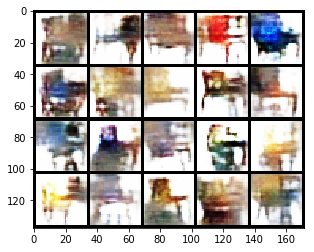

Epoch 170: Train D loss: -0.6574, G loss: 0.3335
Epoch 171: Train D loss: -0.6917, G loss: 0.3690
Epoch 172: Train D loss: -0.6591, G loss: 0.3293
Epoch 173: Train D loss: -0.6722, G loss: 0.3949
Epoch 174: Train D loss: -0.6800, G loss: 0.3414
Epoch 175: Train D loss: -0.7220, G loss: 0.4409
Epoch 176: Train D loss: -0.6813, G loss: 0.3675
Epoch 177: Train D loss: -0.6349, G loss: 0.3122
Epoch 178: Train D loss: -0.7302, G loss: 0.4253
Epoch 179: Train D loss: -0.7029, G loss: 0.4529


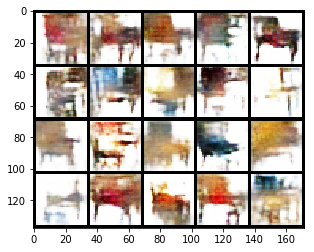

Epoch 180: Train D loss: -0.6472, G loss: 0.3537
Epoch 181: Train D loss: -0.6872, G loss: 0.4651
Epoch 182: Train D loss: -0.6185, G loss: 0.3171
Epoch 183: Train D loss: -0.6553, G loss: 0.4173
Epoch 184: Train D loss: -0.6987, G loss: 0.3894
Epoch 185: Train D loss: -0.6487, G loss: 0.4360
Epoch 186: Train D loss: -0.6400, G loss: 0.3498
Epoch 187: Train D loss: -0.7039, G loss: 0.4758
Epoch 188: Train D loss: -0.6354, G loss: 0.3253
Epoch 189: Train D loss: -0.6355, G loss: 0.2725


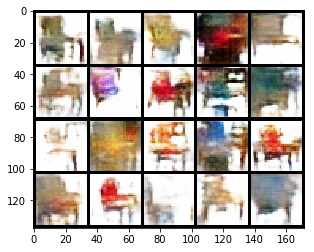

Epoch 190: Train D loss: -0.6620, G loss: 0.1852
Epoch 191: Train D loss: -0.6552, G loss: 0.3779
Epoch 192: Train D loss: -0.6338, G loss: 0.3712
Epoch 193: Train D loss: -0.6990, G loss: 0.4162
Epoch 194: Train D loss: -0.6081, G loss: 0.3197
Epoch 195: Train D loss: -0.6724, G loss: 0.3152
Epoch 196: Train D loss: -0.6510, G loss: 0.3728
Epoch 197: Train D loss: -0.6212, G loss: 0.3378
Epoch 198: Train D loss: -0.6517, G loss: 0.4127
Epoch 199: Train D loss: -0.6461, G loss: 0.4145


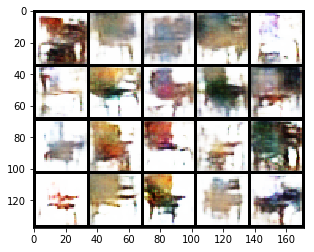

Epoch 200: Train D loss: -0.6420, G loss: 0.3602
Epoch 201: Train D loss: -0.6159, G loss: 0.3260
Epoch 202: Train D loss: -0.6555, G loss: 0.3338
Epoch 203: Train D loss: -0.6962, G loss: 0.4176
Epoch 204: Train D loss: -0.6206, G loss: 0.3626
Epoch 205: Train D loss: -0.6118, G loss: 0.3034
Epoch 206: Train D loss: -0.6486, G loss: 0.3549
Epoch 207: Train D loss: -0.6572, G loss: 0.3970
Epoch 208: Train D loss: -0.6139, G loss: 0.3297
Epoch 209: Train D loss: -0.6410, G loss: 0.4087


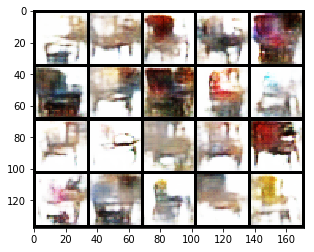

Epoch 210: Train D loss: -0.6205, G loss: 0.3534
Epoch 211: Train D loss: -0.6371, G loss: 0.3930
Epoch 212: Train D loss: -0.6060, G loss: 0.2988
Epoch 213: Train D loss: -0.6024, G loss: 0.3279
Epoch 214: Train D loss: -0.6808, G loss: 0.4979
Epoch 215: Train D loss: -0.6380, G loss: 0.4089
Epoch 216: Train D loss: -0.5406, G loss: 0.2076
Epoch 217: Train D loss: -0.6732, G loss: 0.4355
Epoch 218: Train D loss: -0.7086, G loss: 0.4301
Epoch 219: Train D loss: -0.6092, G loss: 0.3913


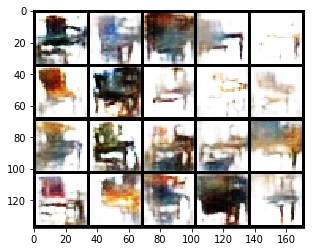

Epoch 220: Train D loss: -0.5910, G loss: 0.3940
Epoch 221: Train D loss: -0.6466, G loss: 0.3581
Epoch 222: Train D loss: -0.5865, G loss: 0.3867
Epoch 223: Train D loss: -0.6486, G loss: 0.5079
Epoch 224: Train D loss: -0.6838, G loss: 0.4802
Epoch 225: Train D loss: -0.6143, G loss: 0.4008
Epoch 226: Train D loss: -0.6000, G loss: 0.3419
Epoch 227: Train D loss: -0.7160, G loss: 0.4016
Epoch 228: Train D loss: -0.6022, G loss: 0.3738
Epoch 229: Train D loss: -0.5573, G loss: 0.1697


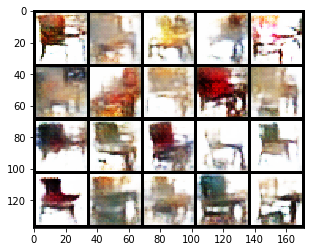

Epoch 230: Train D loss: -0.6803, G loss: 0.4122
Epoch 231: Train D loss: -0.6589, G loss: 0.4377
Epoch 232: Train D loss: -0.5862, G loss: 0.3478
Epoch 233: Train D loss: -0.5983, G loss: 0.3887
Epoch 234: Train D loss: -0.6321, G loss: 0.3755
Epoch 235: Train D loss: -0.6232, G loss: 0.3165
Epoch 236: Train D loss: -0.6224, G loss: 0.3771
Epoch 237: Train D loss: -0.5819, G loss: 0.2872
Epoch 238: Train D loss: -0.6280, G loss: 0.4124
Epoch 239: Train D loss: -0.6184, G loss: 0.3017


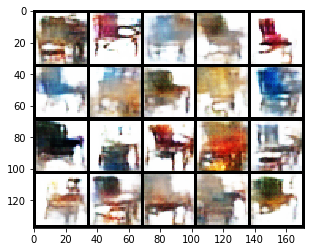

Epoch 240: Train D loss: -0.5323, G loss: 0.2407
Epoch 241: Train D loss: -0.6877, G loss: 0.4857
Epoch 242: Train D loss: -0.6487, G loss: 0.3653
Epoch 243: Train D loss: -0.5677, G loss: 0.3279
Epoch 244: Train D loss: -0.6078, G loss: 0.3921
Epoch 245: Train D loss: -0.5678, G loss: 0.1790
Epoch 246: Train D loss: -0.6524, G loss: 0.4612
Epoch 247: Train D loss: -0.6636, G loss: 0.4154
Epoch 248: Train D loss: -0.5670, G loss: 0.1998
Epoch 249: Train D loss: -0.5971, G loss: 0.3634


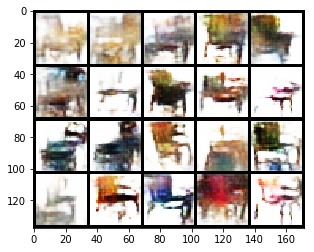

Epoch 250: Train D loss: -0.6645, G loss: 0.3882
Epoch 251: Train D loss: -0.6238, G loss: 0.4231
Epoch 252: Train D loss: -0.5594, G loss: 0.4191
Epoch 253: Train D loss: -0.6190, G loss: 0.4326
Epoch 254: Train D loss: -0.5840, G loss: 0.3729
Epoch 255: Train D loss: -0.5657, G loss: 0.3549
Epoch 256: Train D loss: -0.5742, G loss: 0.3129
Epoch 257: Train D loss: -0.5735, G loss: 0.3852
Epoch 258: Train D loss: -0.6416, G loss: 0.3904
Epoch 259: Train D loss: -0.5669, G loss: 0.2132


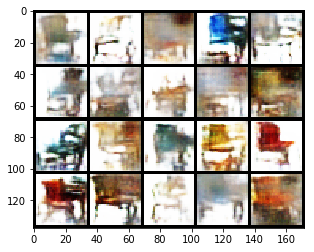

Epoch 260: Train D loss: -0.6177, G loss: 0.3052
Epoch 261: Train D loss: -0.5939, G loss: 0.3055
Epoch 262: Train D loss: -0.5778, G loss: 0.2818
Epoch 263: Train D loss: -0.6312, G loss: 0.3570
Epoch 264: Train D loss: -0.6026, G loss: 0.3990
Epoch 265: Train D loss: -0.6217, G loss: 0.4100
Epoch 266: Train D loss: -0.5412, G loss: 0.2673
Epoch 267: Train D loss: -0.5807, G loss: 0.2211
Epoch 268: Train D loss: -0.6242, G loss: 0.3256
Epoch 269: Train D loss: -0.5354, G loss: 0.3497


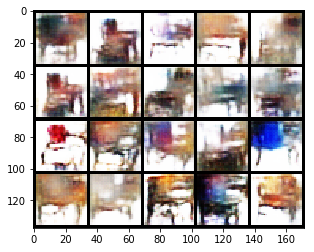

Epoch 270: Train D loss: -0.5820, G loss: 0.4048
Epoch 271: Train D loss: -0.5566, G loss: 0.3965
Epoch 272: Train D loss: -0.5786, G loss: 0.2859
Epoch 273: Train D loss: -0.5782, G loss: 0.3817
Epoch 274: Train D loss: -0.5674, G loss: 0.2432
Epoch 275: Train D loss: -0.6148, G loss: 0.4058
Epoch 276: Train D loss: -0.5982, G loss: 0.3973
Epoch 277: Train D loss: -0.5165, G loss: 0.2235
Epoch 278: Train D loss: -0.6032, G loss: 0.3653
Epoch 279: Train D loss: -0.5794, G loss: 0.3895


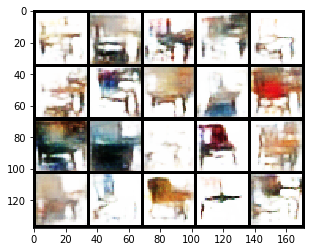

Epoch 280: Train D loss: -0.5528, G loss: 0.2965
Epoch 281: Train D loss: -0.6272, G loss: 0.4562
Epoch 282: Train D loss: -0.6296, G loss: 0.4655
Epoch 283: Train D loss: -0.5320, G loss: 0.2859
Epoch 284: Train D loss: -0.5230, G loss: 0.1803
Epoch 285: Train D loss: -0.6019, G loss: 0.3246
Epoch 286: Train D loss: -0.5851, G loss: 0.3002
Epoch 287: Train D loss: -0.5699, G loss: 0.3265
Epoch 288: Train D loss: -0.5912, G loss: 0.3132
Epoch 289: Train D loss: -0.5798, G loss: 0.3768


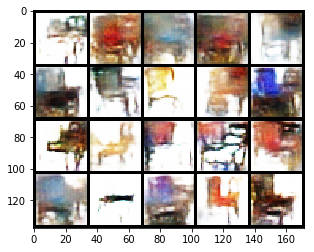

Epoch 290: Train D loss: -0.5634, G loss: 0.2875
Epoch 291: Train D loss: -0.5665, G loss: 0.3458
Epoch 292: Train D loss: -0.5785, G loss: 0.3269
Epoch 293: Train D loss: -0.5886, G loss: 0.3580
Epoch 294: Train D loss: -0.5782, G loss: 0.3639
Epoch 295: Train D loss: -0.5456, G loss: 0.2430
Epoch 296: Train D loss: -0.5482, G loss: 0.3546
Epoch 297: Train D loss: -0.5495, G loss: 0.3133
Epoch 298: Train D loss: -0.5833, G loss: 0.2916
Epoch 299: Train D loss: -0.5351, G loss: 0.2997


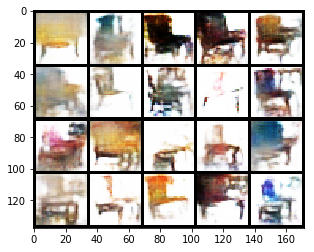

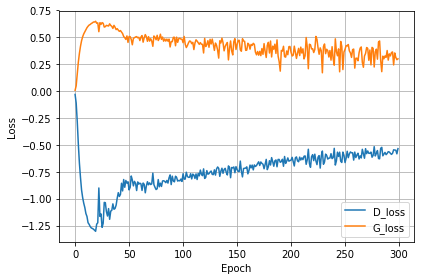

In [91]:
n_d = 5

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist, g_loss_hist = run_wgan(trainloader, G, D, G_optimizer, D_optimizer, n_epochs, device, 
                                    latent_dim, n_d, weight_clip)

loss_plot(d_loss_hist, g_loss_hist)

## WGAN-GP(improved wgan)

在WGAN中，需要进行截断, 在实验中发现： 对于比较深的WAGN，它不容易收敛。

大致原因如下：
1. 实验发现最后大多数的权重都在-c 和c上,这就意味了大部分权重只有两个可能数,这太简单了,作为一个深度神经网络来说,这实在是对它强大的拟合能力的浪费.
2. 实验发现容易导致梯度消失或梯度爆炸。判别器是一个多层网络，如果把clip的值设得稍微小了一点,每经过一层网络,梯度就变小一点点,多层之后就会指数衰减；反之,则容易导致梯度爆炸.

所以WGAN-GP使用了Gradient penalty(梯度惩罚）来代替clip.
因为Lipschitz限制是要求判别器的梯度不超过K,所以可以直接使用一个loss term来实现这一点,所以改进后D的优化目标改进为如下:
![wgan_gp](pictures/wgan-gp.svg)

下面是WGAN-GP的具体代码实现,同WGAN,我们也只实现了他的训练代码,而模型我们直接使用DCGAN的模型.

In [92]:
import torch.autograd as autograd

def wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, z_dim, lambda_=10, n_d=2):
    
    D.train()
    G.train()
    
    D_total_loss = 0
    G_total_loss = 0
    
    
    for i, (x, _) in enumerate(trainloader):
        x = x.to(device)

        # update D network
        # D optimizer zero grads
        D_optimizer.zero_grad()
        
        # D real loss from real images
        d_real = D(x)
        d_real_loss = - d_real.mean()
        
        # D fake loss from fake images generated by G
        z = torch.rand(x.size(0), z_dim).to(device)
        g_z = G(z)
        d_fake = D(g_z)
        d_fake_loss = d_fake.mean()
        
        # D gradient penalty
        
        #   a random number epsilon
        epsilon = torch.rand(x.size(0), 1, 1, 1).cuda()
        x_hat = epsilon * x + (1 - epsilon) * g_z
        x_hat.requires_grad_(True)

        y_hat = D(x_hat)
        #   computes the sum of gradients of y_hat with regard to x_hat
        gradients = autograd.grad(outputs=y_hat, inputs=x_hat, grad_outputs=torch.ones(y_hat.size()).cuda(),
                                  create_graph=True, retain_graph=True, only_inputs=True)[0]
        #   computes gradientpenalty
        gradient_penalty =  torch.mean((gradients.view(gradients.size()[0], -1).norm(p=2, dim=1) - 1) ** 2)
        
        # D backward and step
        d_loss = d_real_loss + d_fake_loss + lambda_ * gradient_penalty
        d_loss.backward()
        D_optimizer.step()
        
            
        D_total_loss += d_loss.item()

        # update G network
        # G optimizer zero grads
        if (i + 1) % n_d == 0:
            G_optimizer.zero_grad()

            # G loss
            g_z = G(z)
            d_fake = D(g_z)
            g_loss = - d_fake.mean()

            # G backward and step
            g_loss.backward()
            G_optimizer.step()
            
            G_total_loss += g_loss.item()
    
    return D_total_loss / len(trainloader), G_total_loss * n_d / len(trainloader)

Epoch 0: Train D loss: 1.9836, G loss: 2.6327


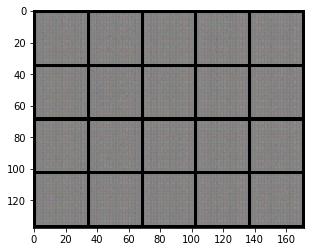

Epoch 1: Train D loss: -7.2133, G loss: 7.7232
Epoch 2: Train D loss: -12.9849, G loss: 16.1687
Epoch 3: Train D loss: -17.8176, G loss: 21.6530
Epoch 4: Train D loss: -25.3518, G loss: 24.3927
Epoch 5: Train D loss: -20.6025, G loss: 22.0234
Epoch 6: Train D loss: -14.9356, G loss: 19.8166
Epoch 7: Train D loss: -14.4607, G loss: 19.0583
Epoch 8: Train D loss: -14.1215, G loss: 20.1663
Epoch 9: Train D loss: -13.3727, G loss: 19.9637


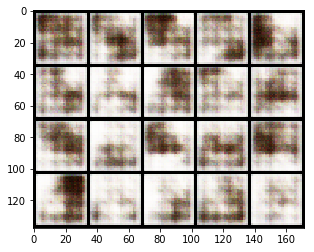

Epoch 10: Train D loss: -13.2598, G loss: 20.7989
Epoch 11: Train D loss: -12.0654, G loss: 19.5870
Epoch 12: Train D loss: -12.3566, G loss: 20.9982
Epoch 13: Train D loss: -12.1246, G loss: 20.3134
Epoch 14: Train D loss: -11.8028, G loss: 20.5599
Epoch 15: Train D loss: -12.1089, G loss: 21.9637
Epoch 16: Train D loss: -12.1009, G loss: 22.3998
Epoch 17: Train D loss: -12.5881, G loss: 22.6294
Epoch 18: Train D loss: -12.2362, G loss: 23.1547
Epoch 19: Train D loss: -11.4941, G loss: 23.1598


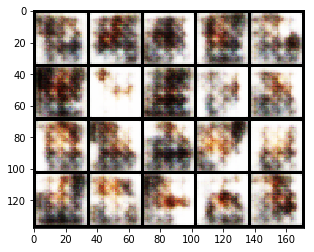

Epoch 20: Train D loss: -12.1710, G loss: 23.9154
Epoch 21: Train D loss: -11.3467, G loss: 23.4728
Epoch 22: Train D loss: -10.4100, G loss: 23.2481
Epoch 23: Train D loss: -10.5520, G loss: 22.9967
Epoch 24: Train D loss: -11.1384, G loss: 24.3470
Epoch 25: Train D loss: -10.0430, G loss: 24.2294
Epoch 26: Train D loss: -10.9915, G loss: 25.4594
Epoch 27: Train D loss: -8.4664, G loss: 23.9855
Epoch 28: Train D loss: -9.7756, G loss: 25.6293
Epoch 29: Train D loss: -11.7134, G loss: 25.2871


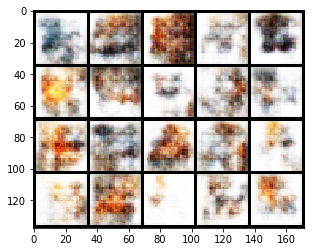

Epoch 30: Train D loss: -9.2772, G loss: 24.8564
Epoch 31: Train D loss: -7.1305, G loss: 25.8607
Epoch 32: Train D loss: -6.4941, G loss: 29.0802
Epoch 33: Train D loss: -9.2495, G loss: 28.1620
Epoch 34: Train D loss: -9.6770, G loss: 27.6237
Epoch 35: Train D loss: -10.8235, G loss: 26.0677
Epoch 36: Train D loss: -8.9504, G loss: 27.9475
Epoch 37: Train D loss: -9.7264, G loss: 25.9223
Epoch 38: Train D loss: -9.7176, G loss: 28.1270
Epoch 39: Train D loss: -8.9441, G loss: 27.2119


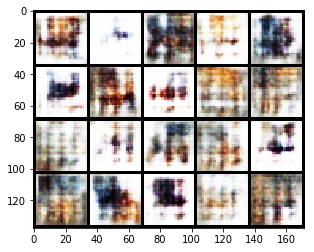

Epoch 40: Train D loss: -8.0188, G loss: 27.0796
Epoch 41: Train D loss: -7.4365, G loss: 28.0103
Epoch 42: Train D loss: -5.3609, G loss: 26.8766
Epoch 43: Train D loss: -7.3193, G loss: 27.3618
Epoch 44: Train D loss: -7.6922, G loss: 27.5929
Epoch 45: Train D loss: -7.2050, G loss: 29.2335
Epoch 46: Train D loss: -3.7934, G loss: 27.4973
Epoch 47: Train D loss: -4.7206, G loss: 30.1350
Epoch 48: Train D loss: -6.3491, G loss: 29.9703
Epoch 49: Train D loss: -6.3542, G loss: 28.3765


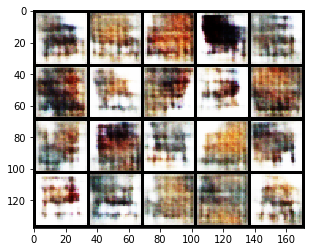

Epoch 50: Train D loss: -6.5252, G loss: 28.9431
Epoch 51: Train D loss: -6.5628, G loss: 28.5031
Epoch 52: Train D loss: -5.9090, G loss: 27.7441
Epoch 53: Train D loss: -5.2356, G loss: 28.2965
Epoch 54: Train D loss: -6.5216, G loss: 27.8616
Epoch 55: Train D loss: -5.9812, G loss: 27.6838
Epoch 56: Train D loss: -6.1764, G loss: 28.7705
Epoch 57: Train D loss: -5.2095, G loss: 28.6926
Epoch 58: Train D loss: -6.4024, G loss: 28.7579
Epoch 59: Train D loss: -4.9145, G loss: 29.4398


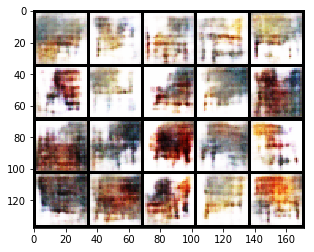

Epoch 60: Train D loss: -5.7234, G loss: 29.7687
Epoch 61: Train D loss: -5.7652, G loss: 29.3934
Epoch 62: Train D loss: -5.6513, G loss: 29.7915
Epoch 63: Train D loss: -4.9926, G loss: 31.3329
Epoch 64: Train D loss: -5.1966, G loss: 27.7112
Epoch 65: Train D loss: -6.1588, G loss: 30.5280
Epoch 66: Train D loss: -5.3466, G loss: 29.0290
Epoch 67: Train D loss: -6.1360, G loss: 31.0199
Epoch 68: Train D loss: -6.2385, G loss: 29.2623
Epoch 69: Train D loss: -5.5555, G loss: 30.4771


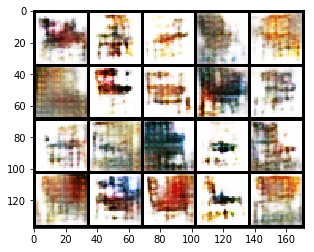

Epoch 70: Train D loss: -5.4261, G loss: 30.2815
Epoch 71: Train D loss: -4.6416, G loss: 28.6642
Epoch 72: Train D loss: -3.0066, G loss: 30.3110
Epoch 73: Train D loss: -3.7999, G loss: 30.6081
Epoch 74: Train D loss: -5.4106, G loss: 30.3732
Epoch 75: Train D loss: -5.1459, G loss: 30.7113
Epoch 76: Train D loss: -5.5468, G loss: 31.0952
Epoch 77: Train D loss: -5.0911, G loss: 31.1141
Epoch 78: Train D loss: -5.4734, G loss: 30.5150
Epoch 79: Train D loss: -5.2665, G loss: 31.8797


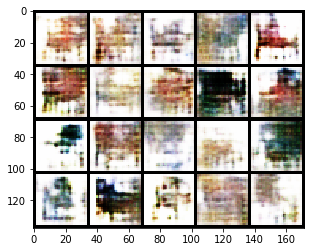

Epoch 80: Train D loss: -6.0447, G loss: 31.0499
Epoch 81: Train D loss: -5.4410, G loss: 30.6975
Epoch 82: Train D loss: -5.5538, G loss: 33.4146
Epoch 83: Train D loss: -5.6423, G loss: 30.0495
Epoch 84: Train D loss: -5.2056, G loss: 34.2815
Epoch 85: Train D loss: -6.3531, G loss: 32.4324
Epoch 86: Train D loss: -5.4180, G loss: 32.5969
Epoch 87: Train D loss: -4.4879, G loss: 31.7220
Epoch 88: Train D loss: -5.1217, G loss: 32.7364
Epoch 89: Train D loss: -6.1752, G loss: 33.1434


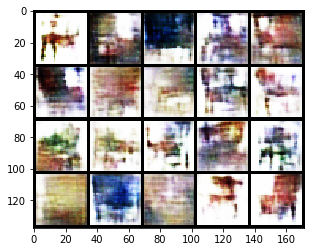

Epoch 90: Train D loss: -5.0128, G loss: 33.1788
Epoch 91: Train D loss: -5.9062, G loss: 33.2502
Epoch 92: Train D loss: -5.9269, G loss: 33.1936
Epoch 93: Train D loss: -6.2457, G loss: 34.8258
Epoch 94: Train D loss: -5.6793, G loss: 34.3756
Epoch 95: Train D loss: -4.7349, G loss: 33.3746
Epoch 96: Train D loss: -1.8953, G loss: 32.7575
Epoch 97: Train D loss: -3.4618, G loss: 32.3631
Epoch 98: Train D loss: -4.5576, G loss: 37.5851
Epoch 99: Train D loss: -6.0707, G loss: 36.6780


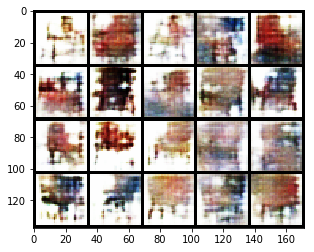

Epoch 100: Train D loss: -5.2213, G loss: 33.5016
Epoch 101: Train D loss: -5.3280, G loss: 36.8110
Epoch 102: Train D loss: -6.3207, G loss: 35.7076
Epoch 103: Train D loss: -6.2484, G loss: 35.5891
Epoch 104: Train D loss: -5.8322, G loss: 38.2581
Epoch 105: Train D loss: -6.5287, G loss: 37.0538
Epoch 106: Train D loss: -5.7123, G loss: 34.1074
Epoch 107: Train D loss: -5.1558, G loss: 36.4302
Epoch 108: Train D loss: -4.9599, G loss: 37.4604
Epoch 109: Train D loss: -6.1829, G loss: 34.9450


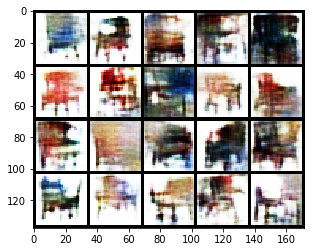

Epoch 110: Train D loss: -5.1710, G loss: 36.2632
Epoch 111: Train D loss: -2.2179, G loss: 35.8296
Epoch 112: Train D loss: -3.9034, G loss: 35.1907
Epoch 113: Train D loss: -5.0846, G loss: 40.1925
Epoch 114: Train D loss: -6.1804, G loss: 37.0441
Epoch 115: Train D loss: -5.9316, G loss: 39.0260
Epoch 116: Train D loss: -6.7106, G loss: 38.3322
Epoch 117: Train D loss: -6.5931, G loss: 40.5800
Epoch 118: Train D loss: -8.2924, G loss: 36.3757
Epoch 119: Train D loss: -5.9030, G loss: 39.4244


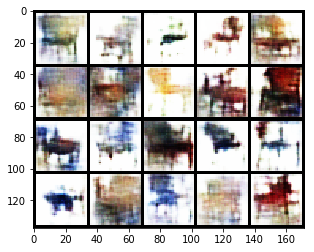

Epoch 120: Train D loss: -6.4090, G loss: 40.8129
Epoch 121: Train D loss: -5.6109, G loss: 37.4646
Epoch 122: Train D loss: -5.6378, G loss: 38.3526
Epoch 123: Train D loss: -7.0508, G loss: 40.1030
Epoch 124: Train D loss: -5.3071, G loss: 42.4852
Epoch 125: Train D loss: -6.8897, G loss: 37.1141
Epoch 126: Train D loss: -5.6757, G loss: 41.7586
Epoch 127: Train D loss: -6.9767, G loss: 40.3737
Epoch 128: Train D loss: -7.2025, G loss: 41.5476
Epoch 129: Train D loss: -6.8302, G loss: 41.2374


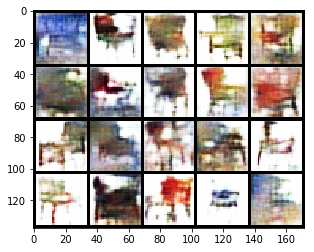

Epoch 130: Train D loss: -6.4963, G loss: 39.9017
Epoch 131: Train D loss: -5.8039, G loss: 39.0745
Epoch 132: Train D loss: -6.5792, G loss: 40.8144
Epoch 133: Train D loss: -5.8814, G loss: 41.3346
Epoch 134: Train D loss: -6.6015, G loss: 41.8603
Epoch 135: Train D loss: -4.6629, G loss: 36.8547
Epoch 136: Train D loss: -6.2245, G loss: 40.3997
Epoch 137: Train D loss: -3.9394, G loss: 38.4323
Epoch 138: Train D loss: -0.9387, G loss: 37.7135
Epoch 139: Train D loss: -1.5008, G loss: 38.5750


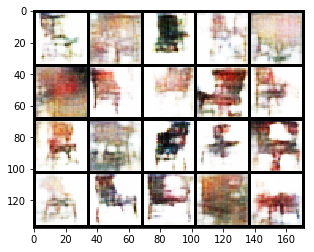

Epoch 140: Train D loss: -2.9083, G loss: 40.6817
Epoch 141: Train D loss: -3.0707, G loss: 41.8166
Epoch 142: Train D loss: -3.2704, G loss: 41.5472
Epoch 143: Train D loss: -3.8468, G loss: 41.8535
Epoch 144: Train D loss: -4.3097, G loss: 42.6175
Epoch 145: Train D loss: -4.9401, G loss: 43.0406
Epoch 146: Train D loss: -4.5854, G loss: 42.7851
Epoch 147: Train D loss: -5.6266, G loss: 43.1602
Epoch 148: Train D loss: -5.4626, G loss: 44.4953
Epoch 149: Train D loss: -5.5549, G loss: 43.4129


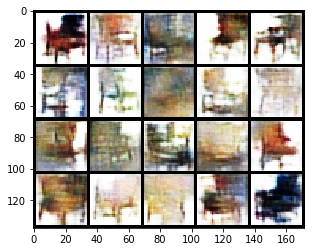

Epoch 150: Train D loss: -5.5780, G loss: 43.4779
Epoch 151: Train D loss: -6.2379, G loss: 43.9911
Epoch 152: Train D loss: -5.6922, G loss: 43.3848
Epoch 153: Train D loss: -6.2668, G loss: 42.4679
Epoch 154: Train D loss: -5.7705, G loss: 45.2050
Epoch 155: Train D loss: -2.1613, G loss: 37.0704
Epoch 156: Train D loss: -3.0348, G loss: 40.1394
Epoch 157: Train D loss: -5.0335, G loss: 43.2175
Epoch 158: Train D loss: -5.4996, G loss: 44.1705
Epoch 159: Train D loss: -6.2839, G loss: 41.8538


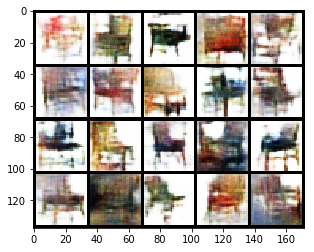

Epoch 160: Train D loss: -5.7473, G loss: 44.7346
Epoch 161: Train D loss: -5.9861, G loss: 43.0553
Epoch 162: Train D loss: -6.7474, G loss: 43.7586
Epoch 163: Train D loss: -5.7304, G loss: 44.3356
Epoch 164: Train D loss: -7.1373, G loss: 43.3344
Epoch 165: Train D loss: -5.3922, G loss: 42.1930
Epoch 166: Train D loss: -4.9008, G loss: 43.8112
Epoch 167: Train D loss: -6.0375, G loss: 45.2002
Epoch 168: Train D loss: -6.4326, G loss: 43.9515
Epoch 169: Train D loss: -6.0516, G loss: 41.6303


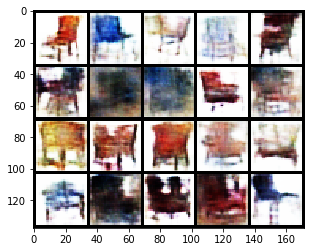

Epoch 170: Train D loss: -6.1396, G loss: 45.3555
Epoch 171: Train D loss: -6.8277, G loss: 43.4621
Epoch 172: Train D loss: -6.2150, G loss: 44.0418
Epoch 173: Train D loss: -6.5790, G loss: 44.4225
Epoch 174: Train D loss: -4.2241, G loss: 42.1544
Epoch 175: Train D loss: -6.3091, G loss: 44.2796
Epoch 176: Train D loss: -6.4589, G loss: 43.9345
Epoch 177: Train D loss: -6.3064, G loss: 44.4187
Epoch 178: Train D loss: -6.5476, G loss: 42.6403
Epoch 179: Train D loss: -6.5064, G loss: 44.3713


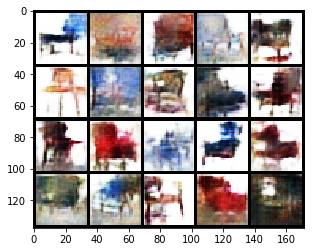

Epoch 180: Train D loss: -3.8592, G loss: 43.2511
Epoch 181: Train D loss: -0.6412, G loss: 41.1113
Epoch 182: Train D loss: -1.5863, G loss: 39.4215
Epoch 183: Train D loss: -2.6612, G loss: 40.5645
Epoch 184: Train D loss: -3.0605, G loss: 43.9135
Epoch 185: Train D loss: -3.4866, G loss: 43.3131
Epoch 186: Train D loss: -4.2529, G loss: 45.2208
Epoch 187: Train D loss: -4.7690, G loss: 44.5794
Epoch 188: Train D loss: -5.0306, G loss: 46.0195
Epoch 189: Train D loss: -5.3018, G loss: 45.4438


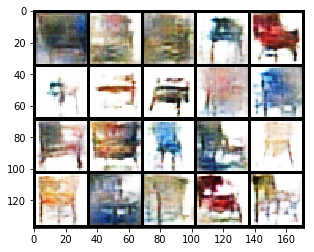

Epoch 190: Train D loss: -5.4925, G loss: 46.5071
Epoch 191: Train D loss: -5.1929, G loss: 46.0775
Epoch 192: Train D loss: -5.9170, G loss: 47.4996
Epoch 193: Train D loss: -5.5738, G loss: 46.7697
Epoch 194: Train D loss: -5.8709, G loss: 47.7915
Epoch 195: Train D loss: -6.2642, G loss: 47.1136
Epoch 196: Train D loss: -4.5990, G loss: 47.4890
Epoch 197: Train D loss: -6.0800, G loss: 46.9884
Epoch 198: Train D loss: -6.2107, G loss: 49.3067
Epoch 199: Train D loss: -7.0448, G loss: 44.9048


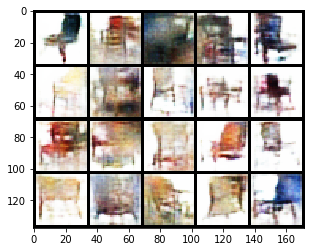

Epoch 200: Train D loss: -5.8332, G loss: 49.5153
Epoch 201: Train D loss: -6.1572, G loss: 47.8070
Epoch 202: Train D loss: -5.8882, G loss: 47.8396
Epoch 203: Train D loss: -5.3610, G loss: 46.9872
Epoch 204: Train D loss: -6.6335, G loss: 48.3257
Epoch 205: Train D loss: -5.8595, G loss: 48.4741
Epoch 206: Train D loss: -6.4226, G loss: 46.7320
Epoch 207: Train D loss: -6.1154, G loss: 48.0687
Epoch 208: Train D loss: -7.0130, G loss: 46.7722
Epoch 209: Train D loss: -7.0085, G loss: 47.7583


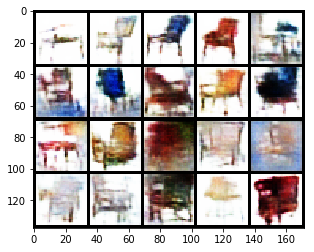

Epoch 210: Train D loss: -5.5663, G loss: 46.2517
Epoch 211: Train D loss: -3.7307, G loss: 46.6221
Epoch 212: Train D loss: -5.6993, G loss: 46.2336
Epoch 213: Train D loss: -7.1582, G loss: 48.4770
Epoch 214: Train D loss: -6.1034, G loss: 49.5320
Epoch 215: Train D loss: -7.2580, G loss: 47.3636
Epoch 216: Train D loss: -5.7791, G loss: 45.7380
Epoch 217: Train D loss: -1.9641, G loss: 47.0641
Epoch 218: Train D loss: -4.0518, G loss: 45.2149
Epoch 219: Train D loss: -4.7686, G loss: 51.0379


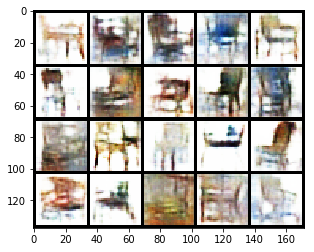

Epoch 220: Train D loss: -5.8605, G loss: 49.0802
Epoch 221: Train D loss: -5.0659, G loss: 47.2985
Epoch 222: Train D loss: -4.3829, G loss: 45.5611
Epoch 223: Train D loss: -6.8288, G loss: 49.8388
Epoch 224: Train D loss: -6.2081, G loss: 49.4024
Epoch 225: Train D loss: -6.9956, G loss: 50.2270
Epoch 226: Train D loss: -6.8870, G loss: 45.9942
Epoch 227: Train D loss: -7.1377, G loss: 51.7855
Epoch 228: Train D loss: -5.4073, G loss: 42.2085
Epoch 229: Train D loss: -6.6061, G loss: 48.8287


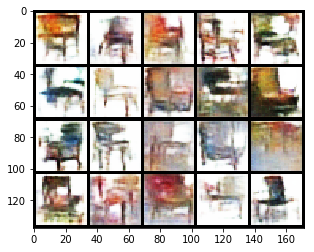

Epoch 230: Train D loss: -6.7816, G loss: 47.9921
Epoch 231: Train D loss: -6.5264, G loss: 47.3377
Epoch 232: Train D loss: -6.5960, G loss: 47.0118
Epoch 233: Train D loss: -6.3331, G loss: 48.1335
Epoch 234: Train D loss: -6.6237, G loss: 47.8792
Epoch 235: Train D loss: -5.6211, G loss: 46.8625
Epoch 236: Train D loss: -6.8086, G loss: 49.5708
Epoch 237: Train D loss: -2.3626, G loss: 46.3251
Epoch 238: Train D loss: -0.8401, G loss: 40.5178
Epoch 239: Train D loss: -1.0125, G loss: 37.6116


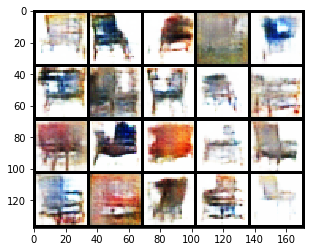

Epoch 240: Train D loss: -1.5197, G loss: 39.3440
Epoch 241: Train D loss: -2.0659, G loss: 39.2789
Epoch 242: Train D loss: -1.9411, G loss: 40.8136
Epoch 243: Train D loss: -2.4161, G loss: 41.1764
Epoch 244: Train D loss: -2.7033, G loss: 40.5417
Epoch 245: Train D loss: -3.0449, G loss: 42.3265
Epoch 246: Train D loss: -3.1678, G loss: 42.4918
Epoch 247: Train D loss: -3.3392, G loss: 42.9536
Epoch 248: Train D loss: -3.6631, G loss: 44.4289
Epoch 249: Train D loss: -3.9585, G loss: 44.6132


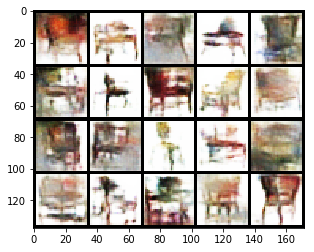

Epoch 250: Train D loss: -4.0776, G loss: 45.6434
Epoch 251: Train D loss: -4.3274, G loss: 46.7843
Epoch 252: Train D loss: -4.6176, G loss: 46.5009
Epoch 253: Train D loss: -4.7056, G loss: 46.6466
Epoch 254: Train D loss: -4.9999, G loss: 46.8420
Epoch 255: Train D loss: -4.9017, G loss: 48.0624
Epoch 256: Train D loss: -5.1735, G loss: 47.4189
Epoch 257: Train D loss: -5.4072, G loss: 49.2557
Epoch 258: Train D loss: -5.9065, G loss: 46.9422
Epoch 259: Train D loss: -5.7713, G loss: 50.2760


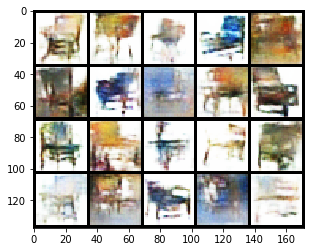

Epoch 260: Train D loss: -5.8742, G loss: 50.1904
Epoch 261: Train D loss: -5.9268, G loss: 48.7838
Epoch 262: Train D loss: -5.9258, G loss: 50.6031
Epoch 263: Train D loss: -5.8300, G loss: 48.8570
Epoch 264: Train D loss: -6.1167, G loss: 49.3896
Epoch 265: Train D loss: -6.0218, G loss: 49.6775
Epoch 266: Train D loss: -6.2045, G loss: 51.8193
Epoch 267: Train D loss: -8.0397, G loss: 48.4859
Epoch 268: Train D loss: -5.5478, G loss: 52.7798
Epoch 269: Train D loss: -6.5560, G loss: 49.8575


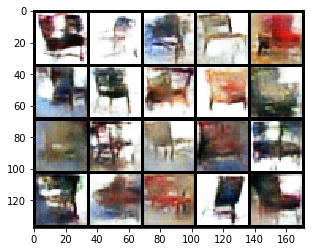

Epoch 270: Train D loss: -6.5542, G loss: 51.0454
Epoch 271: Train D loss: -7.0152, G loss: 49.1022
Epoch 272: Train D loss: -5.0318, G loss: 50.6867
Epoch 273: Train D loss: -7.6540, G loss: 52.3971
Epoch 274: Train D loss: -6.7483, G loss: 48.7935
Epoch 275: Train D loss: -6.8612, G loss: 53.1898
Epoch 276: Train D loss: -6.9415, G loss: 51.2724
Epoch 277: Train D loss: -7.2954, G loss: 52.7260
Epoch 278: Train D loss: -6.6528, G loss: 46.5296
Epoch 279: Train D loss: -6.8886, G loss: 52.1278


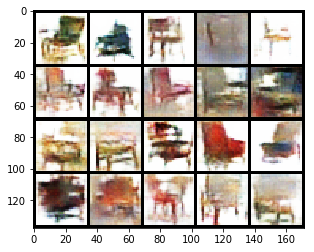

Epoch 280: Train D loss: -7.9190, G loss: 51.9591
Epoch 281: Train D loss: -7.1019, G loss: 51.0022
Epoch 282: Train D loss: -7.4352, G loss: 53.1224
Epoch 283: Train D loss: -5.9176, G loss: 51.2080
Epoch 284: Train D loss: -1.7599, G loss: 46.9386
Epoch 285: Train D loss: -4.1133, G loss: 47.6755
Epoch 286: Train D loss: -5.4350, G loss: 51.5119
Epoch 287: Train D loss: -5.8443, G loss: 53.4748
Epoch 288: Train D loss: -6.8639, G loss: 52.8194
Epoch 289: Train D loss: -6.8510, G loss: 51.6291


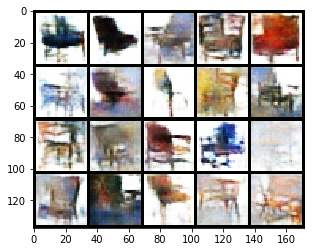

Epoch 290: Train D loss: -6.5713, G loss: 54.6825
Epoch 291: Train D loss: -7.6727, G loss: 51.4399
Epoch 292: Train D loss: -6.8426, G loss: 54.9000
Epoch 293: Train D loss: -4.9544, G loss: 50.6197
Epoch 294: Train D loss: -4.9324, G loss: 51.8459
Epoch 295: Train D loss: -7.0721, G loss: 53.9010
Epoch 296: Train D loss: -7.0553, G loss: 52.1815
Epoch 297: Train D loss: -7.7607, G loss: 54.6807
Epoch 298: Train D loss: -8.3698, G loss: 52.1802
Epoch 299: Train D loss: -8.3353, G loss: 55.7381


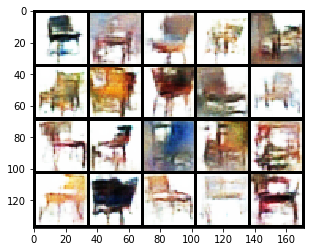

In [93]:
# hyper params

# z dim
latent_dim = 100

# image size and channel
image_size=32
image_channel=3

# Adam lr and betas
learning_rate = 0.0002
betas = (0.5, 0.999)

# epochs and batch size
n_epochs = 300
batch_size = 32

# device : cpu or cuda:0/1/2/3
device = torch.device('cuda:0')

# n_d: train D
n_d = 2
lambda_ = 10

# mnist dataset and dataloader
train_dataset = load_furniture_data()
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# G and D model, use DCGAN, note that sigmoid is removed in D
G = DCGenerator(image_size=image_size, latent_dim=latent_dim, output_channel=image_channel).to(device)
D = DCDiscriminator(image_size=image_size, input_channel=image_channel, sigmoid=False).to(device)

# G and D optimizer, use Adam or SGD
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

d_loss_hist = []
g_loss_hist = []

for epoch in range(n_epochs):
    d_loss, g_loss = wgan_gp_train(trainloader, G, D, G_optimizer, D_optimizer, device, 
                           z_dim=latent_dim, lambda_=lambda_, n_d=n_d)
    print('Epoch {}: Train D loss: {:.4f}, G loss: {:.4f}'.format(epoch, d_loss, g_loss))
    
    d_loss_hist.append(d_loss)
    g_loss_hist.append(g_loss)
    
    if epoch == 0 or (epoch + 1) % 10 == 0:
        visualize_results(G, device, latent_dim)

同理,观察loss曲线和D上的参数分布.

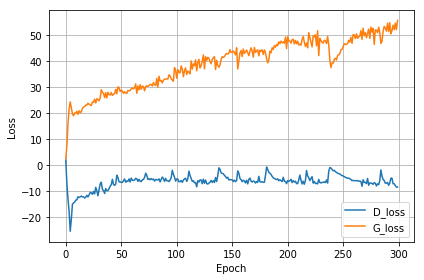

In [94]:
loss_plot(d_loss_hist, g_loss_hist)

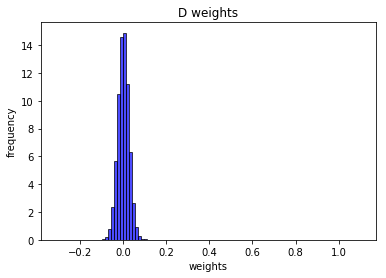

In [95]:
show_d_params(D)

#### **作业**: 
观察WGAN和WGAN-GP生成器生成的图片效果,它们在相同epoch时生成的图片效果(或者说生成图片达到效果所需要epoch数量),它们的loss曲线以及D的参数分布,说说有什么不同?

**答**:
WGAM的参数分布呈一个U字，而WGAN-GP参数呈一个正态分布的形状，这里因为WGAN中的参数在更新后总会被截断到0.001或者-0.001，这样就会让整个系统特别容易出现梯度消失梯度爆炸的问题，这里可能是因为梯度爆炸导致每一次更新都特别大而是的参数都集中在0.001和-0.001上最后呈现一个U性的参数分布图，而在WGAN-GP上提出了一种新的lipschitz连续性限制手法—梯度惩罚，解决了训练梯度消失梯度爆炸的问题，所以参数图像会更加趋向于正太分布的形状；WGAN的loss参数的极值偏小，而WGAN的跨度就会比较大。因为WGAN总是会被截断在-0.001和0.001之间，所以